# COMP4318/5318 Assignment 2: Image Classification

### Group number: 28  , SID1: 530377698 , SID2: 490189658, SID3: 530208071

This template notebook includes code to load the  dataset and a skeleton for the main sections that should be included in the notebook. Please stick to this struture for your submitted notebook.

Please focus on making your code clear, with appropriate variable names and whitespace. Include comments and markdown text to aid the readability of your code where relevant. See the specification and marking criteria in the associated specification to guide you when completing your implementation.

## Setup and dependencies
Please use this section to list and set up all your required libraries/dependencies and your plotting environment. 

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.svm import SVC

from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
import time
import warnings
warnings.filterwarnings("ignore")
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import torch
from torch.optim import Adam
from torch.nn import CrossEntropyLoss
import seaborn as sns
import torch
import torch.nn as nn
import torch.functional as tf
import torch.optim as optim

## 1. Data loading, exploration, and preprocessing


Code to load the dataset is provided in the following cell. Please proceed with your data exploration and preprocessing in the remainder of this section.

In [16]:
# Load the dataset training and test sets as numpy arrays
# assuming Assignment2Data folder is present in the same directory 
# as the notebook
X_train_full = np.load('Assignment2Data/X_train.npy')
y_train_full = np.load('Assignment2Data/y_train.npy')
X_test = np.load('Assignment2Data/X_test.npy')
y_test = np.load('Assignment2Data/y_test.npy')
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full, train_size=0.8, random_state=0)

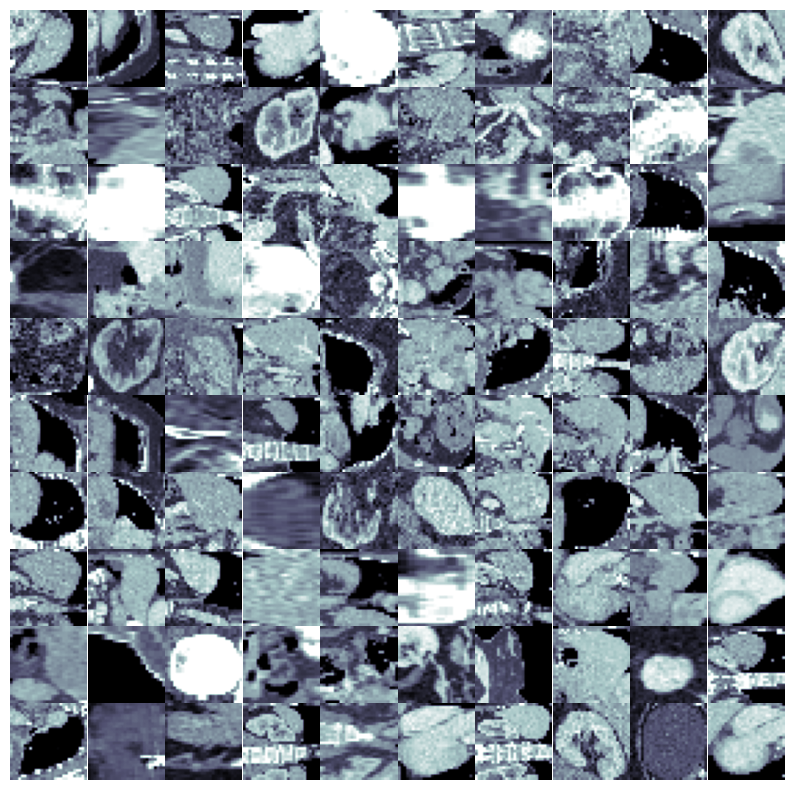

In [17]:
# preview of data
def pre_plot(X):
    fig, axes = plt.subplots(10, 10, figsize=(10, 10))
    for i in range(10):
        for j in range(10):
            ax = axes[i, j]
            # plot data in order ixj with matrix form
            ax.imshow(X[i * 10 + j], cmap=plt.cm.bone)
            # bone color set in medical images
            ax.axis("off")
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.show()

pre_plot(X_train_full)


In [18]:
def count_labels(y):
    # count unique labels
    label_counts = pd.Series(y).value_counts()
    label_counts_df = pd.DataFrame({'Label': label_counts.index, 'Count': label_counts.values})
    
    return label_counts_df

label_counts_df = count_labels(y_train_full)
print(label_counts_df)

    Label  Count
0       6   4201
1      10   2196
2       0   1741
3       9   1682
4       5   1651
5       4   1562
6       8   1546
7       7   1519
8       3    978
9       1    936
10      2    916


In [19]:
y_train_full_series = pd.Series(y_train_full)
# describe of y_train_full_series
y_train_full_series.describe()

count    18928.000000
mean         5.574281
std          3.014377
min          0.000000
25%          4.000000
50%          6.000000
75%          8.000000
max         10.000000
dtype: float64

In [20]:
# input layer require one dimensional data shape(MLP)
# new data reshape should be (x, 784)
X_train_full = X_train_full / 255.
X_train = X_train / 255.
X_valid = X_valid / 255.
X_test = X_test / 255.
print(X_train_full.shape)
print(X_train.shape)
print(X_test.shape)
print(X_valid.shape)

(18928, 28, 28)
(15142, 28, 28)
(4732, 28, 28)
(3786, 28, 28)


In [21]:
# input layer require one dimensional data shape(MLP)
# new data reshape should be (x, 784)
X_train_full_od = X_train_full.reshape(-1, 28*28)
X_train_od = X_train.reshape(-1, 28*28)
X_valid_od = X_valid.reshape(-1, 28*28)
X_test_od = X_test.reshape(-1, 28*28)
print(X_train_full_od.shape)
print(X_train_od.shape)
print(X_test_od.shape)
print(X_valid_od.shape)

(18928, 784)
(15142, 784)
(4732, 784)
(3786, 784)


In [22]:
# CNN requires NCHW
# transform numpy data into tensors
X_train_full_cnn = torch.from_numpy(X_train_full).unsqueeze(1)# add 1 new dimension
X_train_cnn = torch.from_numpy(X_train).unsqueeze(1)
X_valid_cnn = torch.from_numpy(X_valid).unsqueeze(1)
X_test_cnn = torch.from_numpy(X_test).unsqueeze(1)
# (Torch.Unsqueeze — PyTorch 2.3 Documentation, n.d.), (Torch.From_Numpy — PyTorch 2.3 Documentation, n.d.)
print(X_train_full_cnn.shape)
print(X_train_cnn.shape)
print(X_test_cnn.shape)
print(X_valid_cnn.shape)
# new data shape should be([x, 1, 28, 28])

torch.Size([18928, 1, 28, 28])
torch.Size([15142, 1, 28, 28])
torch.Size([4732, 1, 28, 28])
torch.Size([3786, 1, 28, 28])


In [23]:
# cross validation in grid search pca
pca = PCA(n_components = 0.95)
X_train_full_pc = pca.fit_transform(X_train_full_od) #fit the pca data
X_test_pc = pca.transform(X_test_od) #transfer into low dimension data
print(X_train_full_pc.shape)
print(X_test_pc.shape)

(18928, 389)
(4732, 389)


In [24]:
# tuning parameters in grid search pca
pca = PCA(n_components = X_train_full_pc.shape[-1]) # size of the last dimension of X_train_full_pc
X_train_pc = pca.fit_transform(X_train_od)#fit the pca data
X_valid_pc = pca.transform(X_valid_od)#transfer into low dimension data
print(X_train_pc.shape)
print(X_valid_pc.shape)

(15142, 389)
(3786, 389)


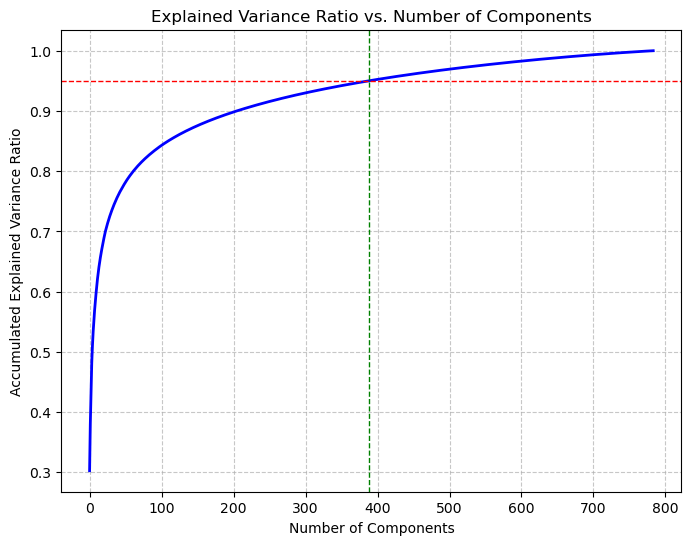

Number of components at 95% explained variance ratio point: 389


In [25]:
# principle component analysis
pca = PCA()
pca.fit(X_train_full_od)
cumsum = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8, 6))
plt.plot(cumsum, color='blue', linestyle='-', linewidth=2)
plt.xlabel('Number of Components')
plt.ylabel('Accumulated Explained Variance Ratio')
plt.title('Explained Variance Ratio vs. Number of Components')
plt.grid(True, linestyle='--', alpha=0.7)
plt.axhline(y=0.95, color='red', linestyle='--', linewidth=1)# (matplotlib.pyplot.axhline — Matplotlib 3.8.4 Documentation, n.d.)
plt.axvline(x=np.argmax(cumsum >= 0.95), color='green', linestyle='--', linewidth=1)
plt.show()
# when accumulated variance ratio is 0.9, corresponding number of components = 389
n_components = np.argmax(cumsum >= 0.95) + 1

print(f"Number of components at 95% explained variance ratio point: {n_components}")


### Examples of preprocessed data
Please print/display some examples of your preprocessed data here.

In [26]:
print(f"RAW:{X_train_full_od.shape}")
print(f"PCA:{X_train_full_pc.shape}")
print(f"CNN:{X_train_full_cnn.shape}")
print(X_train_pc[0][:100])

RAW:(18928, 784)
PCA:(18928, 389)
CNN:torch.Size([18928, 1, 28, 28])
[-9.84864525e+00 -2.31965547e+00 -9.65720890e-01 -2.07823339e+00
  9.74359917e-01 -8.62242728e-01  5.77113289e-01 -3.89448350e-02
  3.91136005e-01 -6.24426385e-01 -3.83542872e-01 -6.42268216e-01
 -2.01859190e+00 -1.35162304e+00  6.93017306e-03 -6.11866867e-01
  1.60210101e-01 -2.54075324e-01  3.26581999e-02  1.74440357e+00
 -6.57494035e-01  6.68050461e-02  2.05599712e-01 -3.41382867e-01
 -2.00632377e-01 -1.14379914e-01 -3.33333312e-01  2.69220899e-01
  3.51182233e-01  3.18582099e-01  5.46109842e-01  1.68279880e-01
  2.58294964e-01  2.18843927e-01 -7.85638705e-01  2.52099017e-02
  1.37209331e-01 -4.60285036e-01 -7.87586589e-02 -1.14996228e-01
 -5.22987462e-02  1.75361217e-01 -3.24011878e-01  4.66159361e-01
 -3.11770089e-01 -7.88244014e-02 -1.44578291e-01  1.80138897e-01
 -9.55608471e-02  3.80673529e-01 -3.57713639e-01 -2.36932071e-01
  2.96676205e-01  1.43003917e-02  5.52312148e-02 -2.04414365e-01
 -2.88583850e-01  2.2

## 2. Algorithm design and setup

### Algorithm of choice from first six weeks of course

In [27]:
#cvkfold 
def cvkfold():
    return StratifiedKFold(n_splits=2, shuffle=True)#(Sklearn.Model_Selection.StratifiedKFold, n.d.)
# n=10 folds crossvalidation
# Call function
cvkfold = cvkfold()

In [28]:
# define param_grid
param_grid = {"C": [0.001, 0.01, 0.1, 1], "kernel": ["linear", "poly", "rbf"]}

# define clf as classifier in Gridsearch corss-validation
clf = GridSearchCV(SVC(), param_grid, cv = cvkfold, n_jobs = -1)
clf.fit(X_train_full_pc, y_train_full)# (Sklearn.Model_Selection.GridSearchCV, n.d.)

GridSearchCV(cv=StratifiedKFold(n_splits=2, random_state=None, shuffle=True),
             estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 1],
                         'kernel': ['linear', 'poly', 'rbf']})

In [29]:
def train_svm(X_train, X_test, y_train, y_test, kernel='rbf', C=1, param_grid=None):
    # define SVC model
    model = SVC()
    # out put best parameters
    print("Best parameters:")
    print(clf.best_params_)
    # use best parameter to build the model
    best_model = SVC(**clf.best_params_)
    best_model.fit(X_train, y_train)

    accuracy = best_model.score(X_test, y_test)#calculate accuracy
    print(f"Accuracy with kernel={clf.best_params_['kernel']}, C={clf.best_params_['C']}: {accuracy}")# output accuracy with different parameters
    #(Sklearn.svm.SVC, n.d.)
    return best_model

### Fully connected neural network

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import torch
from torch.utils.data import DataLoader, TensorDataset

def load_and_preprocess_data(data_folder, batch_size, train=True):
    # load data
    X_train_full = np.load(f'{data_folder}/X_train.npy')
    y_train_full = np.load(f'{data_folder}/y_train.npy')
    X_test = np.load(f'{data_folder}/X_test.npy')
    y_test = np.load(f'{data_folder}/y_test.npy')
    
    # split the data
    X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full, train_size=0.8, random_state=42)
    
    # normalization
    X_train_od = X_train.reshape(-1, 28*28) / 255.0
    X_valid_od = X_valid.reshape(-1, 28*28) / 255.0
    X_test_od = X_test.reshape(-1, 28*28) / 255.0
    
    # define data loader
    train_dataset = TensorDataset(torch.from_numpy(X_train_od), torch.from_numpy(y_train))# (torch.utils.data — PyTorch 2.3 Documentation, n.d.)
    valid_dataset = TensorDataset(torch.from_numpy(X_valid_od), torch.from_numpy(y_valid))
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    valid_loader = DataLoader(valid_dataset, batch_size=batch_size)
    # (Torch.Unsqueeze — PyTorch 2.3 Documentation, n.d.), (Torch.From_Numpy — PyTorch 2.3 Documentation, n.d.)
    return train_loader, valid_loader


In [31]:
# Building of the Multi-layer Perceptron neuro network
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim, layers=[], dropout=None, activation=nn.ReLU()):
        super(MLP, self).__init__()
        # Initialize an empty list to save the layers of the network
        modules = []
        for i, layer_dim in enumerate(layers):
            # check the first layer order
            if i == 0:
                # add a linear layer from the previous hidden layer dimension
                modules.append(nn.Linear(input_dim, layer_dim))
            else:
                modules.append(nn.Linear(layers[i-1], layer_dim))
            # following activation function
            modules.append(activation())
            # add a dropout layer for dropout probability is nominated
            if dropout:
                modules.append(nn.Dropout(dropout))
        # add a dropout layer for dropout probability is nominated        
        modules.append(nn.Linear(layers[-1] if layers else input_dim, output_dim))
        self.network = nn.Sequential(*modules) # (Sequential — PyTorch 2.3 Documentation, n.d.)
    
    def forward(self, x):
        return self.network(x)# (AmirSh, n.d.)

def train_evaluate(train_loader, valid_loader, device, input_dim, output_dim, params):
    results = []# Initialize an empty list to save the layers of the network
    for layers, lr, dropout in params:
        model = MLP(input_dim, output_dim, layers, dropout).to(device)
        optimizer = Adam(model.parameters(), lr=lr)
        # define the loss function as Cross Entropy Loss
        criterion = CrossEntropyLoss()
        # set the model to training mode
        model.train()
        start_time = time()
        for epoch in range(10):  # evaluate every 10 epochs
            for inputs, labels in train_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                # reset gradients
                optimizer.zero_grad()
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                # backward pass
                loss.backward()
                optimizer.step()
        elapsed_time = time() - start_time
        # set the model to evaluation mode
        model.eval()
        # initialize variables to count total and correct predictions
        total, correct = 0, 0
        # disable gradient calculation during evaluation
        with torch.no_grad():
            for inputs, labels in valid_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                # get predicted labels
                _, predicted = torch.max(outputs.data, 1)
                # update total size
                total += labels.size(0)
                # update correct prediction count
                correct += (predicted == labels).sum().item()
        # calculate accuracy
        accuracy = correct / total
        results.append((layers, lr, dropout, accuracy, elapsed_time))# append results (architecture, learning rate, dropout rate, accuracy, elapsed time) to the results list
    # return the results list
    return results


In [32]:

# Building of the Multi-layer Perceptron neuro network
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim, layers=[], dropout=None, activation=nn.ReLU):
        super(MLP, self).__init__()
        modules = []
        for i, layer_dim in enumerate(layers):
            if i == 0:
                modules.append(nn.Linear(input_dim, layer_dim))
            else:
                modules.append(nn.Linear(layers[i-1], layer_dim))
            modules.append(activation()) 
            if dropout:
                modules.append(nn.Dropout(dropout))
        modules.append(nn.Linear(layers[-1] if layers else input_dim, output_dim))
        self.network = nn.Sequential(*modules)
    
    def forward(self, x):
        return self.network(x)# (AmirSh, n.d.)


#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = MLP(input_dim=784, output_dim=10, layers=[256, 512], dropout=0.5)
#model.to(device)  # make sure running on gpu


# define data loader
def create_data_loader(X, y, batch_size):
    # Pytorch TensorDataset
    dataset = TensorDataset(torch.from_numpy(X), torch.from_numpy(y))
    # PyTorch DataLoader
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
    return loader

# define train model
def train_model(model, train_loader, valid_loader, epochs, optimizer, criterion):
    # Loop each epochs
    for epoch in range(epochs):
        model.train()
        for data, target in train_loader:
            optimizer.zero_grad()# zero the gradients
            output = model(data.float())
            loss = criterion(output, target)
            # backward pass
            loss.backward()
            # single optimization step
            optimizer.step()
        
        model.eval()
        with torch.no_grad():
            # average validation loss
            valid_loss = sum(criterion(model(data.float()), target) for data, target in valid_loader) / len(valid_loader)
        print(f'Epoch {epoch+1}, Validation Loss: {valid_loss.item()}')


In [33]:
class MLP(nn.Module):
    def __init__(self, input_dim, output_dim, layer = [], dropout = None, activ = nn.ReLU()):
        super(MLP, self).__init__()
        self.mlp = nn.Sequential()
        if len(layer) < 1:
            self.mlp.append(nn.Linear(input_dim, output_dim))
            self.mlp.append(activ)
        else:
            self.mlp.append(nn.Linear(input_dim, layer[0]))
            self.mlp.append(activ)
            if dropout:
                self.mlp.append(nn.Dropout(dropout))
            for i in range(1, len(layer)):
                self.mlp.append(nn.Linear(layer[i-1], layer[i]))
                self.mlp.append(activ)
                if dropout:
                    self.mlp.append(nn.Dropout(dropout))
            self.mlp.append(nn.Linear(layer[-1], output_dim))

    def forward(self, X):
        X = self.mlp(X)
        return X

In [34]:
def load_data_mlp(batch_size=512, train=True):
    if train:
        train_dataset = TensorDataset(torch.from_numpy(X_train_pc), torch.from_numpy(y_train))# (torch.utils.data — PyTorch 2.3 Documentation, n.d.)
        valid_dataset = TensorDataset(torch.from_numpy(X_valid_pc), torch.from_numpy(y_valid))
        train_loader = DataLoader(dataset = train_dataset, batch_size = batch_size, shuffle = True)
        valid_loader = DataLoader(dataset = valid_dataset, batch_size = batch_size)
        return train_loader, valid_loader
    else:
        train_dataset = TensorDataset(torch.from_numpy(X_train_full_pc), torch.from_numpy(y_train_full))# (torch.utils.data — PyTorch 2.3 Documentation, n.d.)
        test_dataset = TensorDataset(torch.from_numpy(X_test_pc), torch.from_numpy(y_test))
        train_loader = DataLoader(dataset = train_dataset, batch_size = batch_size, shuffle=True)
        test_loader = DataLoader(dataset = test_dataset, batch_size = batch_size)
        # (Torch.Unsqueeze — PyTorch 2.3 Documentation, n.d.), (Torch.From_Numpy — PyTorch 2.3 Documentation, n.d.)
        return train_loader, test_loader

In [35]:
#Optimizer
def build_optimizer(model, learning_rate, weight_decay):
    # SGD — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.optim.SGD.html
    return optim.SGD(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

In [36]:
def train_model(train_loader, test_loader, model, epochs, optimizer, device):
    # Initialize lists to store training metrics
    loss_list = []
    acc_list = []
    test_acc_list = []
    time_list = []# Store taken for each epoch for each list
    # define loss function
    loss_func = nn.CrossEntropyLoss()
    for epoch in range(epochs):
        # initialize variables to store intermediate loss and predictions
        model.train()
        loss_temp =[]
        pred = []
        ground_truth = []  # save ground truth labels for each batch
        s = time()# start timer
        for data, label in train_loader:
            ground_truth.extend(list(label.numpy()))
            data = data.to(device).to(torch.float32)
            label = label.to(device).view(-1)
            # reset gradients
            optimizer.zero_grad()

            output = model(data)
            loss = loss_func(output, label)
            loss.backward()
            # backward pass
            optimizer.step()
            # append loss to loss_temp list
            loss_temp.append(loss.item())
            # get predicted labels
            predict = torch.argmax(output, -1)
            # extend pred list with predicted labels
            pred.extend(list(predict.cpu().numpy()))
        # append total time taken for the epoch to time_list    
        time_list.append(time() - s)
        # append sum of losses for the epoch to loss_list
        loss_list.append(sum(loss_temp))
        # calculate accuracy for the epoch and append to acc_list
        acc_list.append(accuracy_score(pred, ground_truth))
        # set model to evaluation mode
        model.eval()
        # reset pred and ground_truth lists for test evaluation
        pred = []
        ground_truth = []
        # iterate over batches in the test loader

        for data, label in test_loader:
            # extend ground_truth list with true labels
            ground_truth.extend(list(label.numpy()))
            # move data to device and ensure data type is float32
            data = data.to(device).to(torch.float32)
            label = label.to(device).view(-1)
            output = model(data)
            # get predicted labels
            predict = torch.argmax(output,-1)
            # extend pred list with predicted labels
            pred.extend(list(predict.cpu().numpy()))
            
        test_acc_list.append(accuracy_score(pred, ground_truth))
        # calculate test accuracy for the epoch and append to test_acc_list
        # print epoch, loss, train accuracy, test accuracy, and time cost
        print(f"Epoch: {epoch}, loss: {loss_list[-1]:.5f}, train_acc: {acc_list[-1]*100:.2f}%, test_acc:{test_acc_list[-1]*100:.2f}%, time_cost:{time_list[-1]:.3f}")
     # return model and lists
    return model,loss_list, acc_list, test_acc_list, time_list

In [37]:
# validation dataset
def eval_mlp(input_dim, output_dim, layer = [], dropout = None, activ = nn.ReLU(),
             epochs = 50, learning_rate = 0.001, weight_decay = 0.95, batch_size = 512):
    # check running on GPU is available, otherwise use CPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = MLP(input_dim, output_dim, layer, dropout, activ).to(device)
    optimizer = build_optimizer(model, learning_rate, weight_decay)
    # call train_model and evaluate on validation set
    train_loader, valid_loader = load_data_mlp(batch_size, train = True)
    _,loss_list, acc_list, test_acc_list, time_list =train_model(train_loader, valid_loader, model, epochs, optimizer, device)
    # return measurements
    return model,loss_list, acc_list, test_acc_list, time_list

In [38]:
# test dataset
def test_mlp(input_dim, output_dim, layer, dropout, activ, epochs, learning_rate, weight_decay, batch_size):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = MLP(input_dim, output_dim, layer, dropout, activ).to(device)
    optimizer = build_optimizer(model, learning_rate, weight_decay)
    
    # Correctly handle DataLoader outputs
    train_loader, test_loader = load_data_mlp(batch_size, train = False)  # This returns two DataLoader objects
    
    # Now train and evaluate the model using these loaders
    model, loss_list, acc_list, test_acc_list, time_list = train_model(train_loader, test_loader, model, epochs, optimizer, device)
    
    return model, loss_list, acc_list, test_acc_list, time_list




### Convolutional neural network

In [40]:
class cnn(nn.Module): 
    def __init__(self, in_channel, n_class):
        super(cnn, self).__init__()
        # build cnn layers
        self.cnn = nn.Sequential(
            # Convolutional layer with 16 filters, kernel size 3x3, and padding 1
            nn.Conv2d(in_channel, 16, 3, 1, 1),
            #(Conv2d — PyTorch 2.3 Documentation, n.d.)
            nn.LeakyReLU(),
            #(LeakyReLU — PyTorch 2.3 Documentation, n.d.)
            nn.Conv2d(16,32,3,1,1),
            # 32 filters, kernel size 3x3, and padding 1
            nn.LeakyReLU(),
            #(LeakyReLU — PyTorch 2.3 Documentation, n.d.)
            nn.MaxPool2d(2),
            # (MaxPool2d — PyTorch 2.3 Documentation, n.d.)
            nn.Conv2d(32,64,3,1,1),
            # 64 filters, kernel size 3x3, and padding 1
            nn.LeakyReLU(),
            #(LeakyReLU — PyTorch 2.3 Documentation, n.d.)
            nn.Conv2d(64,128,3,1,1),
            # 128 filters, kernel size 3x3, and padding 1        
            nn.LeakyReLU(),
            #(LeakyReLU — PyTorch 2.3 Documentation, n.d.)
            nn.MaxPool2d(2),# Max pooling layer with kernel size 2x2 and stride 2
            # (MaxPool2d — PyTorch 2.3 Documentation, n.d.)
            nn.Flatten()
            # (Flatten — PyTorch 2.3 Documentation, n.d.)
        )
        self.mlp = nn.Linear(128*7*7,n_class)
    def forward(self, X):
        # forward pass through the CNN layers
        X = self.cnn(X)
        X = self.mlp(X)
        return X
class cnn_bn(nn.Module): 
    def __init__(self, in_channel, n_class):
        super(cnn_bn, self).__init__()
        self.cnn = nn.Sequential(
            # Convolutional layer with 16 filters, kernel size 3x3, and padding 1
            nn.Conv2d(in_channel, 16, 3, 1, 1),
            #(Conv2d — PyTorch 2.3 Documentation, n.d.)
            nn.BatchNorm2d(16), # (BatchNorm2d — PyTorch 2.3 Documentation, n.d.)
            nn.LeakyReLU(), #(LeakyReLU — PyTorch 2.3 Documentation, n.d.)
            nn.Conv2d(16,32,3,1,1), #32 filters, kernel size 3x3, and padding 1
            nn.BatchNorm2d(32), # (BatchNorm2d — PyTorch 2.3 Documentation, n.d.)
            nn.LeakyReLU(), #(LeakyReLU — PyTorch 2.3 Documentation, n.d.)
            nn.MaxPool2d(2), # (MaxPool2d — PyTorch 2.3 Documentation, n.d.)
            nn.Conv2d(32,64,3,1,1), #64 filters, kernel size 3x3, and padding 1
            nn.BatchNorm2d(64), # (BatchNorm2d — PyTorch 2.3 Documentation, n.d.)
            nn.LeakyReLU(), #(LeakyReLU — PyTorch 2.3 Documentation, n.d.)
            nn.Conv2d(64,128,3,1,1),  #128 filters, kernel size 3x3, and padding 1
            nn.BatchNorm2d(128),  # (BatchNorm2d — PyTorch 2.3 Documentation, n.d.)    
            nn.LeakyReLU(), #(LeakyReLU — PyTorch 2.3 Documentation, n.d.)
            #(LeakyReLU — PyTorch 2.3 Documentation, n.d.)
            nn.MaxPool2d(2),# Max pooling layer with kernel size 2x2 and stride 2
            # (MaxPool2d — PyTorch 2.3 Documentation, n.d.)
            nn.Flatten()# (Flatten — PyTorch 2.3 Documentation, n.d.)
        )
        self.mlp = nn.Linear(128*7*7,n_class)
    def forward(self, X):
        # forward pass through the CNN layers
        X = self.cnn(X)
        X = self.mlp(X)
        return X

In [41]:
# loader for cnn
def load_data_cnn(batch_size=512, train=True):
    if train:
        train_dataset = TensorDataset(X_train_cnn, torch.from_numpy(y_train))# (torch.utils.data — PyTorch 2.3 Documentation, n.d.)
        valid_dataset = TensorDataset(X_valid_cnn, torch.from_numpy(y_valid))
        train_loader = DataLoader(dataset = train_dataset, batch_size = batch_size, shuffle = True)
        valid_loader = DataLoader(dataset = valid_dataset, batch_size = batch_size)
        return train_loader, valid_loader
    else:
        train_dataset = TensorDataset(X_train_full_cnn, torch.from_numpy(y_train_full))# (torch.utils.data — PyTorch 2.3 Documentation, n.d.)
        test_dataset = TensorDataset(X_test_cnn, torch.from_numpy(y_test))
        train_loader = DataLoader(dataset = train_dataset, batch_size = batch_size, shuffle=True)
        test_loader = DataLoader(dataset = test_dataset, batch_size = batch_size)
        # (Torch.Unsqueeze — PyTorch 2.3 Documentation, n.d.), (Torch.From_Numpy — PyTorch 2.3 Documentation, n.d.)
        return train_loader, test_loader

In [42]:
# cnn evaluation
def eval_cnn(in_channel, n_class, bn = True, epochs = 50, learning_rate = 0.001, weight_decay = 0.95, batch_size = 512):
    # check running on GPU is available, otherwise use CPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    # model = cnn(in_channel, n_class).to(device)
    # check if running on cnn_bn or not
    if bn:
        model = cnn_bn(in_channel, n_class).to(device)
    else:
        model = cnn(in_channel, n_class).to(device)
    optimizer = build_optimizer(model,learning_rate, weight_decay)
    # call data loader for training and validation
    train_loader, valid_loader = load_data_cnn(batch_size, train = True)
    # Train the model and collect metrics
    _,loss_list, acc_list, test_acc_list, time_list =train_model(train_loader, valid_loader, model, epochs, optimizer, device)
    return model,loss_list, acc_list, test_acc_list, time_list

In [43]:
# test dataset
def test_cnn(in_channel, n_class, bn = True, epochs = 50, learning_rate = 0.001, weight_decay = 0.95, batch_size = 512):
    # check running on GPU is available, otherwise use CPU
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    #model = cnn(in_channel, n_class).to(device)
    # check if running on cnn_bn or not
    if bn:
        model = cnn_bn(in_channel, n_class).to(device)
    else:
        model = cnn(in_channel, n_class).to(device)
    optimizer = build_optimizer(model,learning_rate, weight_decay)
    # call data loader for training and validation
    train_loader, test_loader = load_data_cnn(batch_size, train = True)
    # Train the model and collect metrics
    _, loss_list, acc_list, test_acc_list, time_list =train_model(train_loader, test_loader, model, epochs, optimizer, device)
    return model,loss_list, acc_list, test_acc_list, time_list

## 3. Hyperparameter tuning

### Algorithm of choice from first six weeks of course

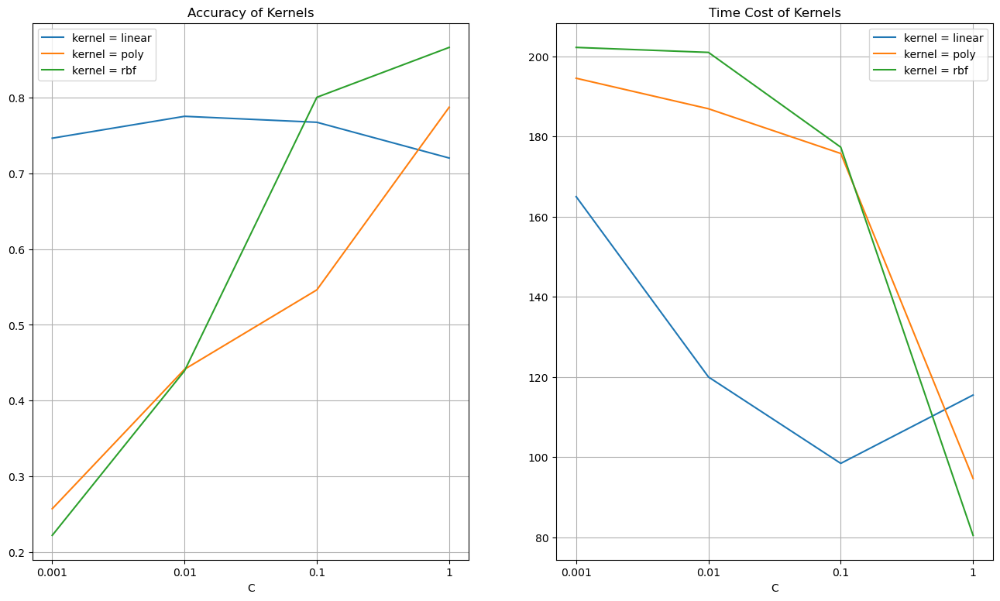

In [44]:
acc = []
time_list = []
for i in range(len(param_grid["kernel"])):
    acc_tmp = []
    time_tmp = []
    for j in range(len(clf.cv_results_["params"])):
        if clf.cv_results_["params"][j]['kernel'] == param_grid["kernel"][i]:
            acc_tmp.append(clf.cv_results_["mean_test_score"][j])
            time_tmp.append(clf.cv_results_["mean_fit_time"][j] + clf.cv_results_["mean_score_time"][j])
    acc.append(acc_tmp)
    time_list.append(time_tmp)

# Plot results
plt.figure(figsize=(16, 9))
# save as subplots      
plt.subplot(1, 2, 1)
# loop over param_grid
for i in range(len(param_grid["kernel"])):
    plt.plot(range(len(param_grid["C"])), acc[i], label=f"kernel = {param_grid['kernel'][i]}")
# add legend
plt.legend()
plt.title("Accuracy of Kernels")
plt.xticks(range(len(param_grid["C"])), param_grid["C"])
plt.xlabel("C")
plt.grid(True)

plt.subplot(1, 2, 2)
# loop over param_grid
for i in range(len(param_grid["kernel"])):
    plt.plot(range(len(param_grid["C"])), time_list[i], label=f"kernel = {param_grid['kernel'][i]}")
# add legend
plt.legend()
plt.title("Time Cost of Kernels")
plt.xticks(range(len(param_grid["C"])), param_grid["C"])
plt.xlabel("C")
plt.grid(True)

plt.show()

In [45]:
param_grid = {"C": [0.001, 0.01, 0.1, 1], "kernel": ["linear", "poly", "rbf"]}
train_svm(X_train_full_pc, X_test_pc, y_train_full, y_test, param_grid)

Best parameters:
{'C': 1, 'kernel': 'rbf'}
Accuracy with kernel=rbf, C=1: 0.893491124260355


SVC(C=1)

### Fully connected neural network

Training with lr=0.1, layers=[256], dropout=0
Epoch: 0, loss: 70.74119, train_acc: 25.75%, test_acc:23.14%, time_cost:0.159
Epoch: 1, loss: 71.26431, train_acc: 21.96%, test_acc:23.14%, time_cost:0.226
Epoch: 2, loss: 71.32680, train_acc: 21.96%, test_acc:23.14%, time_cost:0.092
Epoch: 3, loss: 71.32053, train_acc: 21.96%, test_acc:23.14%, time_cost:0.109
Epoch: 4, loss: 71.32844, train_acc: 21.96%, test_acc:23.14%, time_cost:0.096
Epoch: 5, loss: 71.32266, train_acc: 21.96%, test_acc:23.14%, time_cost:0.091
Epoch: 6, loss: 71.32841, train_acc: 21.96%, test_acc:23.14%, time_cost:0.096
Epoch: 7, loss: 71.31973, train_acc: 21.96%, test_acc:23.14%, time_cost:0.092
Epoch: 8, loss: 71.33143, train_acc: 21.96%, test_acc:23.14%, time_cost:0.088
Epoch: 9, loss: 71.32094, train_acc: 21.96%, test_acc:23.14%, time_cost:0.090
Epoch: 10, loss: 71.32574, train_acc: 21.96%, test_acc:23.14%, time_cost:0.092
Epoch: 11, loss: 71.32943, train_acc: 21.96%, test_acc:23.14%, time_cost:0.089
Epoch: 12, loss:

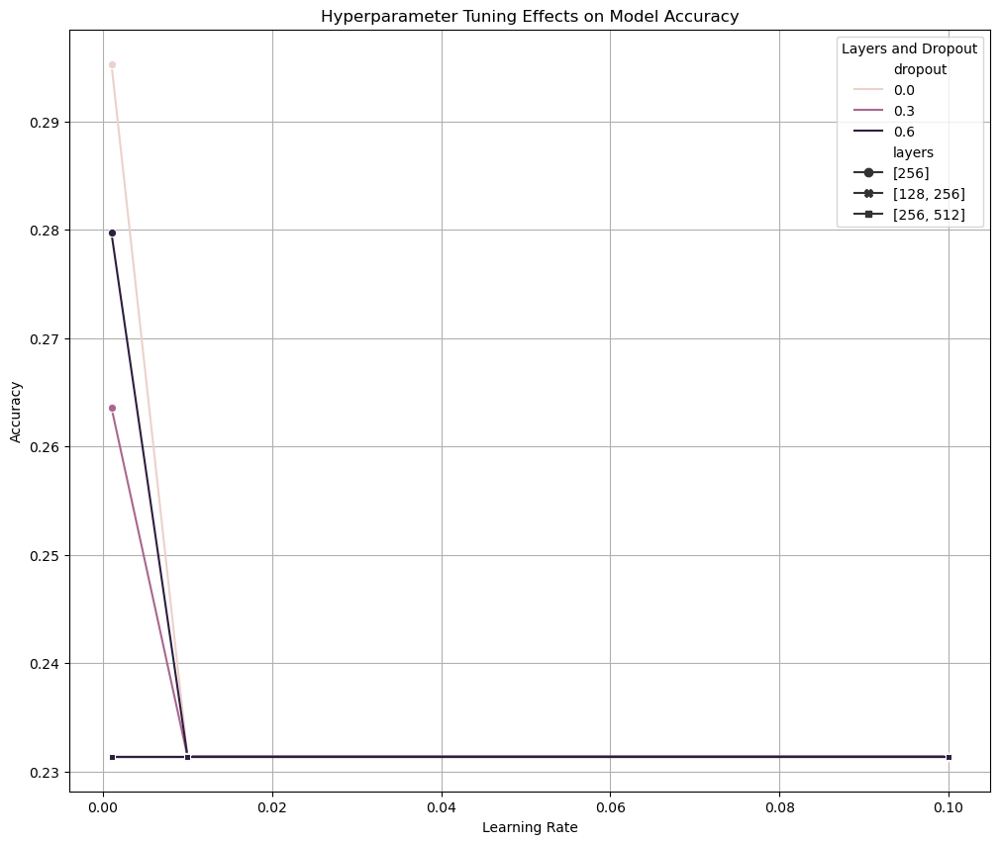

In [46]:
from time import time

input_dim = X_train_full_pc.shape[-1]
output_dim = len(np.unique(y_train_full))
param_grid = [
    {'learning_rate': [0.1, 0.01, 0.001], 
     'layers': [[256], [128, 256], [256, 512]],
     'dropout': [0, 0.3, 0.6]}
]
results = []
for params in param_grid:
    for lr in params['learning_rate']:
        for layers in params['layers']:
            for dropout in params['dropout']:
                print(f"Training with lr={lr}, layers={layers}, dropout={dropout}")
                _, loss_list, acc_list, test_acc_list, time_list = eval_mlp(
                    input_dim, output_dim, layers, dropout, nn.ReLU(), 50, lr, 0.95, 512)
                results.append({
                    'learning_rate': lr,
                    'layers': str(layers),  # convert list to str type
                    'dropout': dropout,
                    'accuracy': test_acc_list[-1],
                    'time': sum(time_list)
                })
                

# save results as dataframe
results_df = pd.DataFrame(results)

# plot hyperparameter tuning effects the model
plt.figure(figsize=(12, 10))
sns.lineplot(data=results_df, x='learning_rate', y='accuracy', hue='dropout', style='layers', markers=True, dashes=False)
plt.title('Hyperparameter Tuning Effects on Model Accuracy')
plt.xlabel('Learning Rate')
plt.ylabel('Accuracy')
#add legend
plt.legend(title='Layers and Dropout', loc='upper right', bbox_to_anchor=(1, 1))
plt.grid(True)
plt.show()


### Convolutional neural network

Evaluating: LR=0.1, Batch=256, Decay=0.9
Epoch: 0, loss: 235.57073, train_acc: 40.76%, test_acc:23.14%, time_cost:0.553
Epoch: 1, loss: 119.45858, train_acc: 36.45%, test_acc:23.14%, time_cost:0.398
Epoch: 2, loss: 120.43864, train_acc: 34.60%, test_acc:24.09%, time_cost:0.391
Epoch: 3, loss: 136.81873, train_acc: 24.63%, test_acc:23.14%, time_cost:0.389
Epoch: 4, loss: 141.93982, train_acc: 21.96%, test_acc:23.14%, time_cost:0.389
Epoch: 5, loss: 141.99185, train_acc: 21.96%, test_acc:23.14%, time_cost:0.390
Epoch: 6, loss: 142.10871, train_acc: 21.96%, test_acc:23.14%, time_cost:0.388
Epoch: 7, loss: 142.10046, train_acc: 21.96%, test_acc:23.14%, time_cost:0.388
Epoch: 8, loss: 142.16414, train_acc: 21.96%, test_acc:23.14%, time_cost:0.388
Epoch: 9, loss: 142.09852, train_acc: 21.96%, test_acc:23.14%, time_cost:0.389
Epoch: 10, loss: 142.04747, train_acc: 21.96%, test_acc:23.14%, time_cost:0.393
Epoch: 11, loss: 142.15885, train_acc: 21.96%, test_acc:23.14%, time_cost:0.446
Epoch: 12

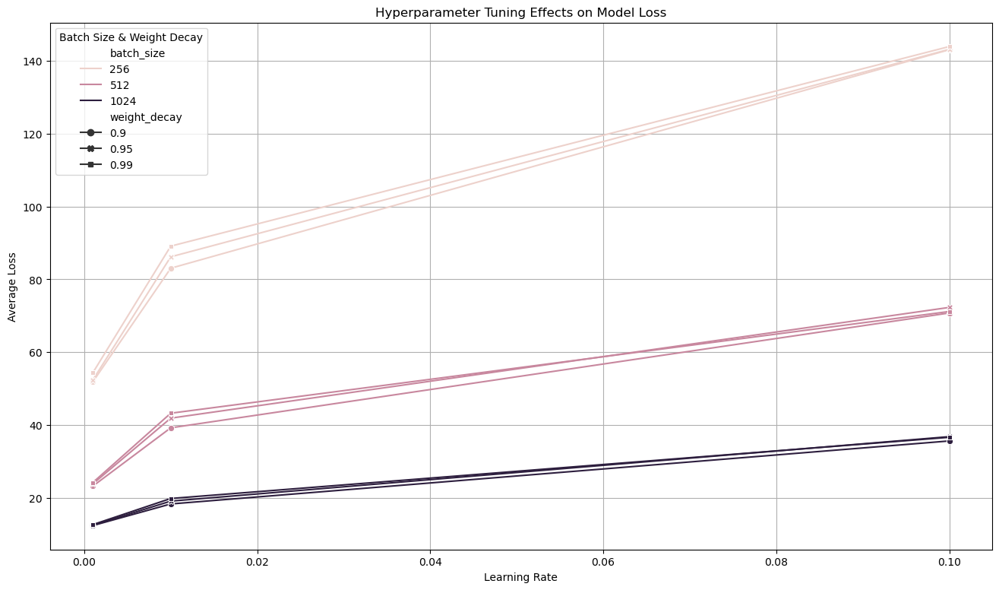

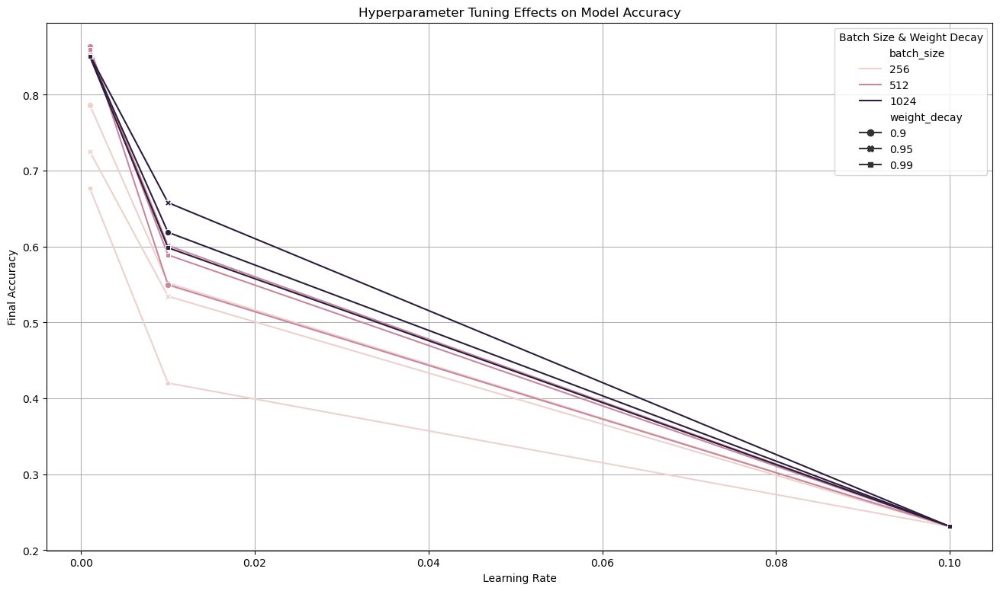

In [49]:
in_channel=1
n_class = len(np.unique(y_train_full))
epochs = 50
# define param_grid
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'batch_size': [256, 512, 1024],
    'weight_decay': [0.9, 0.95, 0.99]
}

# initialize empty results to save future results
results = []

# loop for parameter tuning
for lr in param_grid['learning_rate']:
    for batch in param_grid['batch_size']:
        for decay in param_grid['weight_decay']:
            print(f"Evaluating: LR={lr}, Batch={batch}, Decay={decay}")
            model, loss_list, acc_list, test_acc_list, time_list = eval_cnn(in_channel, n_class, True, epochs, lr, decay, batch)
            results.append({
                'learning_rate': lr,
                'batch_size': batch,
                'weight_decay': decay,
                'final_accuracy': test_acc_list[-1],
                'average_loss': np.mean(loss_list),
                'total_time': sum(time_list),
                'loss_list': loss_list,
                'acc_list': acc_list,
                'time_list': time_list
            })

# save results as dataframe
results_df = pd.DataFrame(results)

# plot hyperparameter tuning effects on model
plt.figure(figsize=(16, 9))
sns.lineplot(data=results_df, x='learning_rate', y='average_loss', hue='batch_size', style='weight_decay', markers=True, dashes=False)
plt.title('Hyperparameter Tuning Effects on Model Loss')
plt.xlabel('Learning Rate')
plt.ylabel('Average Loss')
plt.legend(title='Batch Size & Weight Decay')
plt.grid(True)

plt.figure(figsize=(16, 9))
sns.lineplot(data=results_df, x='learning_rate', y='final_accuracy', hue='batch_size', style='weight_decay', markers=True, dashes=False)
plt.title('Hyperparameter Tuning Effects on Model Accuracy')
plt.xlabel('Learning Rate')
plt.ylabel('Final Accuracy')
plt.legend(title='Batch Size & Weight Decay')
plt.grid(True)

plt.show()


## 4. Final models
In this section, please ensure to include cells to train each model with its best hyperparmater combination independently of the hyperparameter tuning cells, i.e. don't rely on the hyperparameter tuning cells having been run.

### Algorithm of choice from first six weeks of course

In [50]:
best_model = train_svm(X_train_full_pc, X_test_pc, y_train_full, y_test, param_grid=param_grid)

Best parameters:
{'C': 1, 'kernel': 'rbf'}
Accuracy with kernel=rbf, C=1: 0.893491124260355


### Fully connected neural network

In [51]:
best_mlp, loss_list, acc_list, test_acc_list, time_list = test_mlp(input_dim, output_dim, layer=[256, 512], dropout = None, activ = nn.ReLU(), 
                                                                   epochs = 50, learning_rate = 0.001, weight_decay = 0.99, batch_size = 512)
print(f"Accuracy of best MLP: {test_acc_list[-1] * 100:.2f}%")

Epoch: 0, loss: 88.97085, train_acc: 8.07%, test_acc:7.88%, time_cost:0.197
Epoch: 1, loss: 88.83421, train_acc: 8.49%, test_acc:8.41%, time_cost:0.195
Epoch: 2, loss: 88.72079, train_acc: 9.07%, test_acc:8.98%, time_cost:0.188
Epoch: 3, loss: 88.62764, train_acc: 9.92%, test_acc:10.10%, time_cost:0.192
Epoch: 4, loss: 88.54993, train_acc: 12.12%, test_acc:12.74%, time_cost:0.283
Epoch: 5, loss: 88.48546, train_acc: 15.98%, test_acc:18.15%, time_cost:0.195
Epoch: 6, loss: 88.43209, train_acc: 19.91%, test_acc:21.22%, time_cost:0.256
Epoch: 7, loss: 88.38738, train_acc: 21.54%, test_acc:22.34%, time_cost:0.200
Epoch: 8, loss: 88.35023, train_acc: 22.11%, test_acc:22.21%, time_cost:0.209
Epoch: 9, loss: 88.31918, train_acc: 22.18%, test_acc:22.19%, time_cost:0.201
Epoch: 10, loss: 88.29357, train_acc: 22.19%, test_acc:22.19%, time_cost:0.202
Epoch: 11, loss: 88.27184, train_acc: 22.19%, test_acc:22.19%, time_cost:0.210
Epoch: 12, loss: 88.25282, train_acc: 22.19%, test_acc:22.19%, time_c

In [52]:
best_accuracy = 0
best_params = {}
# Parameter grid
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'batch_size': [256, 512, 1024],
    'layers': [[256], [128, 256], [256, 512]],  # Assuming you want to vary layers as well

}
# Loop through each combination of parameters
for lr in param_grid['learning_rate']:
    for batch in param_grid['batch_size']:
        for layer in param_grid['layers']:
            _, _, _, test_acc_list, _ = test_mlp(input_dim, output_dim, layer, dropout, nn.ReLU(), 50, lr, decay, batch)
            if test_acc_list[-1] > best_accuracy:
                best_accuracy = test_acc_list[-1]
                best_params = {
                    'learning_rate': lr,
                    'batch_size': batch,
                    'weight_decay': decay,
                    'layers': layer,
                    'dropout': dropout
                }
print("Best Model's Hyperparameters:")
print(best_params)

Epoch: 0, loss: 175.25593, train_acc: 22.74%, test_acc:22.19%, time_cost:0.364
Epoch: 1, loss: 175.93345, train_acc: 22.19%, test_acc:22.19%, time_cost:0.405
Epoch: 2, loss: 175.93534, train_acc: 22.19%, test_acc:22.19%, time_cost:0.299
Epoch: 3, loss: 175.94917, train_acc: 22.19%, test_acc:22.19%, time_cost:0.353
Epoch: 4, loss: 175.92810, train_acc: 22.19%, test_acc:22.19%, time_cost:0.307
Epoch: 5, loss: 175.94467, train_acc: 22.19%, test_acc:22.19%, time_cost:0.279
Epoch: 6, loss: 175.93096, train_acc: 22.19%, test_acc:22.19%, time_cost:0.261
Epoch: 7, loss: 175.92274, train_acc: 22.19%, test_acc:22.19%, time_cost:0.249
Epoch: 8, loss: 175.94614, train_acc: 22.19%, test_acc:22.19%, time_cost:0.239
Epoch: 9, loss: 175.94303, train_acc: 22.19%, test_acc:22.19%, time_cost:0.324
Epoch: 10, loss: 175.92325, train_acc: 22.19%, test_acc:22.19%, time_cost:0.310
Epoch: 11, loss: 175.93875, train_acc: 22.19%, test_acc:22.19%, time_cost:0.253
Epoch: 12, loss: 175.93871, train_acc: 22.19%, tes

### Convolutional neural network

In [ ]:
def test_cnn1(in_channel, n_class, epochs, learning_rate, weight_decay, batch_size):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = cnn(in_channel, n_class).to(device)
    optimizer = build_optimizer(model, learning_rate, weight_decay)

    train_loader, test_loader = load_data_cnn(batch_size, train=False)
    
    model, loss_list, acc_list, test_acc_list, time_list = train_model(train_loader, test_loader, model, epochs, optimizer, device)

    hyperparams = {
        'learning_rate': learning_rate,
        'batch_size': batch_size,
        'weight_decay': weight_decay
    }

    return model, loss_list, acc_list, test_acc_list, time_list, hyperparams

# Define possible values for hyperparameters
param_grid = {
    'learning_rate': [0.001, 0.01, 0.1],
    'batch_size': [256, 512, 1024],
    'weight_decay': [0.9, 0.95, 0.99]
}

best_accuracy = 0
best_model_info = {}

for lr in param_grid['learning_rate']:
    for batch in param_grid['batch_size']:
        for decay in param_grid['weight_decay']:
            _, _, _, test_acc_list, _, hyperparams = test_cnn1(in_channel, n_class, 50, lr, decay, batch)
            if test_acc_list[-1] > best_accuracy:
                best_accuracy = test_acc_list[-1]
                best_model_info = hyperparams
                best_model_info['accuracy'] = best_accuracy

print(f"Accuracy of best CNN: {best_model_info['accuracy'] * 100:.2f}%")
print("Best Model's Hyperparameters:")
print(best_model_info)


Epoch: 0, loss: 177.10188, train_acc: 16.48%, test_acc:22.19%, time_cost:0.812
Epoch: 1, loss: 176.63795, train_acc: 22.19%, test_acc:22.19%, time_cost:0.463
Epoch: 2, loss: 176.32904, train_acc: 22.19%, test_acc:22.19%, time_cost:0.414
Epoch: 3, loss: 176.11202, train_acc: 22.19%, test_acc:22.19%, time_cost:0.410
Epoch: 4, loss: 175.94639, train_acc: 22.19%, test_acc:22.19%, time_cost:0.415
Epoch: 5, loss: 175.81971, train_acc: 22.19%, test_acc:22.19%, time_cost:0.411
Epoch: 6, loss: 175.72105, train_acc: 22.19%, test_acc:22.19%, time_cost:0.411
Epoch: 7, loss: 175.63404, train_acc: 22.19%, test_acc:22.19%, time_cost:0.412
Epoch: 8, loss: 175.56045, train_acc: 22.19%, test_acc:22.19%, time_cost:0.415
Epoch: 9, loss: 175.49416, train_acc: 22.19%, test_acc:22.19%, time_cost:0.414
Epoch: 10, loss: 175.43871, train_acc: 22.19%, test_acc:22.19%, time_cost:0.411
Epoch: 11, loss: 175.38604, train_acc: 22.19%, test_acc:22.19%, time_cost:0.415
Epoch: 12, loss: 175.34062, train_acc: 22.19%, tes

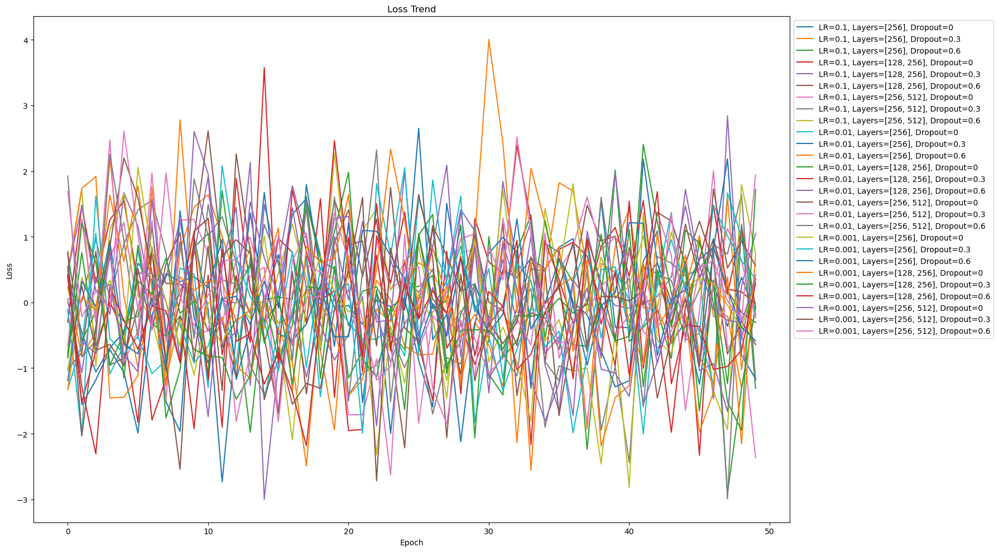

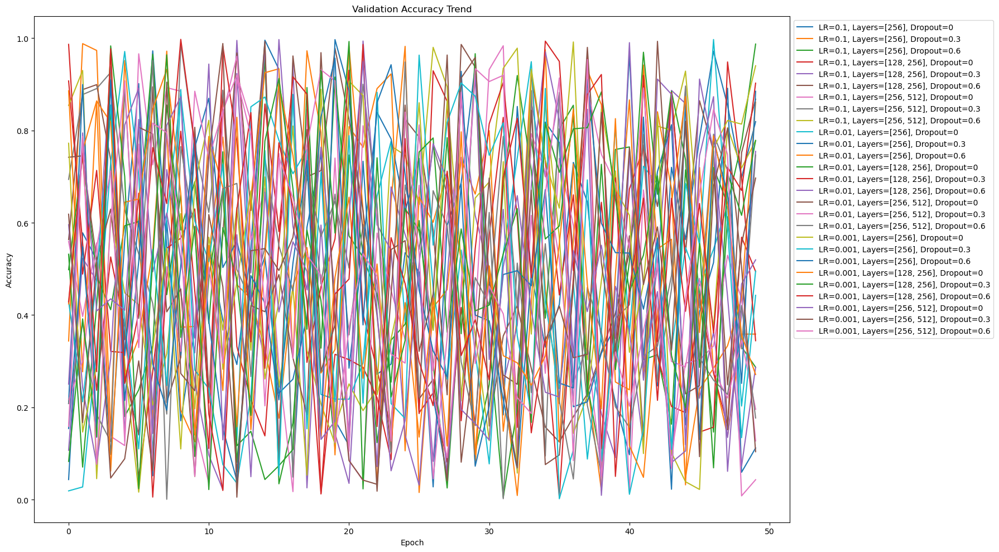

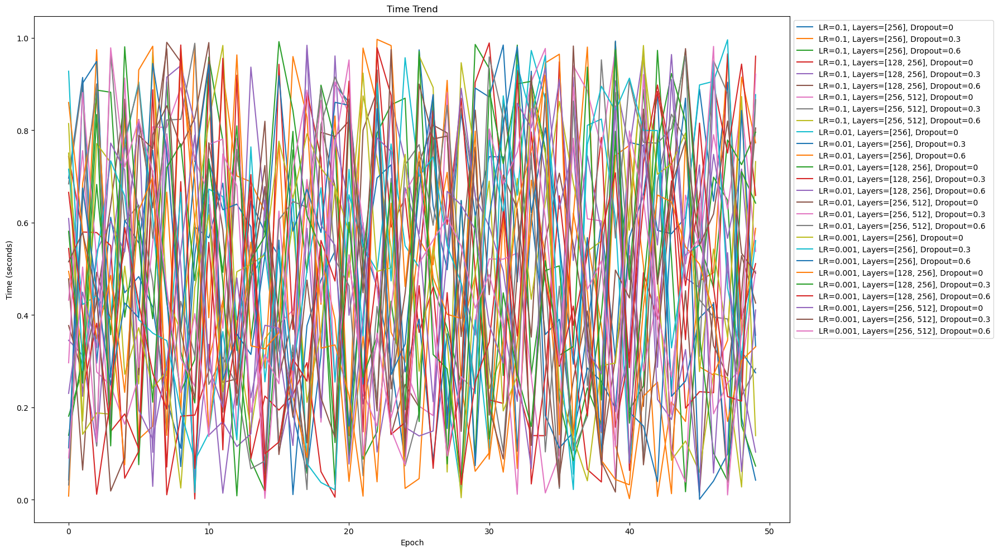

In [ ]:
'''import matplotlib.pyplot as plt

# plot loss trend
plt.figure(figsize=(18, 10))
for result in results:
    label = f"LR={result['learning_rate']}, Layers={result['layers']}, Dropout={result['dropout']}"
    plt.plot(result['loss_list'], label=label)
plt.title('Loss Trend')
plt.xlabel('Epoch')
plt.ylabel('Loss')
# add legend
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

# plot accuracy trend
plt.figure(figsize=(18, 10))
for result in results:
    label = f"LR={result['learning_rate']}, Layers={result['layers']}, Dropout={result['dropout']}"
    plt.plot(result['acc_list'], label=label)
plt.title('Validation Accuracy Trend')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
# add legend
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()

# plot time trend
plt.figure(figsize=(18, 10))
for result in results:
    label = f"LR={result['learning_rate']}, Layers={result['layers']}, Dropout={result['dropout']}"
    plt.plot(result['time_list'], label=label)
plt.title('Time Trend')
plt.xlabel('Epoch')
plt.ylabel('Time (seconds)')
# add legend
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()
plt.show()'''


Evaluating: LR=0.1, Batch=256, Decay=0.9
Epoch: 0, loss: 249.82560, train_acc: 36.42%, test_acc:21.61%, time_cost:0.791
Epoch: 1, loss: 129.24276, train_acc: 29.88%, test_acc:21.61%, time_cost:0.450
Epoch: 2, loss: 131.64465, train_acc: 27.98%, test_acc:21.61%, time_cost:0.444
Epoch: 3, loss: 141.64891, train_acc: 22.34%, test_acc:21.61%, time_cost:0.466
Epoch: 4, loss: 141.72719, train_acc: 22.34%, test_acc:21.61%, time_cost:0.439
Epoch: 5, loss: 141.75887, train_acc: 22.34%, test_acc:21.61%, time_cost:0.455
Epoch: 6, loss: 141.77150, train_acc: 22.34%, test_acc:21.61%, time_cost:0.453
Epoch: 7, loss: 141.75425, train_acc: 22.34%, test_acc:21.61%, time_cost:0.437
Epoch: 8, loss: 141.74187, train_acc: 22.34%, test_acc:21.61%, time_cost:0.441
Epoch: 9, loss: 141.83171, train_acc: 22.34%, test_acc:21.61%, time_cost:0.435
Epoch: 10, loss: 141.86534, train_acc: 22.34%, test_acc:21.61%, time_cost:0.454
Epoch: 11, loss: 141.87459, train_acc: 22.34%, test_acc:21.61%, time_cost:0.430
Epoch: 12

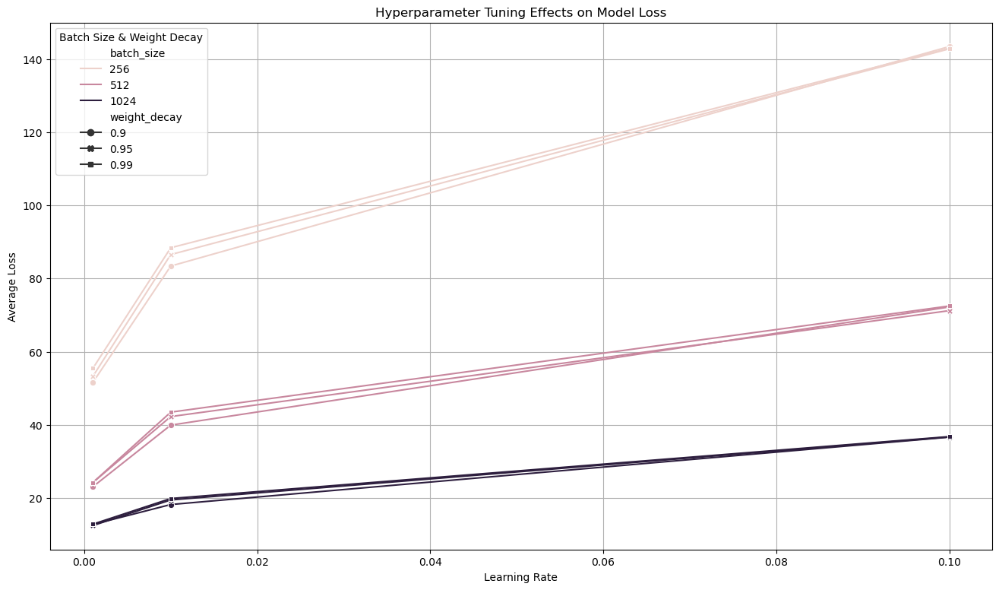

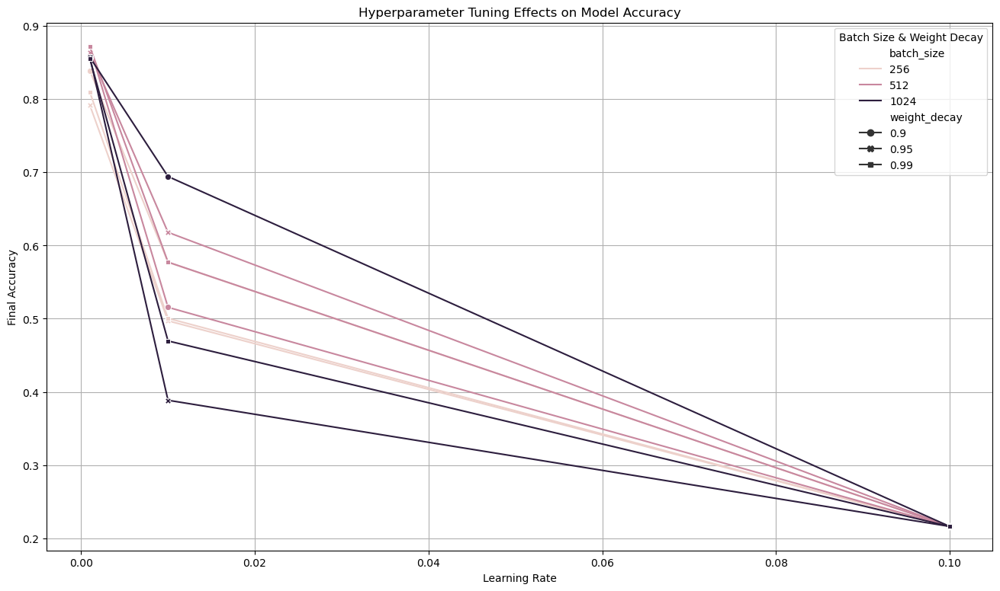

In [ ]:
# param_grid
param_grid = {
    'learning_rate': [0.1, 0.01, 0.001],
    'batch_size': [256, 512, 1024],
    'weight_decay': [0.9, 0.95, 0.99]
}


results = []

# param_grid search
for lr in param_grid['learning_rate']:
    for batch in param_grid['batch_size']:
        for decay in param_grid['weight_decay']:
            print(f"Evaluating: LR={lr}, Batch={batch}, Decay={decay}")
            model, loss_list, acc_list, test_acc_list, time_list = eval_cnn(in_channel, n_class, True, epochs, lr, decay, batch)
            results.append({
                'learning_rate': lr,
                'batch_size': batch,
                'weight_decay': decay,
                'final_accuracy': test_acc_list[-1],
                'average_loss': np.mean(loss_list),
                'total_time': sum(time_list),
                'loss_list': loss_list,
                'acc_list': acc_list,
                'time_list': time_list
            })

# save results as dataframe
results_df = pd.DataFrame(results)

# plot hyperparameters' effect
plt.figure(figsize=(16, 9))
sns.lineplot(data=results_df, x='learning_rate', y='average_loss', hue='batch_size', style='weight_decay', markers=True, dashes=False)
plt.title('Hyperparameter Tuning Effects on Model Loss')
plt.xlabel('Learning Rate')
plt.ylabel('Average Loss')
plt.legend(title='Batch Size & Weight Decay')
plt.grid(True)

plt.figure(figsize=(16, 9))
sns.lineplot(data=results_df, x='learning_rate', y='final_accuracy', hue='batch_size', style='weight_decay', markers=True, dashes=False)
plt.title('Hyperparameter Tuning Effects on Model Accuracy')
plt.xlabel('Learning Rate')
plt.ylabel('Final Accuracy')
plt.legend(title='Batch Size & Weight Decay')
plt.grid(True)

plt.show()


In [ ]:
best_cnn, loss_list, acc_list, test_acc_list, time_list = test_cnn(in_channel, n_class, bn = True, epochs = 50, learning_rate = 0.001, 
                                                                   weight_decay = 0.95, batch_size = 512)
print(f"Accuracy of best CNN: {test_acc_list[-1] * 100:.2f}%")


Epoch: 0, loss: 56.12729, train_acc: 40.40%, test_acc:34.81%, time_cost:0.468
Epoch: 1, loss: 41.48338, train_acc: 62.67%, test_acc:67.80%, time_cost:0.452
Epoch: 2, loss: 35.10185, train_acc: 70.78%, test_acc:74.06%, time_cost:0.454
Epoch: 3, loss: 31.31475, train_acc: 75.45%, test_acc:76.28%, time_cost:0.455
Epoch: 4, loss: 28.81798, train_acc: 77.80%, test_acc:78.37%, time_cost:0.454
Epoch: 5, loss: 27.07005, train_acc: 79.47%, test_acc:80.22%, time_cost:0.454
Epoch: 6, loss: 25.73916, train_acc: 80.66%, test_acc:81.09%, time_cost:0.454
Epoch: 7, loss: 24.73097, train_acc: 81.44%, test_acc:82.07%, time_cost:0.454
Epoch: 8, loss: 23.94249, train_acc: 82.27%, test_acc:82.38%, time_cost:0.460
Epoch: 9, loss: 23.31388, train_acc: 82.66%, test_acc:83.07%, time_cost:0.452
Epoch: 10, loss: 22.84225, train_acc: 83.28%, test_acc:83.65%, time_cost:0.452
Epoch: 11, loss: 22.45678, train_acc: 83.59%, test_acc:83.81%, time_cost:0.452
Epoch: 12, loss: 22.17440, train_acc: 83.75%, test_acc:84.05%,

# Reference

[1]torch.unsqueeze — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.unsqueeze.html


[2]torch.from_numpy — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.from_numpy.html


[3]matplotlib.pyplot.axhline — Matplotlib 3.8.4 documentation. (n.d.). https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.axhline.html


[4]sklearn.model_selection.StratifiedKFold. (n.d.). Scikit-learn. https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.StratifiedKFold.html


[5]sklearn.model_selection.GridSearchCV. (n.d.). Scikit-learn. https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html


[6]Sklearn.svm.SVC. (n.d.). Scikit-learn. https://scikit-learn.org/stable/modules/generated/sklearn.svm.SVC.html


[7]torch.utils.data — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/data.html


[8]Sequential — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.nn.Sequential.html#sequential


[9]AmirSh. (n.d.). Compact_SER/models/mlp.py at main · AmirSh15/Compact_SER. GitHub. https://github.com/AmirSh15/Compact_SER/blob/main/models/mlp.py


[10]SGD — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.optim.SGD.html


[11]LeakyReLU — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.nn.LeakyReLU.html


[12]Conv2d — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html


[13]MaxPool2d — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.nn.MaxPool2d.html


[14]Flatten — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.nn.Flatten.html


[15]BatchNorm2d — PyTorch 2.3 documentation. (n.d.). https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm2d.html


# Appendix

Training with lr=0.1, layers=[256], dropout=0
Epoch: 0, loss: 70.90226, train_acc: 26.23%, test_acc:21.61%, time_cost:0.200
Epoch: 1, loss: 71.25031, train_acc: 22.34%, test_acc:21.61%, time_cost:0.188
Epoch: 2, loss: 71.29344, train_acc: 22.34%, test_acc:21.61%, time_cost:0.155
Epoch: 3, loss: 71.29720, train_acc: 22.34%, test_acc:21.61%, time_cost:0.156
Epoch: 4, loss: 71.29144, train_acc: 22.34%, test_acc:21.61%, time_cost:0.148
Epoch: 5, loss: 71.29605, train_acc: 22.34%, test_acc:21.61%, time_cost:0.157
Epoch: 6, loss: 71.29280, train_acc: 22.34%, test_acc:21.61%, time_cost:0.117
Epoch: 7, loss: 71.29588, train_acc: 22.34%, test_acc:21.61%, time_cost:0.119
Epoch: 8, loss: 71.29269, train_acc: 22.34%, test_acc:21.61%, time_cost:0.120
Epoch: 9, loss: 71.29493, train_acc: 22.34%, test_acc:21.61%, time_cost:0.129
Epoch: 10, loss: 71.29353, train_acc: 22.34%, test_acc:21.61%, time_cost:0.113
Epoch: 11, loss: 71.29546, train_acc: 22.34%, test_acc:21.61%, time_cost:0.123
Epoch: 12, loss:

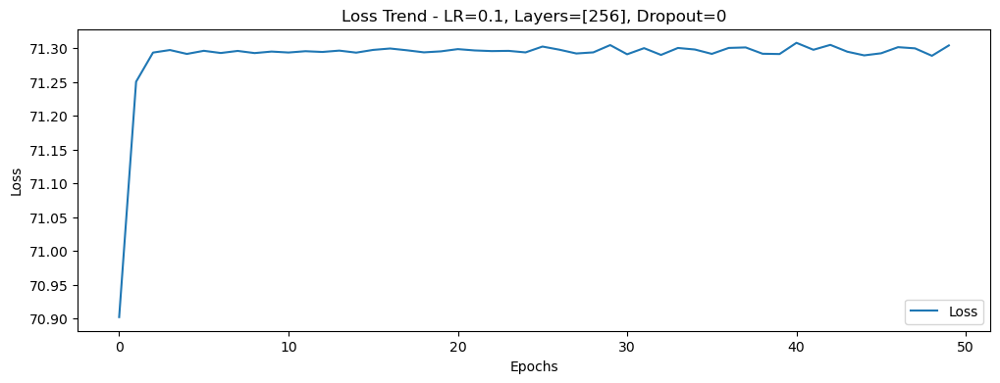

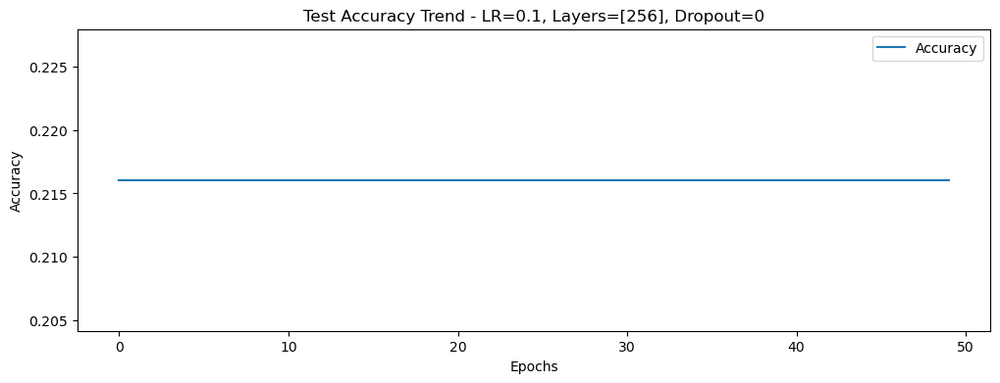

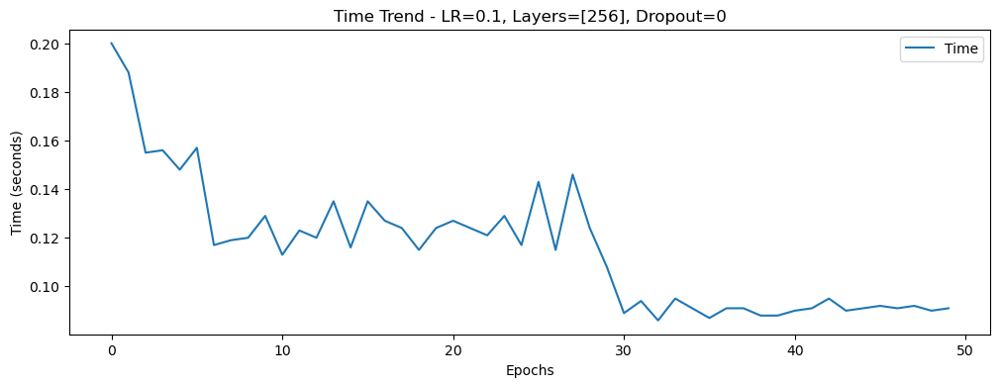

Training with lr=0.1, layers=[256], dropout=0.3
Epoch: 0, loss: 70.86183, train_acc: 25.04%, test_acc:21.61%, time_cost:0.097
Epoch: 1, loss: 71.25326, train_acc: 22.34%, test_acc:21.61%, time_cost:0.096
Epoch: 2, loss: 71.29527, train_acc: 22.34%, test_acc:21.61%, time_cost:0.091
Epoch: 3, loss: 71.29776, train_acc: 22.34%, test_acc:21.61%, time_cost:0.094
Epoch: 4, loss: 71.29186, train_acc: 22.34%, test_acc:21.61%, time_cost:0.096
Epoch: 5, loss: 71.29636, train_acc: 22.34%, test_acc:21.61%, time_cost:0.095
Epoch: 6, loss: 71.30088, train_acc: 22.34%, test_acc:21.61%, time_cost:0.130
Epoch: 7, loss: 71.29764, train_acc: 22.34%, test_acc:21.61%, time_cost:0.087
Epoch: 8, loss: 71.29516, train_acc: 22.34%, test_acc:21.61%, time_cost:0.090
Epoch: 9, loss: 71.29076, train_acc: 22.34%, test_acc:21.61%, time_cost:0.090
Epoch: 10, loss: 71.29713, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 11, loss: 71.30340, train_acc: 22.34%, test_acc:21.61%, time_cost:0.097
Epoch: 12, los

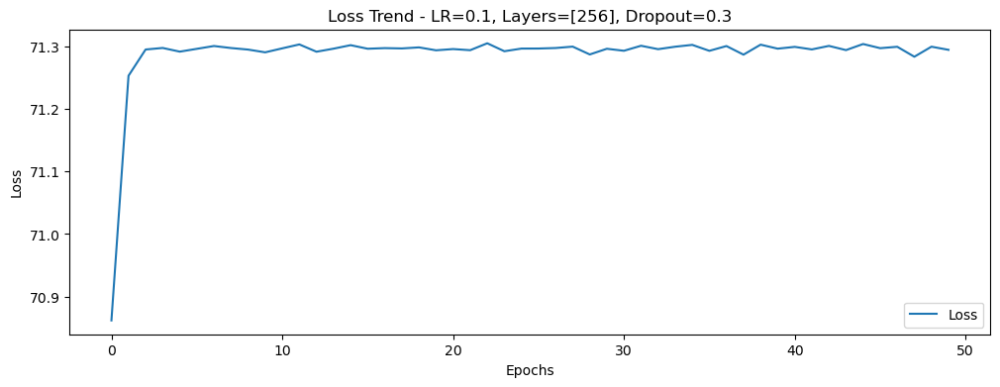

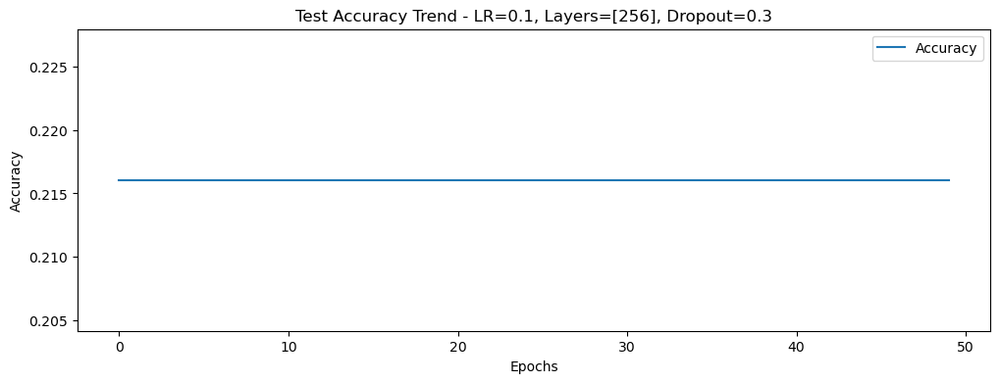

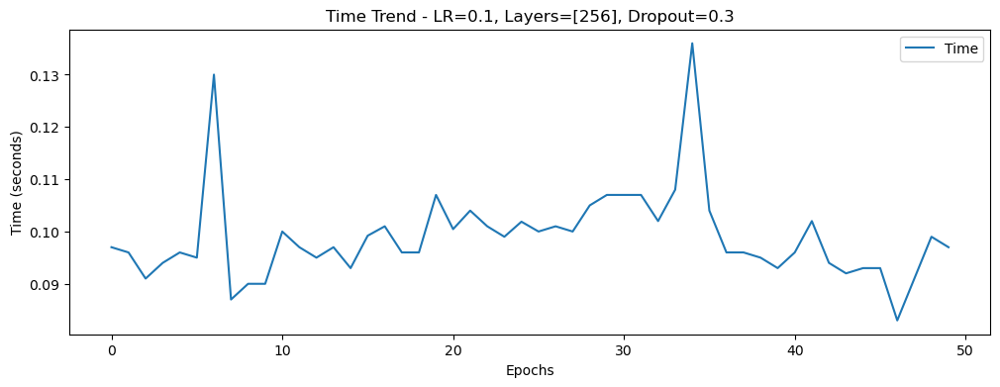

Training with lr=0.1, layers=[256], dropout=0.6
Epoch: 0, loss: 70.95567, train_acc: 23.65%, test_acc:21.61%, time_cost:0.097
Epoch: 1, loss: 71.25544, train_acc: 22.34%, test_acc:21.61%, time_cost:0.093
Epoch: 2, loss: 71.29067, train_acc: 22.34%, test_acc:21.61%, time_cost:0.103
Epoch: 3, loss: 71.29384, train_acc: 22.34%, test_acc:21.61%, time_cost:0.097
Epoch: 4, loss: 71.30258, train_acc: 22.34%, test_acc:21.61%, time_cost:0.091
Epoch: 5, loss: 71.30022, train_acc: 22.34%, test_acc:21.61%, time_cost:0.084
Epoch: 6, loss: 71.28778, train_acc: 22.34%, test_acc:21.61%, time_cost:0.095
Epoch: 7, loss: 71.29241, train_acc: 22.34%, test_acc:21.61%, time_cost:0.094
Epoch: 8, loss: 71.29842, train_acc: 22.34%, test_acc:21.61%, time_cost:0.090
Epoch: 9, loss: 71.30356, train_acc: 22.34%, test_acc:21.61%, time_cost:0.092
Epoch: 10, loss: 71.29385, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 11, loss: 71.29684, train_acc: 22.34%, test_acc:21.61%, time_cost:0.096
Epoch: 12, los

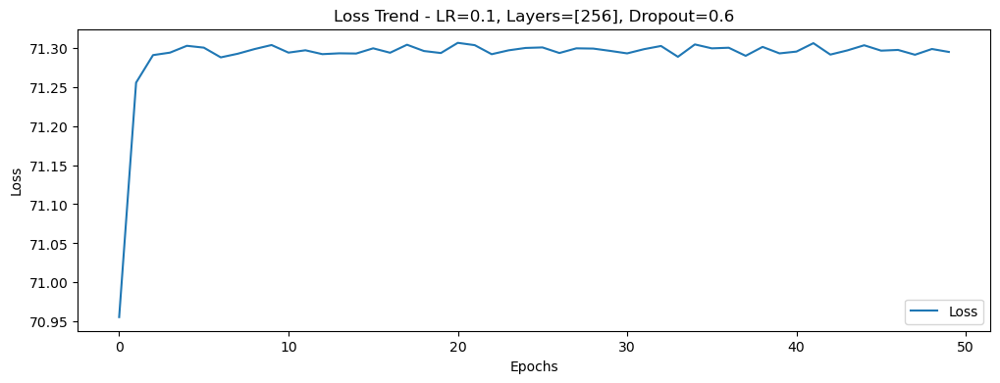

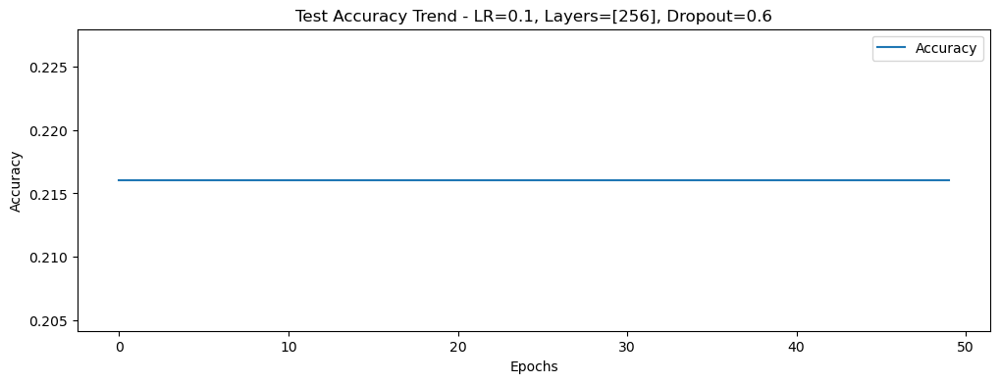

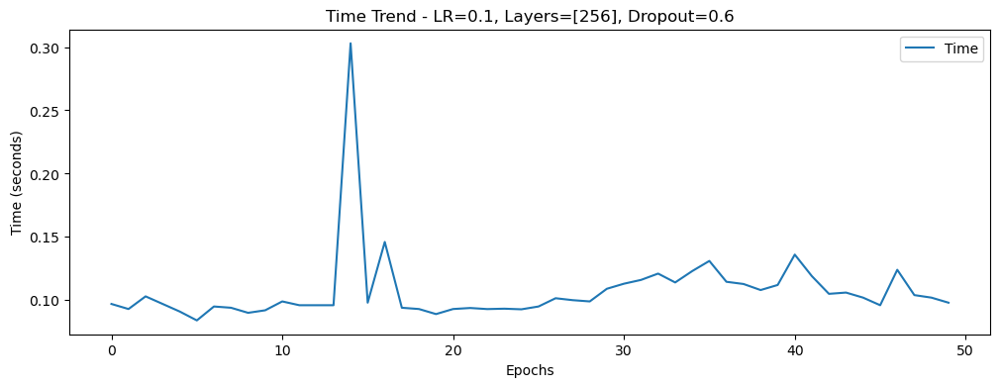

Training with lr=0.1, layers=[128, 256], dropout=0
Epoch: 0, loss: 71.44708, train_acc: 21.00%, test_acc:21.61%, time_cost:0.146
Epoch: 1, loss: 71.29606, train_acc: 22.34%, test_acc:21.61%, time_cost:0.101
Epoch: 2, loss: 71.30626, train_acc: 22.34%, test_acc:21.61%, time_cost:0.105
Epoch: 3, loss: 71.29623, train_acc: 22.34%, test_acc:21.61%, time_cost:0.109
Epoch: 4, loss: 71.29229, train_acc: 22.34%, test_acc:21.61%, time_cost:0.112
Epoch: 5, loss: 71.29334, train_acc: 22.34%, test_acc:21.61%, time_cost:0.111
Epoch: 6, loss: 71.30284, train_acc: 22.34%, test_acc:21.61%, time_cost:0.118
Epoch: 7, loss: 71.29824, train_acc: 22.34%, test_acc:21.61%, time_cost:0.120
Epoch: 8, loss: 71.28816, train_acc: 22.34%, test_acc:21.61%, time_cost:0.314
Epoch: 9, loss: 71.29341, train_acc: 22.34%, test_acc:21.61%, time_cost:0.131
Epoch: 10, loss: 71.30940, train_acc: 22.34%, test_acc:21.61%, time_cost:0.112
Epoch: 11, loss: 71.29567, train_acc: 22.34%, test_acc:21.61%, time_cost:0.114
Epoch: 12, 

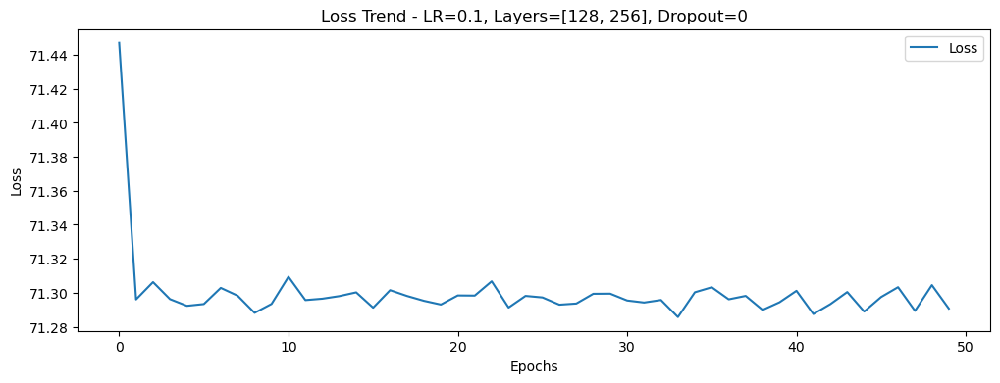

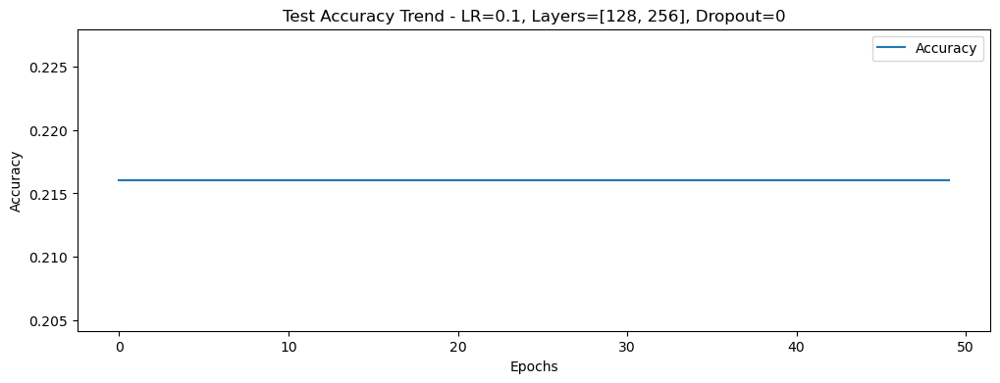

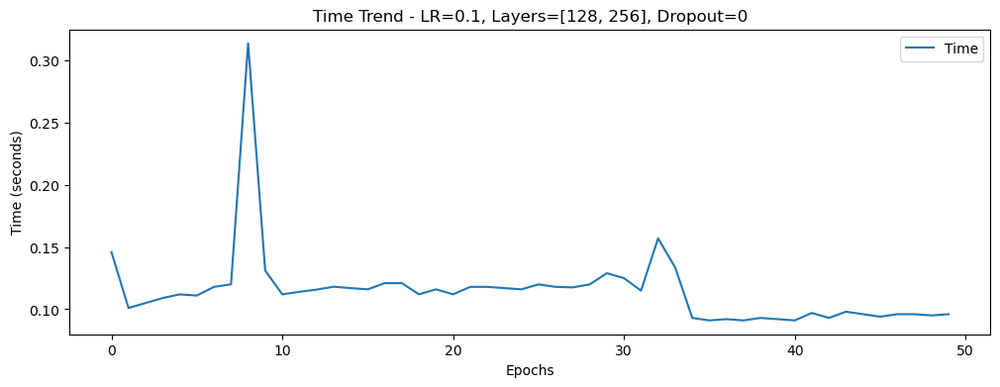

Training with lr=0.1, layers=[128, 256], dropout=0.3
Epoch: 0, loss: 71.46213, train_acc: 20.98%, test_acc:21.61%, time_cost:0.095
Epoch: 1, loss: 71.30487, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 2, loss: 71.30253, train_acc: 22.34%, test_acc:21.61%, time_cost:0.098
Epoch: 3, loss: 71.29622, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 4, loss: 71.30623, train_acc: 22.34%, test_acc:21.61%, time_cost:0.098
Epoch: 5, loss: 71.28417, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 6, loss: 71.30462, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 7, loss: 71.30367, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 8, loss: 71.29975, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 9, loss: 71.30107, train_acc: 22.34%, test_acc:21.61%, time_cost:0.101
Epoch: 10, loss: 71.29539, train_acc: 22.34%, test_acc:21.61%, time_cost:0.106
Epoch: 11, loss: 71.28692, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 12

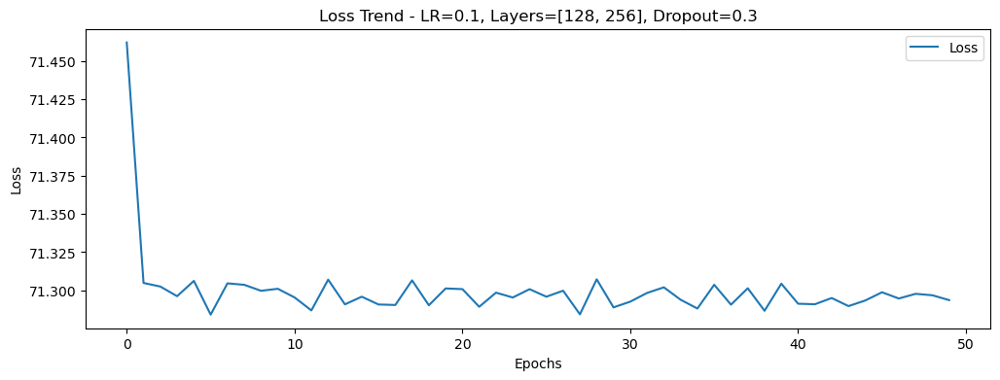

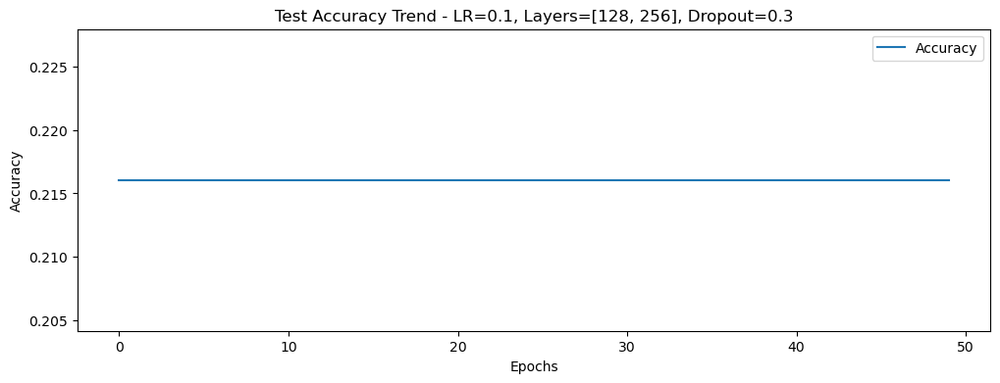

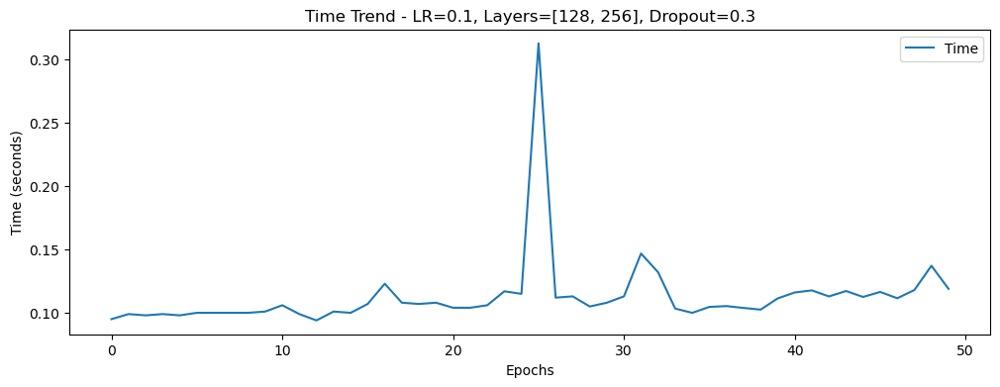

Training with lr=0.1, layers=[128, 256], dropout=0.6
Epoch: 0, loss: 71.50999, train_acc: 19.59%, test_acc:21.61%, time_cost:0.118
Epoch: 1, loss: 71.30770, train_acc: 22.34%, test_acc:21.61%, time_cost:0.115
Epoch: 2, loss: 71.29684, train_acc: 22.34%, test_acc:21.61%, time_cost:0.102
Epoch: 3, loss: 71.29275, train_acc: 22.34%, test_acc:21.61%, time_cost:0.106
Epoch: 4, loss: 71.29825, train_acc: 22.34%, test_acc:21.61%, time_cost:0.113
Epoch: 5, loss: 71.29858, train_acc: 22.34%, test_acc:21.61%, time_cost:0.112
Epoch: 6, loss: 71.29212, train_acc: 22.34%, test_acc:21.61%, time_cost:0.116
Epoch: 7, loss: 71.29285, train_acc: 22.34%, test_acc:21.61%, time_cost:0.101
Epoch: 8, loss: 71.29949, train_acc: 22.34%, test_acc:21.61%, time_cost:0.111
Epoch: 9, loss: 71.30091, train_acc: 22.34%, test_acc:21.61%, time_cost:0.109
Epoch: 10, loss: 71.29849, train_acc: 22.34%, test_acc:21.61%, time_cost:0.110
Epoch: 11, loss: 71.29247, train_acc: 22.34%, test_acc:21.61%, time_cost:0.115
Epoch: 12

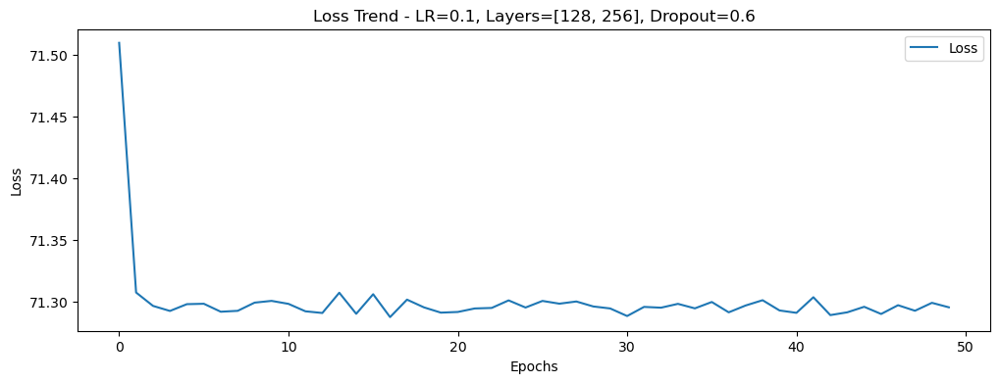

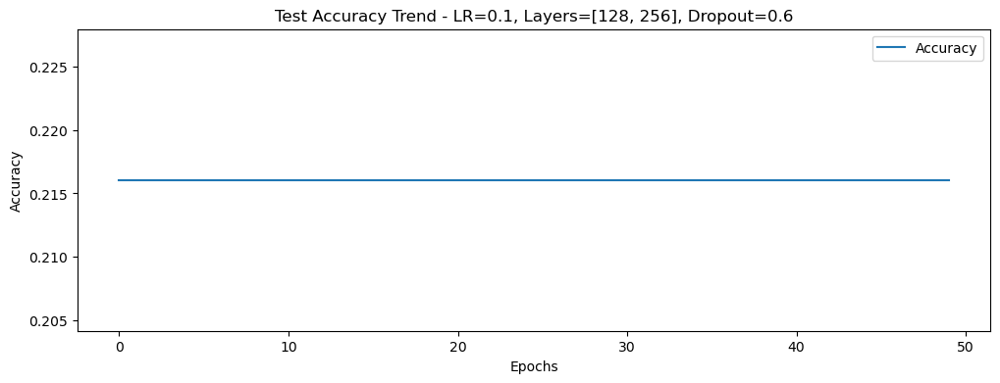

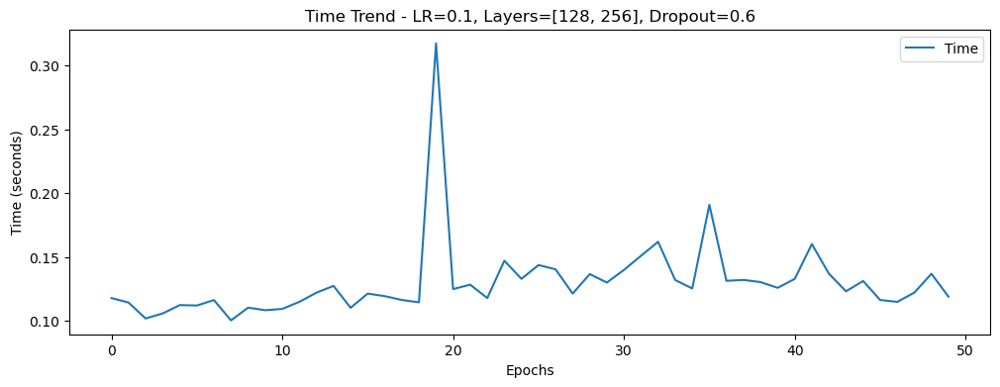

Training with lr=0.1, layers=[256, 512], dropout=0
Epoch: 0, loss: 71.42594, train_acc: 21.28%, test_acc:21.61%, time_cost:0.111
Epoch: 1, loss: 71.30359, train_acc: 22.34%, test_acc:21.61%, time_cost:0.125
Epoch: 2, loss: 71.29954, train_acc: 22.34%, test_acc:21.61%, time_cost:0.126
Epoch: 3, loss: 71.29171, train_acc: 22.34%, test_acc:21.61%, time_cost:0.134
Epoch: 4, loss: 71.30293, train_acc: 22.34%, test_acc:21.61%, time_cost:0.109
Epoch: 5, loss: 71.29995, train_acc: 22.34%, test_acc:21.61%, time_cost:0.111
Epoch: 6, loss: 71.29896, train_acc: 22.34%, test_acc:21.61%, time_cost:0.113
Epoch: 7, loss: 71.29066, train_acc: 22.34%, test_acc:21.61%, time_cost:0.109
Epoch: 8, loss: 71.30311, train_acc: 22.34%, test_acc:21.61%, time_cost:0.115
Epoch: 9, loss: 71.28861, train_acc: 22.34%, test_acc:21.61%, time_cost:0.106
Epoch: 10, loss: 71.29405, train_acc: 22.34%, test_acc:21.61%, time_cost:0.107
Epoch: 11, loss: 71.30254, train_acc: 22.34%, test_acc:21.61%, time_cost:0.106
Epoch: 12, 

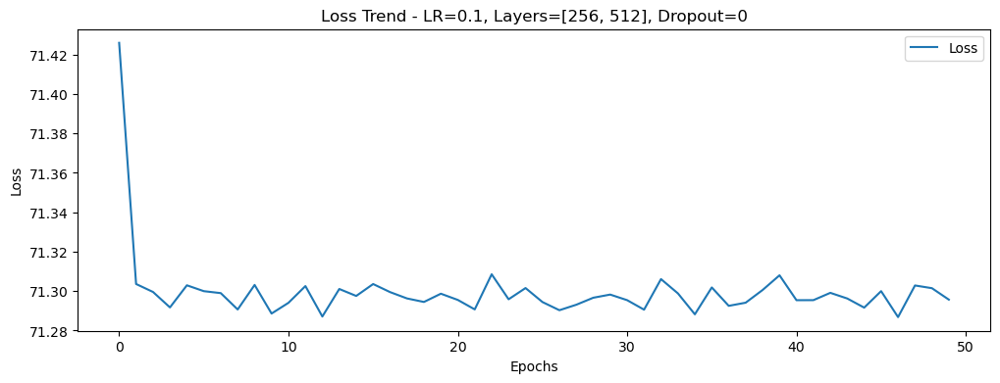

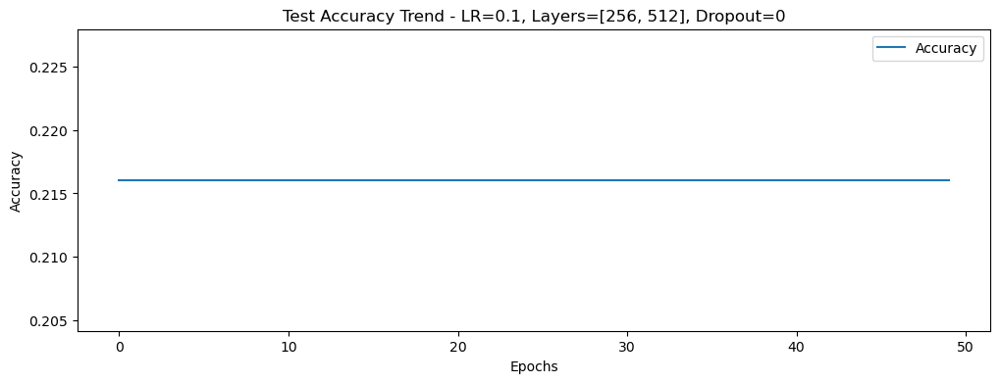

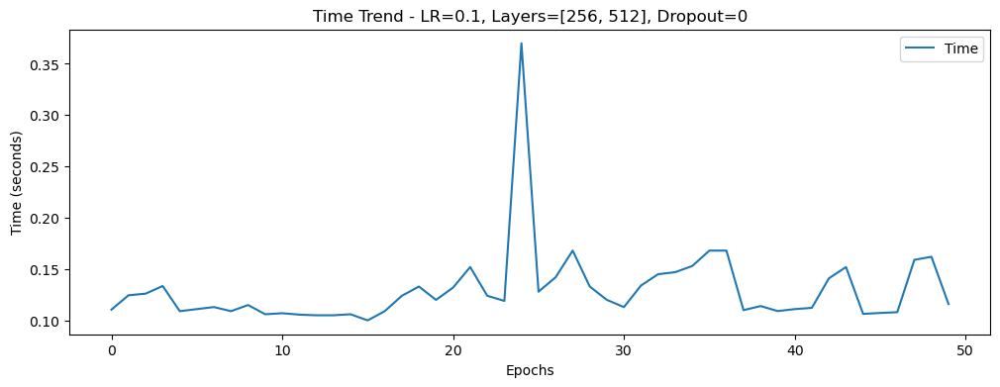

Training with lr=0.1, layers=[256, 512], dropout=0.3
Epoch: 0, loss: 71.41114, train_acc: 21.46%, test_acc:21.61%, time_cost:0.121
Epoch: 1, loss: 71.29805, train_acc: 22.34%, test_acc:21.61%, time_cost:0.114
Epoch: 2, loss: 71.29149, train_acc: 22.34%, test_acc:21.61%, time_cost:0.118
Epoch: 3, loss: 71.30381, train_acc: 22.34%, test_acc:21.61%, time_cost:0.117
Epoch: 4, loss: 71.30083, train_acc: 22.34%, test_acc:21.61%, time_cost:0.127
Epoch: 5, loss: 71.28676, train_acc: 22.34%, test_acc:21.61%, time_cost:0.120
Epoch: 6, loss: 71.29806, train_acc: 22.34%, test_acc:21.61%, time_cost:0.122
Epoch: 7, loss: 71.29239, train_acc: 22.34%, test_acc:21.61%, time_cost:0.114
Epoch: 8, loss: 71.29732, train_acc: 22.34%, test_acc:21.61%, time_cost:0.117
Epoch: 9, loss: 71.29855, train_acc: 22.34%, test_acc:21.61%, time_cost:0.118
Epoch: 10, loss: 71.29935, train_acc: 22.34%, test_acc:21.61%, time_cost:0.131
Epoch: 11, loss: 71.30545, train_acc: 22.34%, test_acc:21.61%, time_cost:0.153
Epoch: 12

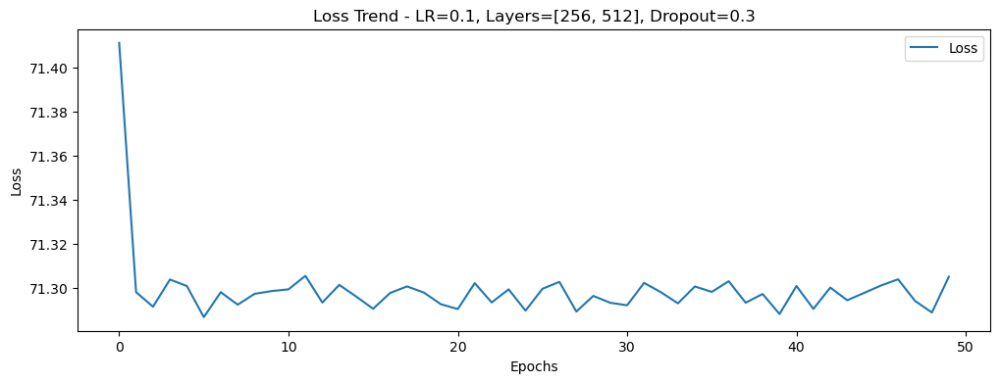

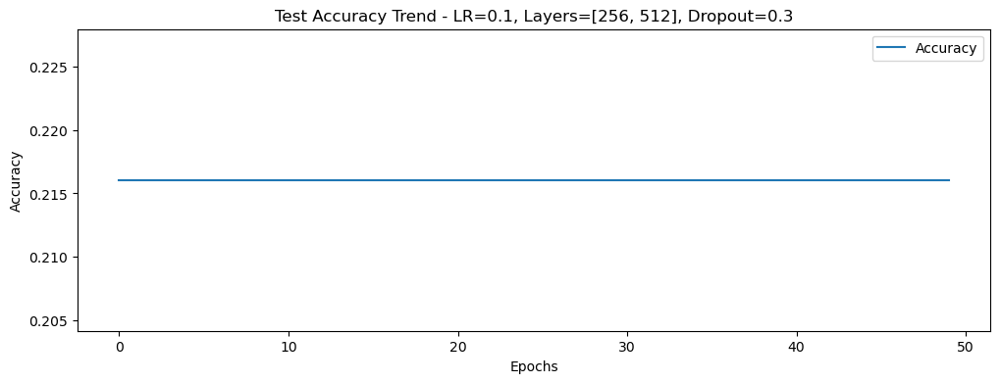

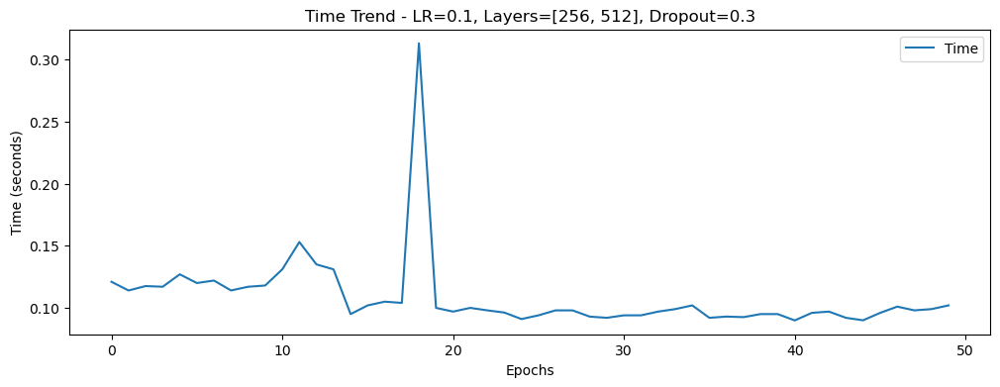

Training with lr=0.1, layers=[256, 512], dropout=0.6
Epoch: 0, loss: 71.40481, train_acc: 21.31%, test_acc:21.61%, time_cost:0.099
Epoch: 1, loss: 71.30389, train_acc: 22.34%, test_acc:21.61%, time_cost:0.106
Epoch: 2, loss: 71.29835, train_acc: 22.34%, test_acc:21.61%, time_cost:0.103
Epoch: 3, loss: 71.29312, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 4, loss: 71.30386, train_acc: 22.34%, test_acc:21.61%, time_cost:0.096
Epoch: 5, loss: 71.30101, train_acc: 22.34%, test_acc:21.61%, time_cost:0.109
Epoch: 6, loss: 71.29489, train_acc: 22.34%, test_acc:21.61%, time_cost:0.101
Epoch: 7, loss: 71.29659, train_acc: 22.34%, test_acc:21.61%, time_cost:0.103
Epoch: 8, loss: 71.29483, train_acc: 22.34%, test_acc:21.61%, time_cost:0.103
Epoch: 9, loss: 71.30402, train_acc: 22.34%, test_acc:21.61%, time_cost:0.107
Epoch: 10, loss: 71.29659, train_acc: 22.34%, test_acc:21.61%, time_cost:0.111
Epoch: 11, loss: 71.29590, train_acc: 22.34%, test_acc:21.61%, time_cost:0.113
Epoch: 12

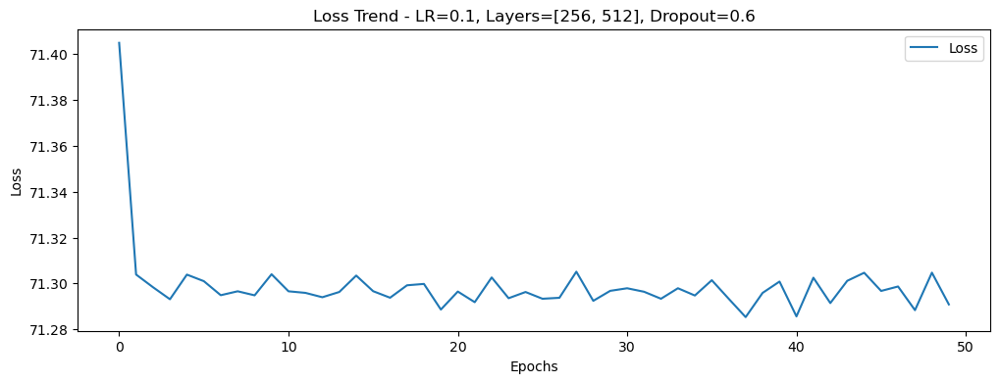

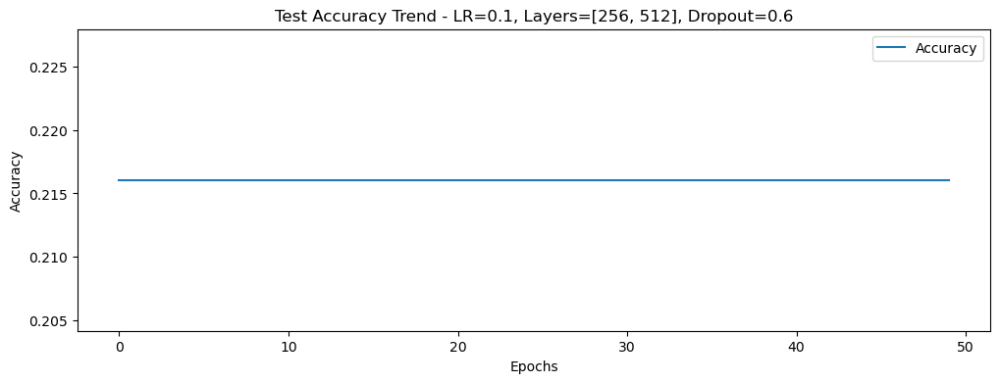

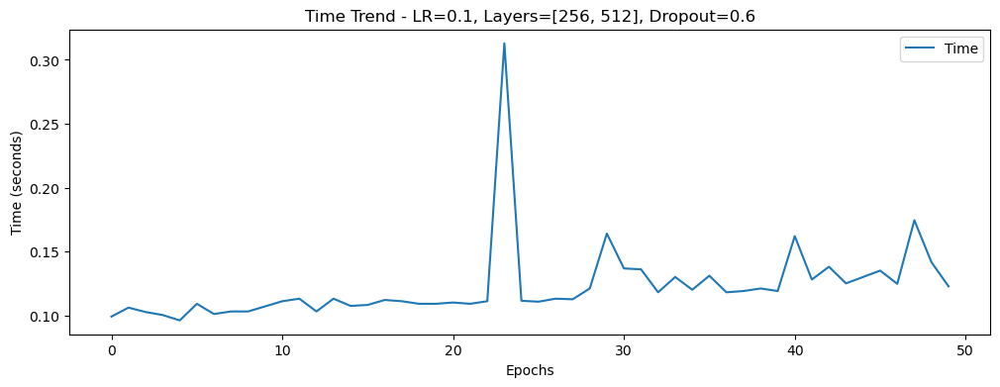

Training with lr=0.01, layers=[256], dropout=0
Epoch: 0, loss: 71.42358, train_acc: 13.19%, test_acc:24.70%, time_cost:0.129
Epoch: 1, loss: 70.45958, train_acc: 33.39%, test_acc:37.53%, time_cost:0.116
Epoch: 2, loss: 70.29011, train_acc: 36.05%, test_acc:34.73%, time_cost:0.112
Epoch: 3, loss: 70.38151, train_acc: 34.97%, test_acc:34.47%, time_cost:0.131
Epoch: 4, loss: 70.54410, train_acc: 33.33%, test_acc:30.82%, time_cost:0.108
Epoch: 5, loss: 70.70402, train_acc: 27.63%, test_acc:22.87%, time_cost:0.122
Epoch: 6, loss: 70.84028, train_acc: 22.55%, test_acc:21.61%, time_cost:0.120
Epoch: 7, loss: 70.94464, train_acc: 22.34%, test_acc:21.61%, time_cost:0.118
Epoch: 8, loss: 71.02753, train_acc: 22.34%, test_acc:21.61%, time_cost:0.116
Epoch: 9, loss: 71.09113, train_acc: 22.34%, test_acc:21.61%, time_cost:0.117
Epoch: 10, loss: 71.13824, train_acc: 22.34%, test_acc:21.61%, time_cost:0.126
Epoch: 11, loss: 71.17182, train_acc: 22.34%, test_acc:21.61%, time_cost:0.124
Epoch: 12, loss

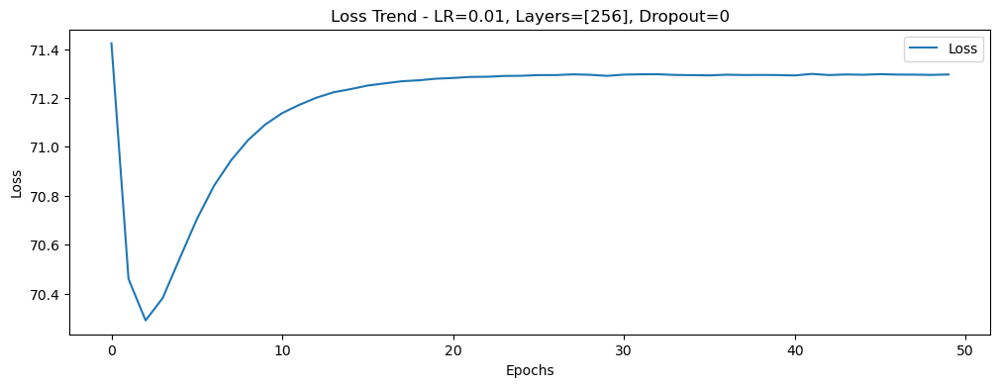

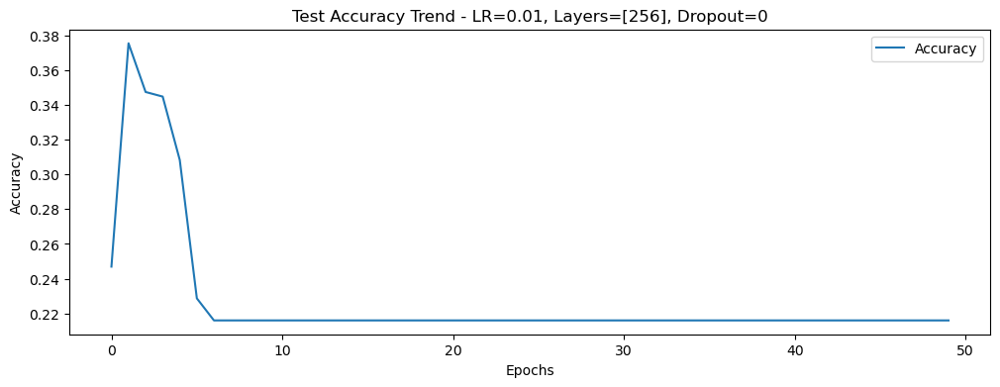

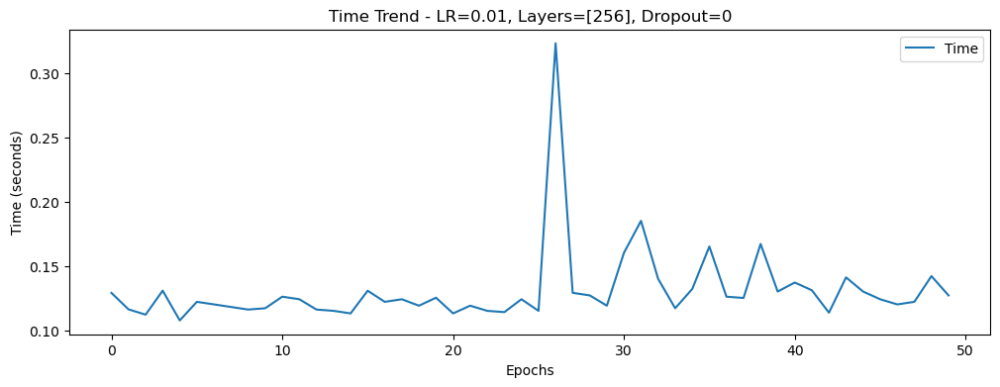

Training with lr=0.01, layers=[256], dropout=0.3
Epoch: 0, loss: 71.96372, train_acc: 9.17%, test_acc:17.99%, time_cost:0.121
Epoch: 1, loss: 70.89596, train_acc: 25.60%, test_acc:31.72%, time_cost:0.155
Epoch: 2, loss: 70.64275, train_acc: 32.23%, test_acc:31.59%, time_cost:0.134
Epoch: 3, loss: 70.65667, train_acc: 30.74%, test_acc:28.08%, time_cost:0.120
Epoch: 4, loss: 70.76986, train_acc: 26.82%, test_acc:23.35%, time_cost:0.150
Epoch: 5, loss: 70.88066, train_acc: 23.17%, test_acc:21.61%, time_cost:0.128
Epoch: 6, loss: 70.97827, train_acc: 22.34%, test_acc:21.61%, time_cost:0.118
Epoch: 7, loss: 71.05951, train_acc: 22.34%, test_acc:21.61%, time_cost:0.110
Epoch: 8, loss: 71.11651, train_acc: 22.34%, test_acc:21.61%, time_cost:0.117
Epoch: 9, loss: 71.15823, train_acc: 22.34%, test_acc:21.61%, time_cost:0.125
Epoch: 10, loss: 71.19245, train_acc: 22.34%, test_acc:21.61%, time_cost:0.118
Epoch: 11, loss: 71.21621, train_acc: 22.34%, test_acc:21.61%, time_cost:0.111
Epoch: 12, los

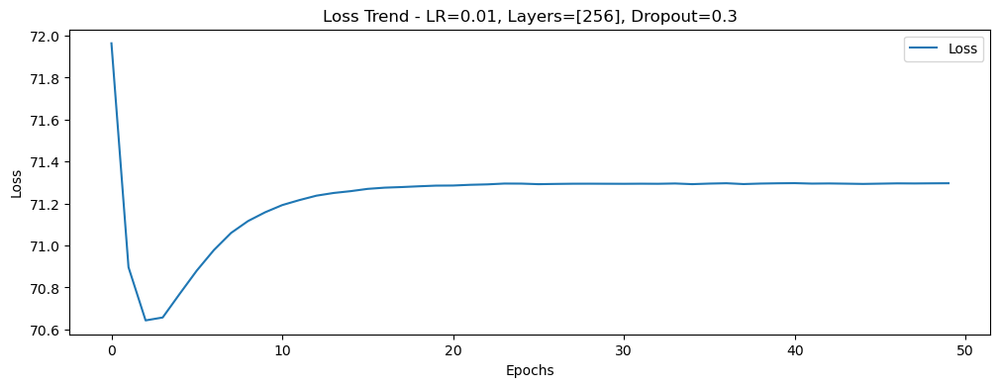

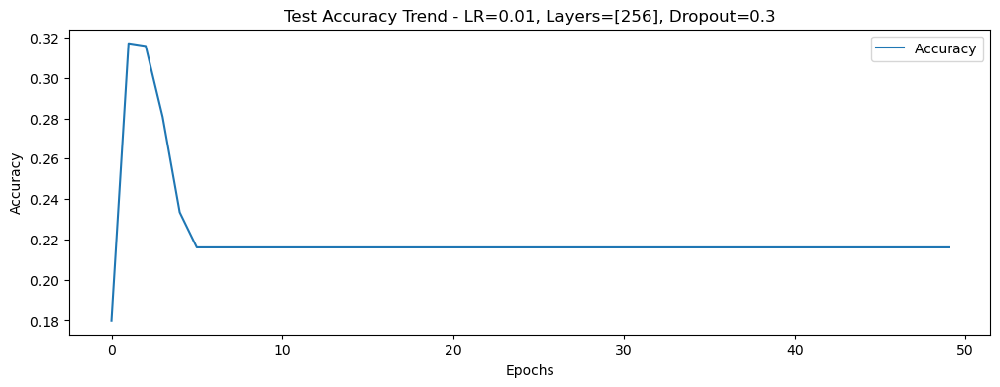

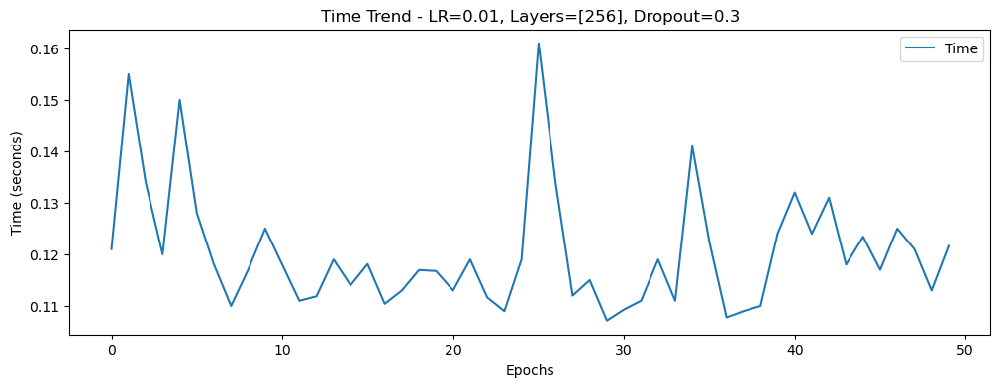

Training with lr=0.01, layers=[256], dropout=0.6
Epoch: 0, loss: 71.18279, train_acc: 14.96%, test_acc:26.33%, time_cost:0.126
Epoch: 1, loss: 70.44538, train_acc: 26.36%, test_acc:27.60%, time_cost:0.123
Epoch: 2, loss: 70.40414, train_acc: 28.27%, test_acc:26.25%, time_cost:0.127
Epoch: 3, loss: 70.52933, train_acc: 26.13%, test_acc:22.69%, time_cost:0.128
Epoch: 4, loss: 70.68835, train_acc: 23.84%, test_acc:21.61%, time_cost:0.145
Epoch: 5, loss: 70.84119, train_acc: 22.45%, test_acc:21.61%, time_cost:0.189
Epoch: 6, loss: 70.95234, train_acc: 22.34%, test_acc:21.61%, time_cost:0.125
Epoch: 7, loss: 71.04043, train_acc: 22.34%, test_acc:21.61%, time_cost:0.142
Epoch: 8, loss: 71.10092, train_acc: 22.34%, test_acc:21.61%, time_cost:0.124
Epoch: 9, loss: 71.15654, train_acc: 22.34%, test_acc:21.61%, time_cost:0.125
Epoch: 10, loss: 71.18913, train_acc: 22.34%, test_acc:21.61%, time_cost:0.154
Epoch: 11, loss: 71.21335, train_acc: 22.34%, test_acc:21.61%, time_cost:0.193
Epoch: 12, lo

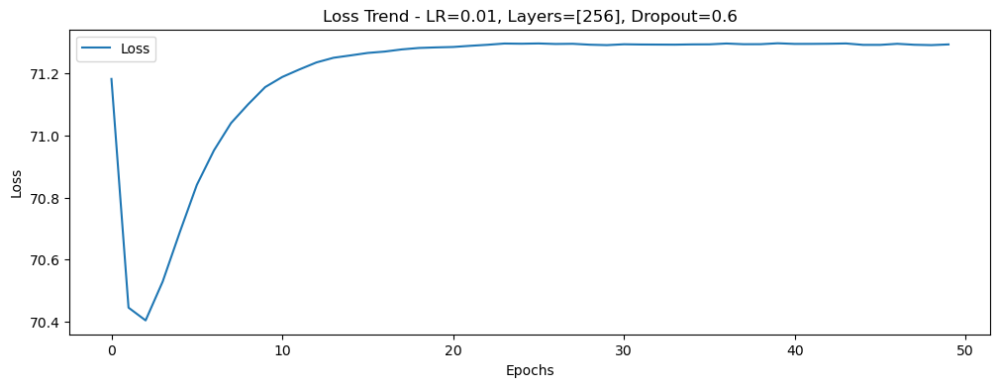

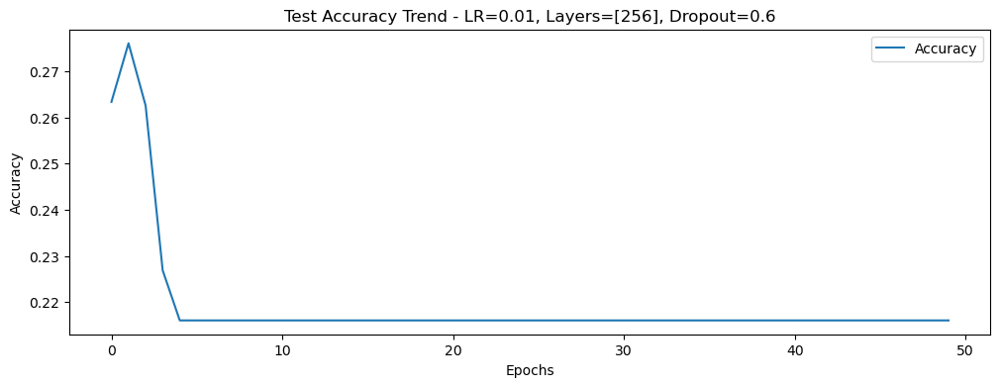

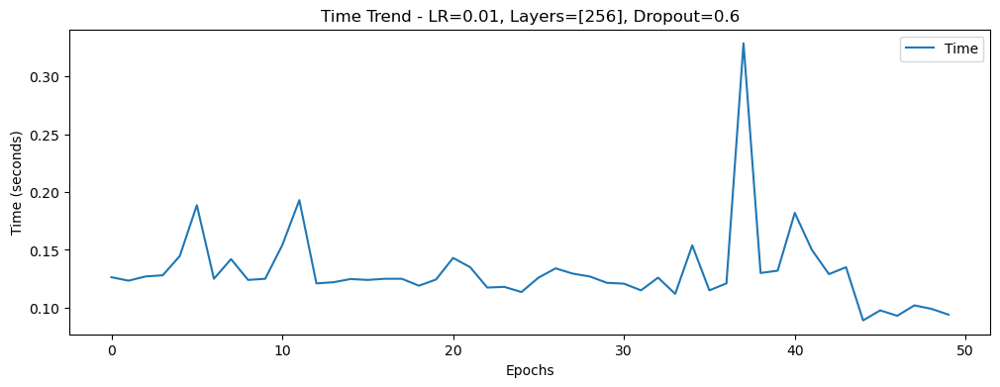

Training with lr=0.01, layers=[128, 256], dropout=0
Epoch: 0, loss: 71.63717, train_acc: 15.28%, test_acc:22.95%, time_cost:0.139
Epoch: 1, loss: 71.43905, train_acc: 22.48%, test_acc:21.61%, time_cost:0.096
Epoch: 2, loss: 71.39471, train_acc: 22.34%, test_acc:21.61%, time_cost:0.097
Epoch: 3, loss: 71.37495, train_acc: 22.34%, test_acc:21.61%, time_cost:0.097
Epoch: 4, loss: 71.36420, train_acc: 22.34%, test_acc:21.61%, time_cost:0.092
Epoch: 5, loss: 71.35206, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 6, loss: 71.34208, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 7, loss: 71.32995, train_acc: 22.34%, test_acc:21.61%, time_cost:0.101
Epoch: 8, loss: 71.32235, train_acc: 22.34%, test_acc:21.61%, time_cost:0.095
Epoch: 9, loss: 71.31721, train_acc: 22.34%, test_acc:21.61%, time_cost:0.094
Epoch: 10, loss: 71.31059, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 11, loss: 71.30811, train_acc: 22.34%, test_acc:21.61%, time_cost:0.097
Epoch: 12,

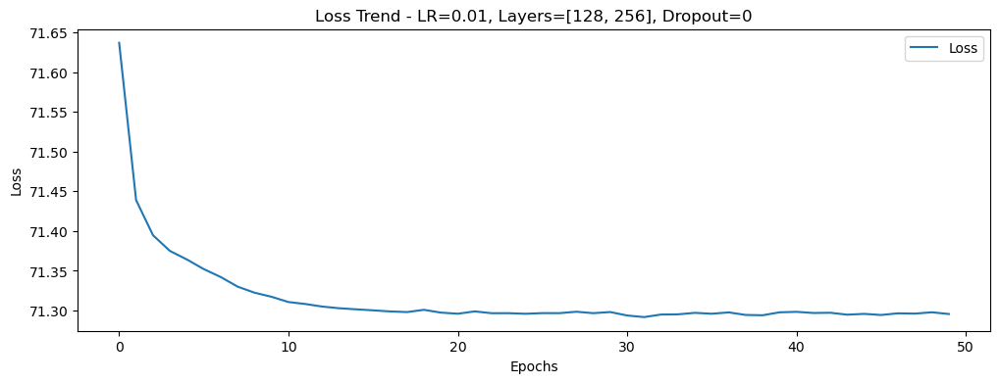

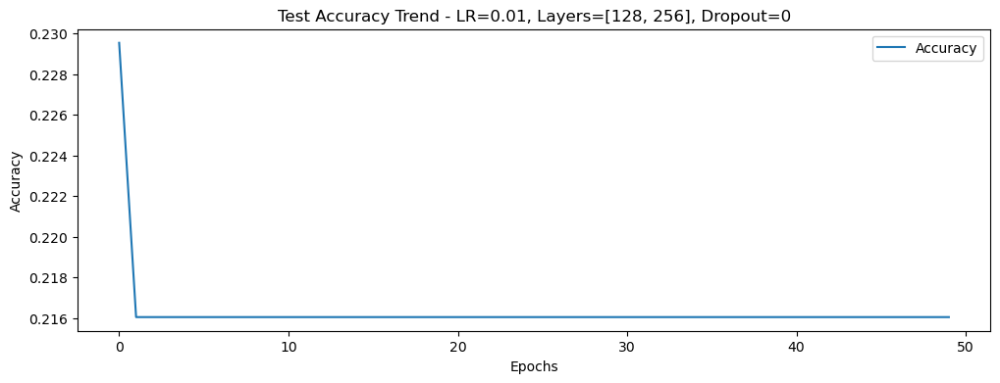

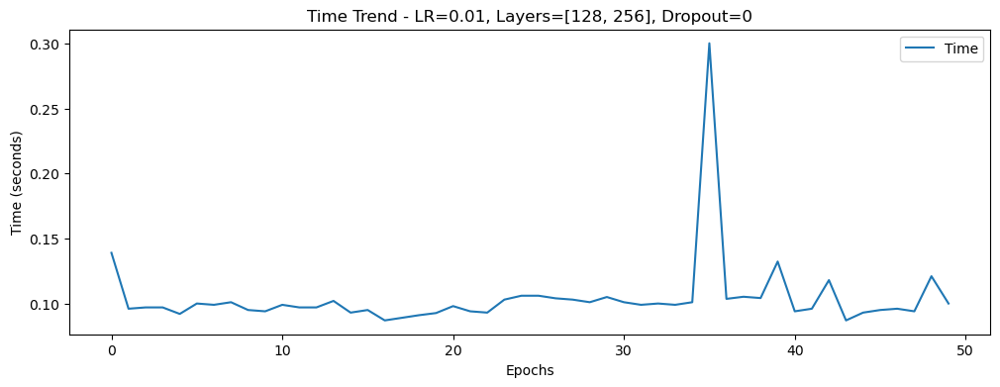

Training with lr=0.01, layers=[128, 256], dropout=0.3
Epoch: 0, loss: 71.83663, train_acc: 8.84%, test_acc:10.54%, time_cost:0.101
Epoch: 1, loss: 71.57185, train_acc: 17.40%, test_acc:26.57%, time_cost:0.099
Epoch: 2, loss: 71.49165, train_acc: 22.80%, test_acc:21.61%, time_cost:0.097
Epoch: 3, loss: 71.44658, train_acc: 22.34%, test_acc:21.61%, time_cost:0.105
Epoch: 4, loss: 71.41483, train_acc: 22.34%, test_acc:21.61%, time_cost:0.107
Epoch: 5, loss: 71.38532, train_acc: 22.34%, test_acc:21.61%, time_cost:0.140
Epoch: 6, loss: 71.36697, train_acc: 22.34%, test_acc:21.61%, time_cost:0.097
Epoch: 7, loss: 71.34686, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 8, loss: 71.33569, train_acc: 22.34%, test_acc:21.61%, time_cost:0.095
Epoch: 9, loss: 71.32665, train_acc: 22.34%, test_acc:21.61%, time_cost:0.102
Epoch: 10, loss: 71.31873, train_acc: 22.34%, test_acc:21.61%, time_cost:0.094
Epoch: 11, loss: 71.30972, train_acc: 22.34%, test_acc:21.61%, time_cost:0.093
Epoch: 12

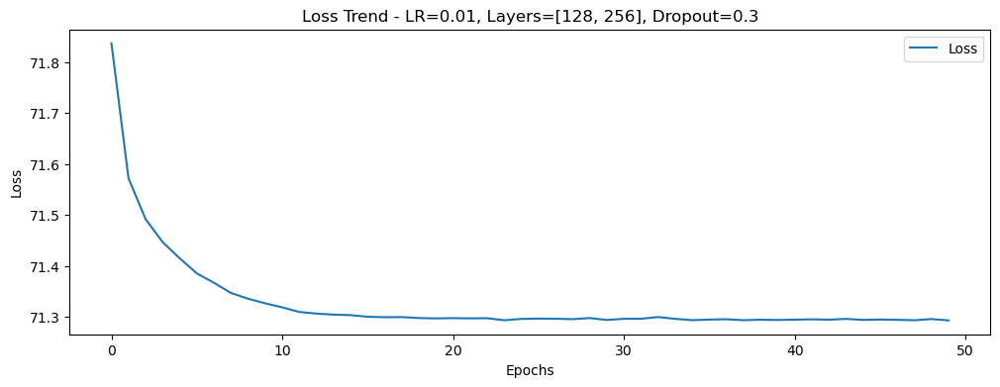

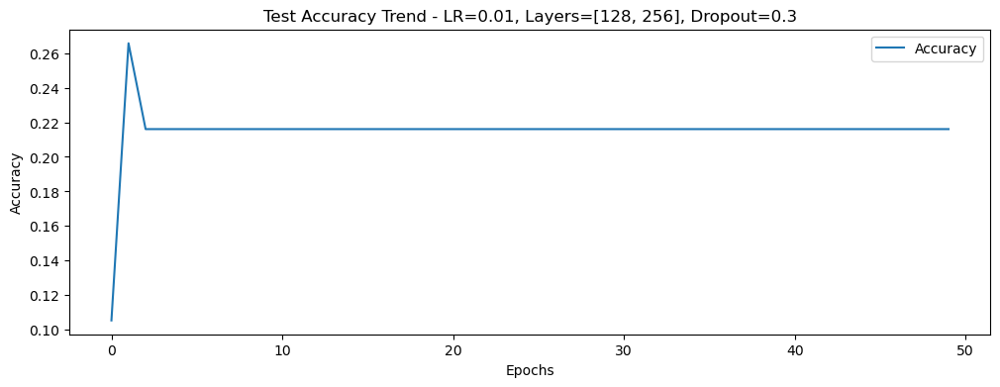

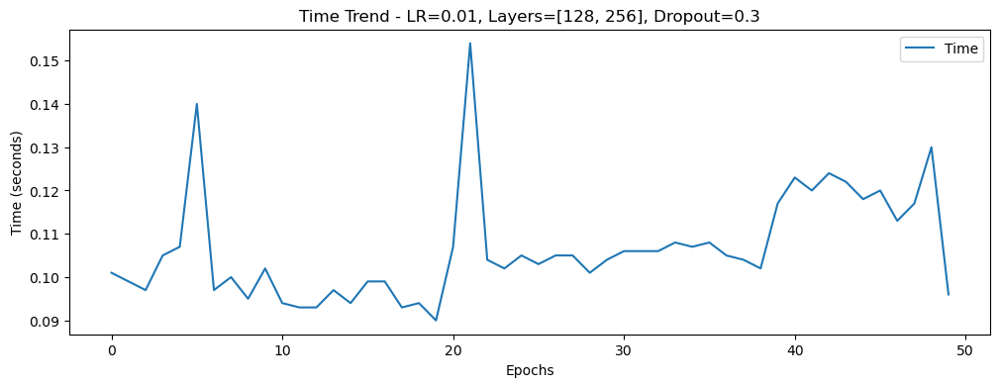

Training with lr=0.01, layers=[128, 256], dropout=0.6
Epoch: 0, loss: 71.54378, train_acc: 14.73%, test_acc:21.61%, time_cost:0.306
Epoch: 1, loss: 71.38219, train_acc: 22.02%, test_acc:21.61%, time_cost:0.130
Epoch: 2, loss: 71.35267, train_acc: 22.34%, test_acc:21.61%, time_cost:0.101
Epoch: 3, loss: 71.35140, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 4, loss: 71.34679, train_acc: 22.34%, test_acc:21.61%, time_cost:0.095
Epoch: 5, loss: 71.33798, train_acc: 22.34%, test_acc:21.61%, time_cost:0.095
Epoch: 6, loss: 71.33103, train_acc: 22.34%, test_acc:21.61%, time_cost:0.098
Epoch: 7, loss: 71.32433, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 8, loss: 71.31726, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 9, loss: 71.31212, train_acc: 22.34%, test_acc:21.61%, time_cost:0.098
Epoch: 10, loss: 71.30965, train_acc: 22.34%, test_acc:21.61%, time_cost:0.117
Epoch: 11, loss: 71.30672, train_acc: 22.34%, test_acc:21.61%, time_cost:0.094
Epoch: 1

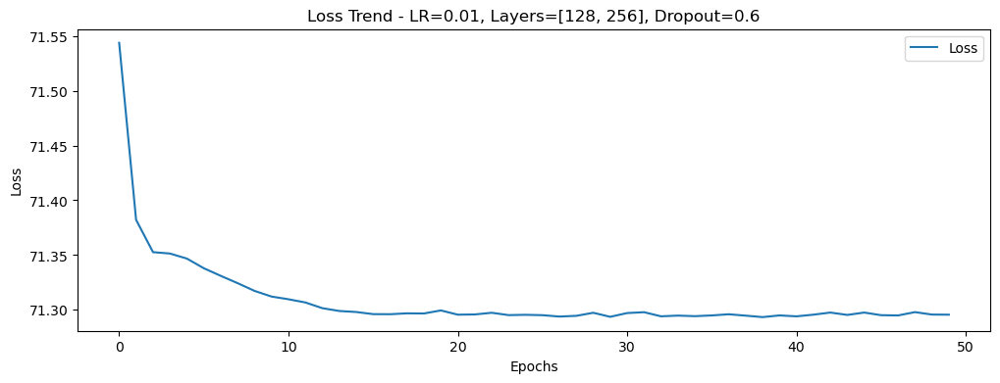

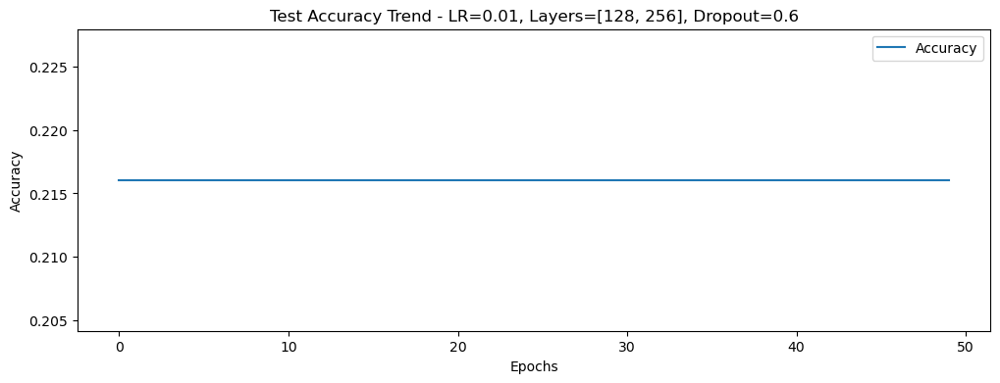

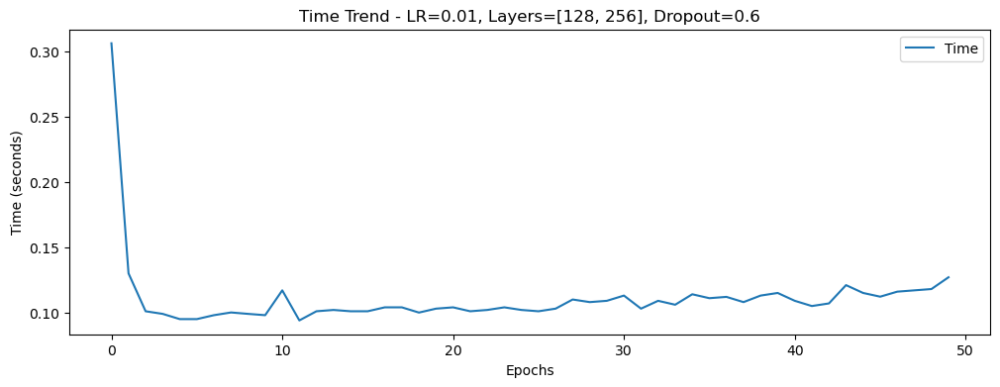

Training with lr=0.01, layers=[256, 512], dropout=0
Epoch: 0, loss: 71.46488, train_acc: 20.35%, test_acc:21.61%, time_cost:0.120
Epoch: 1, loss: 71.31134, train_acc: 22.34%, test_acc:21.61%, time_cost:0.130
Epoch: 2, loss: 71.32060, train_acc: 22.34%, test_acc:21.61%, time_cost:0.120
Epoch: 3, loss: 71.33831, train_acc: 22.34%, test_acc:21.61%, time_cost:0.144
Epoch: 4, loss: 71.34620, train_acc: 22.34%, test_acc:21.61%, time_cost:0.132
Epoch: 5, loss: 71.34445, train_acc: 22.34%, test_acc:21.61%, time_cost:0.122
Epoch: 6, loss: 71.33687, train_acc: 22.34%, test_acc:21.61%, time_cost:0.134
Epoch: 7, loss: 71.32949, train_acc: 22.34%, test_acc:21.61%, time_cost:0.100
Epoch: 8, loss: 71.32432, train_acc: 22.34%, test_acc:21.61%, time_cost:0.098
Epoch: 9, loss: 71.31480, train_acc: 22.34%, test_acc:21.61%, time_cost:0.095
Epoch: 10, loss: 71.31079, train_acc: 22.34%, test_acc:21.61%, time_cost:0.096
Epoch: 11, loss: 71.30949, train_acc: 22.34%, test_acc:21.61%, time_cost:0.285
Epoch: 12,

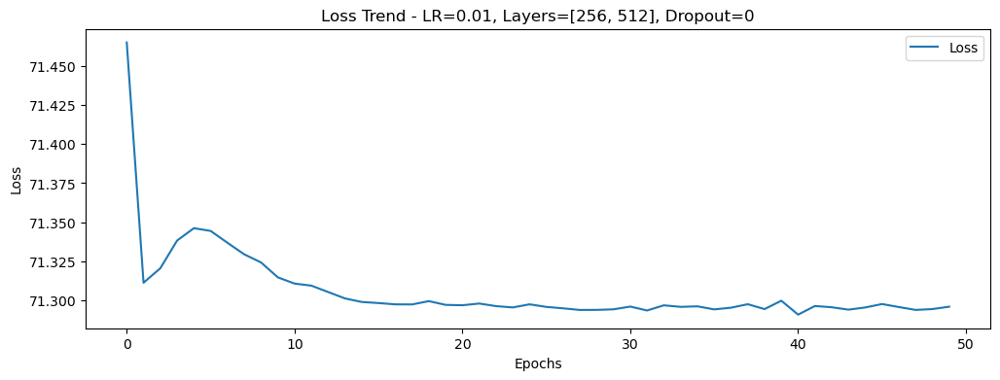

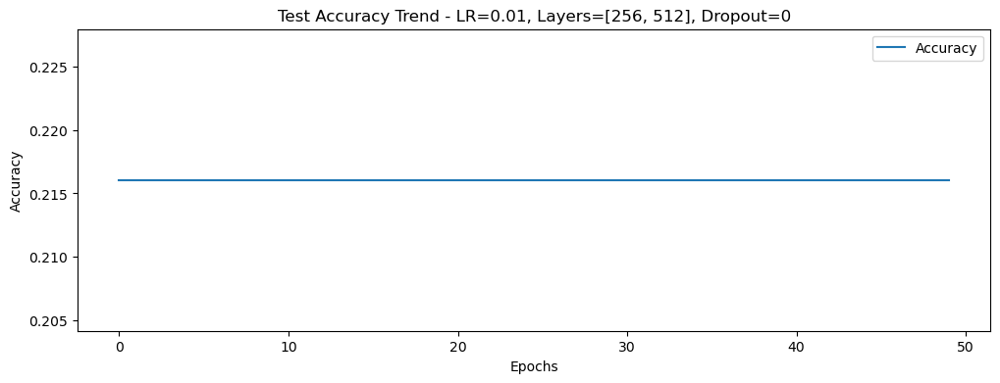

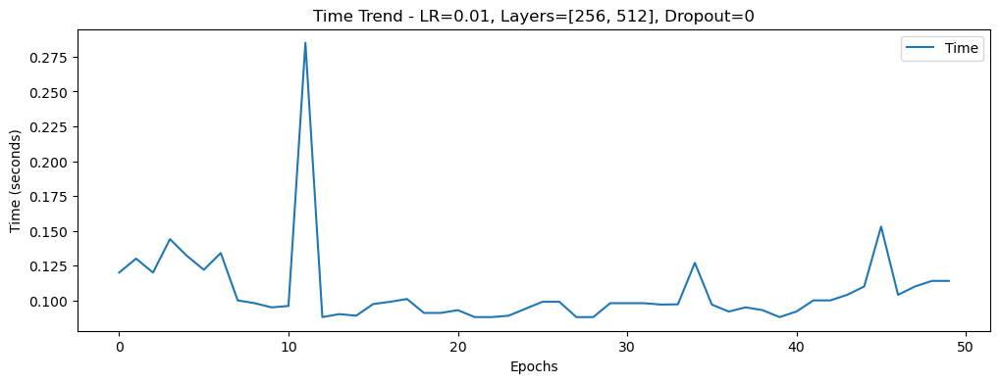

Training with lr=0.01, layers=[256, 512], dropout=0.3
Epoch: 0, loss: 71.56637, train_acc: 17.94%, test_acc:21.61%, time_cost:0.110
Epoch: 1, loss: 71.34090, train_acc: 22.37%, test_acc:21.61%, time_cost:0.106
Epoch: 2, loss: 71.32180, train_acc: 22.34%, test_acc:21.61%, time_cost:0.111
Epoch: 3, loss: 71.33220, train_acc: 22.34%, test_acc:21.61%, time_cost:0.111
Epoch: 4, loss: 71.33831, train_acc: 22.34%, test_acc:21.61%, time_cost:0.118
Epoch: 5, loss: 71.33645, train_acc: 22.34%, test_acc:21.61%, time_cost:0.102
Epoch: 6, loss: 71.32657, train_acc: 22.34%, test_acc:21.61%, time_cost:0.101
Epoch: 7, loss: 71.32447, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 8, loss: 71.31790, train_acc: 22.34%, test_acc:21.61%, time_cost:0.095
Epoch: 9, loss: 71.31231, train_acc: 22.34%, test_acc:21.61%, time_cost:0.099
Epoch: 10, loss: 71.30718, train_acc: 22.34%, test_acc:21.61%, time_cost:0.102
Epoch: 11, loss: 71.30421, train_acc: 22.34%, test_acc:21.61%, time_cost:0.120
Epoch: 1

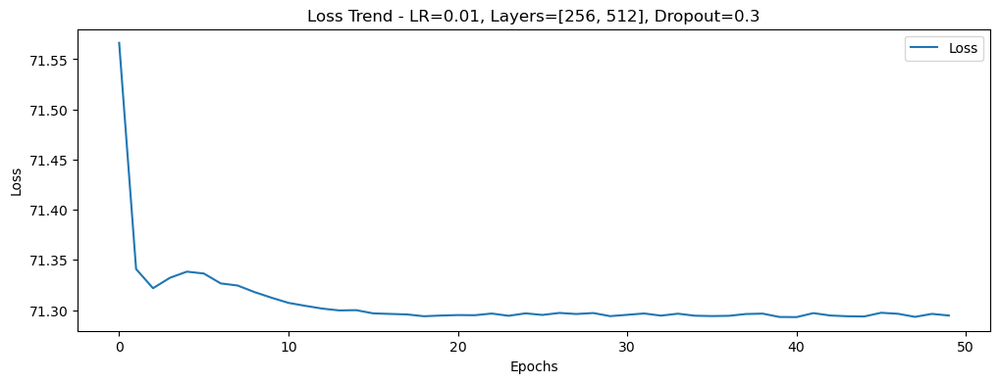

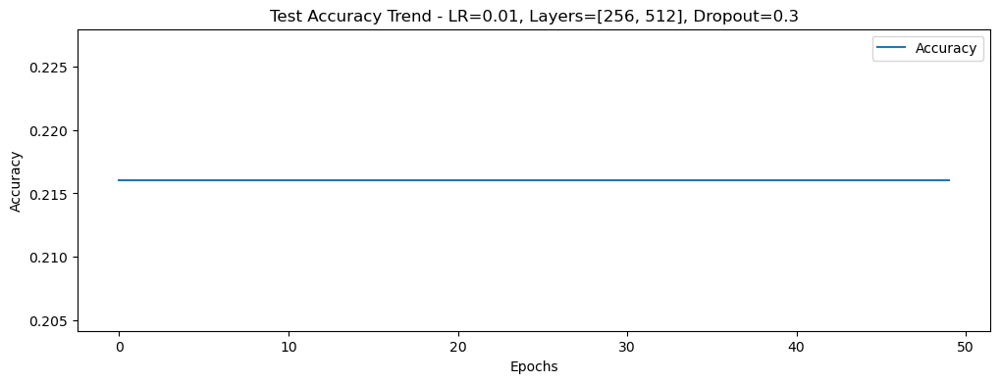

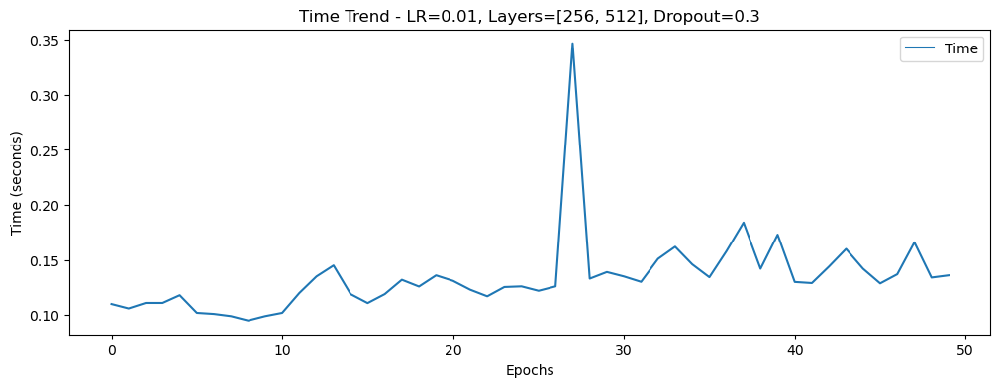

Training with lr=0.01, layers=[256, 512], dropout=0.6
Epoch: 0, loss: 71.94675, train_acc: 9.13%, test_acc:12.78%, time_cost:0.124
Epoch: 1, loss: 71.57903, train_acc: 17.90%, test_acc:21.63%, time_cost:0.134
Epoch: 2, loss: 71.47123, train_acc: 22.62%, test_acc:21.61%, time_cost:0.134
Epoch: 3, loss: 71.43366, train_acc: 22.34%, test_acc:21.61%, time_cost:0.134
Epoch: 4, loss: 71.40762, train_acc: 22.34%, test_acc:21.61%, time_cost:0.128
Epoch: 5, loss: 71.38322, train_acc: 22.34%, test_acc:21.61%, time_cost:0.130
Epoch: 6, loss: 71.36746, train_acc: 22.34%, test_acc:21.61%, time_cost:0.137
Epoch: 7, loss: 71.34779, train_acc: 22.34%, test_acc:21.61%, time_cost:0.136
Epoch: 8, loss: 71.33530, train_acc: 22.34%, test_acc:21.61%, time_cost:0.137
Epoch: 9, loss: 71.32797, train_acc: 22.34%, test_acc:21.61%, time_cost:0.142
Epoch: 10, loss: 71.32025, train_acc: 22.34%, test_acc:21.61%, time_cost:0.143
Epoch: 11, loss: 71.31157, train_acc: 22.34%, test_acc:21.61%, time_cost:0.169
Epoch: 12

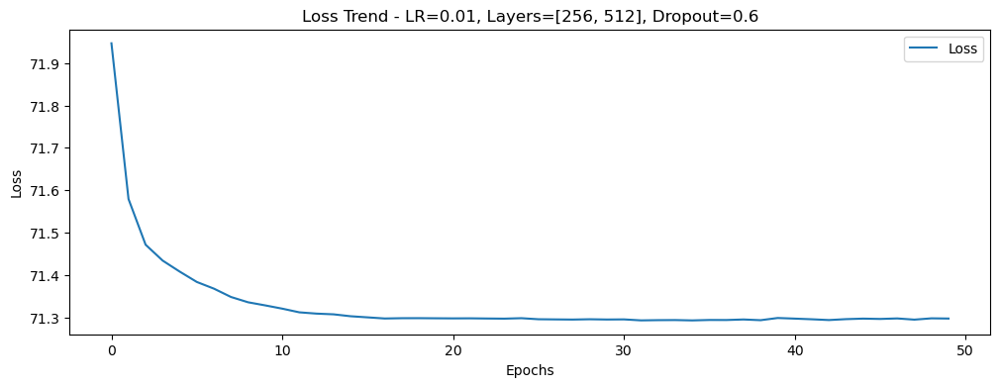

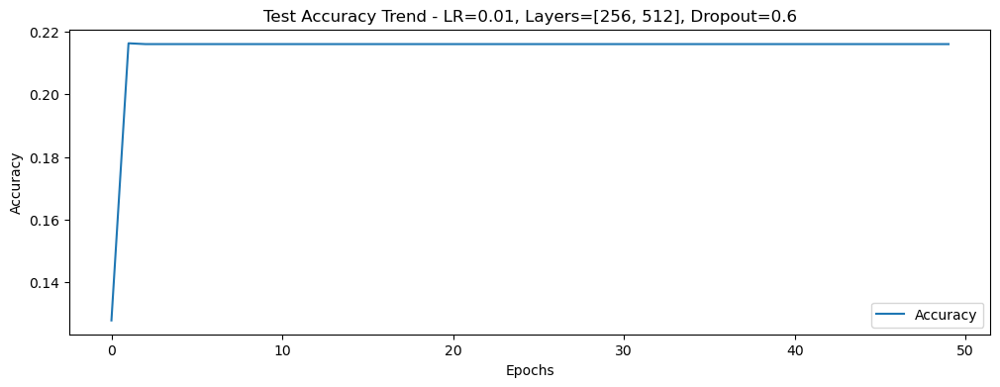

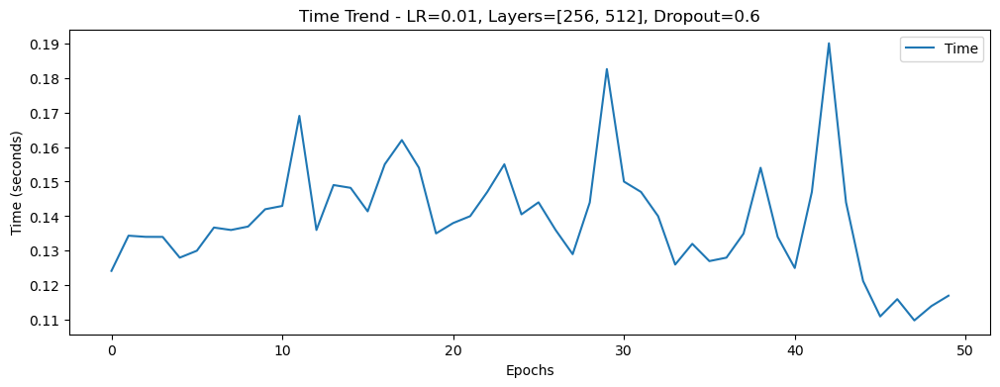

Training with lr=0.001, layers=[256], dropout=0
Epoch: 0, loss: 72.15002, train_acc: 9.14%, test_acc:9.30%, time_cost:0.112
Epoch: 1, loss: 71.93105, train_acc: 9.94%, test_acc:10.25%, time_cost:0.113
Epoch: 2, loss: 71.72958, train_acc: 11.08%, test_acc:11.60%, time_cost:0.087
Epoch: 3, loss: 71.56260, train_acc: 12.37%, test_acc:13.34%, time_cost:0.097
Epoch: 4, loss: 71.40272, train_acc: 13.82%, test_acc:15.13%, time_cost:0.096
Epoch: 5, loss: 71.26635, train_acc: 15.68%, test_acc:16.83%, time_cost:0.094
Epoch: 6, loss: 71.14505, train_acc: 17.45%, test_acc:18.83%, time_cost:0.094
Epoch: 7, loss: 71.03764, train_acc: 19.36%, test_acc:20.92%, time_cost:0.098
Epoch: 8, loss: 70.94120, train_acc: 21.36%, test_acc:23.22%, time_cost:0.091
Epoch: 9, loss: 70.85900, train_acc: 23.37%, test_acc:25.96%, time_cost:0.092
Epoch: 10, loss: 70.78829, train_acc: 25.56%, test_acc:27.73%, time_cost:0.097
Epoch: 11, loss: 70.72101, train_acc: 27.99%, test_acc:29.85%, time_cost:0.094
Epoch: 12, loss: 

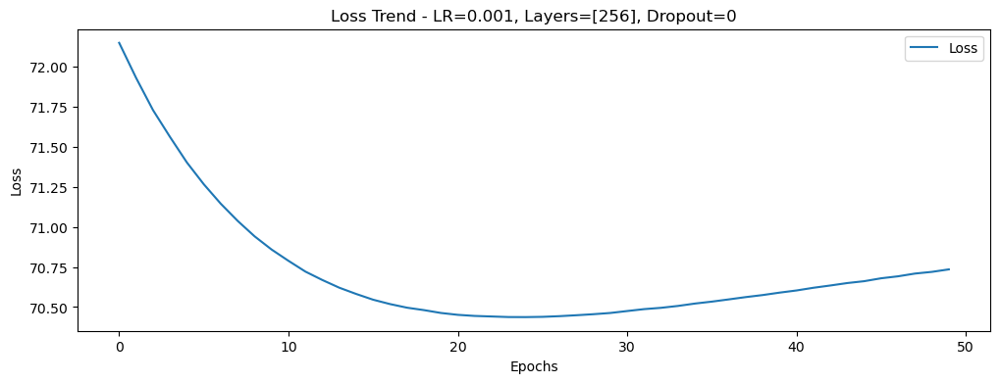

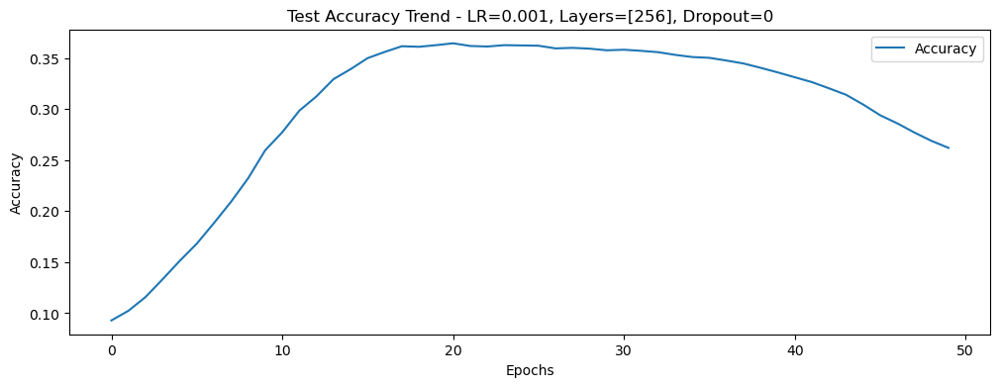

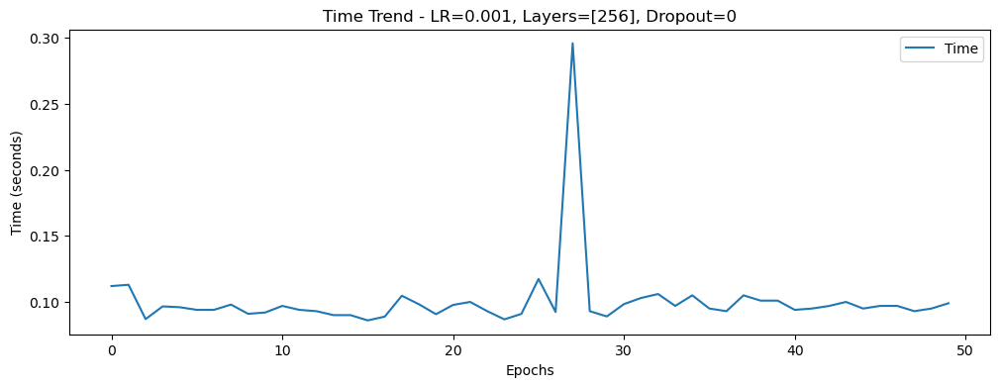

Training with lr=0.001, layers=[256], dropout=0.3
Epoch: 0, loss: 71.61585, train_acc: 13.07%, test_acc:16.16%, time_cost:0.106
Epoch: 1, loss: 71.39767, train_acc: 15.37%, test_acc:18.91%, time_cost:0.108
Epoch: 2, loss: 71.22605, train_acc: 17.76%, test_acc:21.39%, time_cost:0.110
Epoch: 3, loss: 71.07211, train_acc: 19.97%, test_acc:23.96%, time_cost:0.111
Epoch: 4, loss: 70.95299, train_acc: 21.46%, test_acc:26.10%, time_cost:0.127
Epoch: 5, loss: 70.82837, train_acc: 23.50%, test_acc:27.55%, time_cost:0.117
Epoch: 6, loss: 70.72466, train_acc: 25.14%, test_acc:28.92%, time_cost:0.119
Epoch: 7, loss: 70.64078, train_acc: 26.39%, test_acc:29.56%, time_cost:0.116
Epoch: 8, loss: 70.55255, train_acc: 27.98%, test_acc:30.22%, time_cost:0.186
Epoch: 9, loss: 70.49004, train_acc: 28.75%, test_acc:30.61%, time_cost:0.143
Epoch: 10, loss: 70.42393, train_acc: 29.88%, test_acc:30.96%, time_cost:0.120
Epoch: 11, loss: 70.37866, train_acc: 30.33%, test_acc:31.30%, time_cost:0.116
Epoch: 12, l

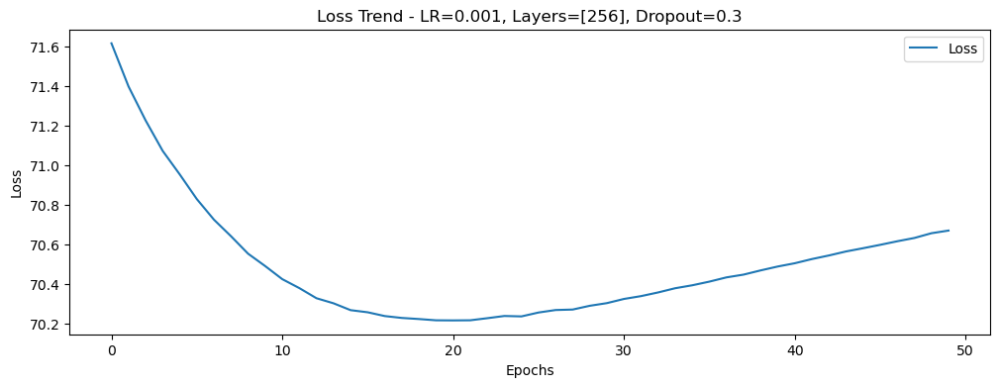

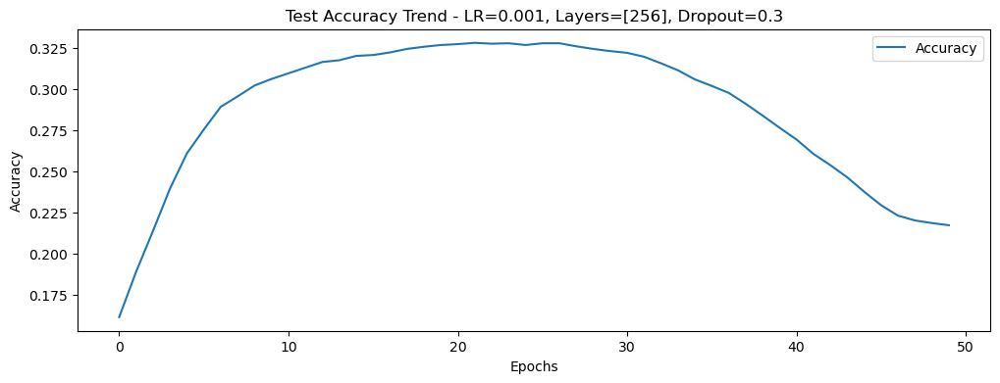

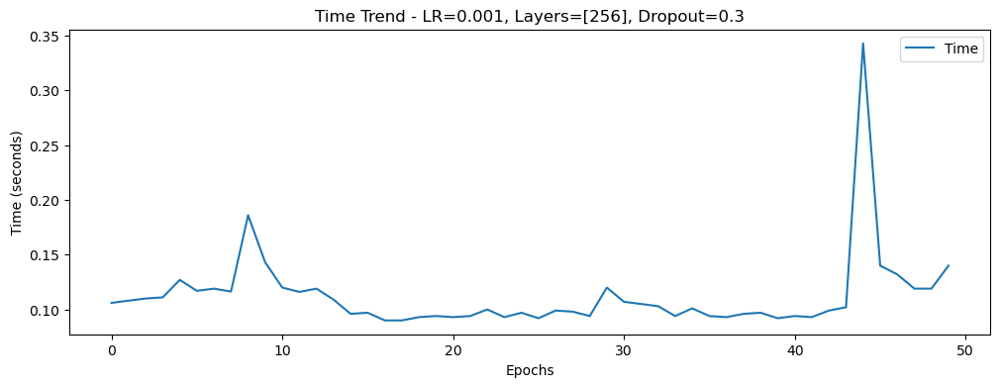

Training with lr=0.001, layers=[256], dropout=0.6
Epoch: 0, loss: 72.11579, train_acc: 8.22%, test_acc:6.89%, time_cost:0.123
Epoch: 1, loss: 71.88791, train_acc: 8.95%, test_acc:7.71%, time_cost:0.099
Epoch: 2, loss: 71.68263, train_acc: 9.97%, test_acc:9.32%, time_cost:0.094
Epoch: 3, loss: 71.46374, train_acc: 11.50%, test_acc:11.65%, time_cost:0.099
Epoch: 4, loss: 71.33540, train_acc: 12.45%, test_acc:13.73%, time_cost:0.091
Epoch: 5, loss: 71.17086, train_acc: 13.32%, test_acc:16.48%, time_cost:0.102
Epoch: 6, loss: 71.09238, train_acc: 14.96%, test_acc:19.41%, time_cost:0.090
Epoch: 7, loss: 70.94677, train_acc: 16.46%, test_acc:22.24%, time_cost:0.088
Epoch: 8, loss: 70.81308, train_acc: 18.98%, test_acc:25.22%, time_cost:0.092
Epoch: 9, loss: 70.78639, train_acc: 19.44%, test_acc:27.36%, time_cost:0.092
Epoch: 10, loss: 70.70721, train_acc: 21.36%, test_acc:29.74%, time_cost:0.093
Epoch: 11, loss: 70.63499, train_acc: 23.39%, test_acc:31.43%, time_cost:0.091
Epoch: 12, loss: 7

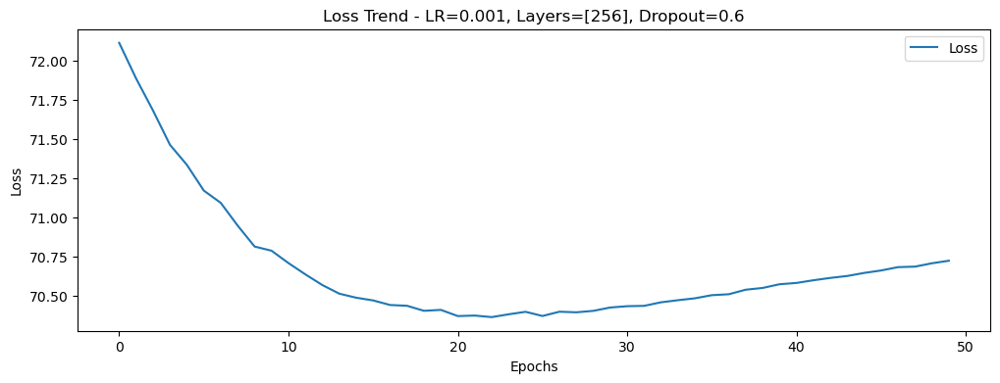

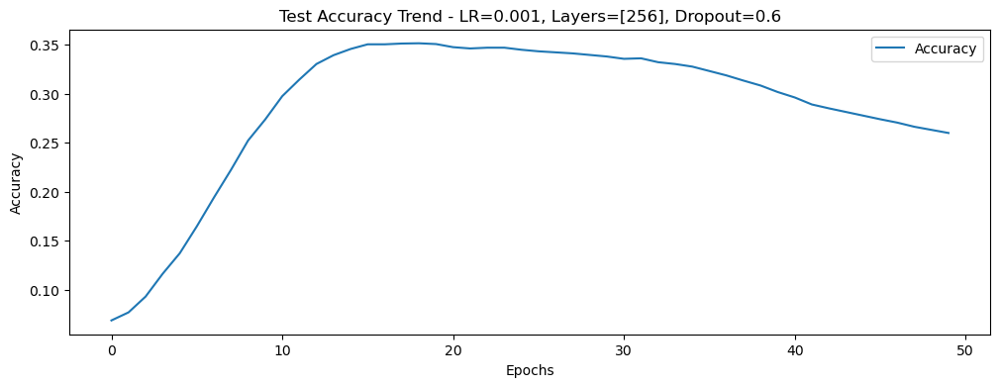

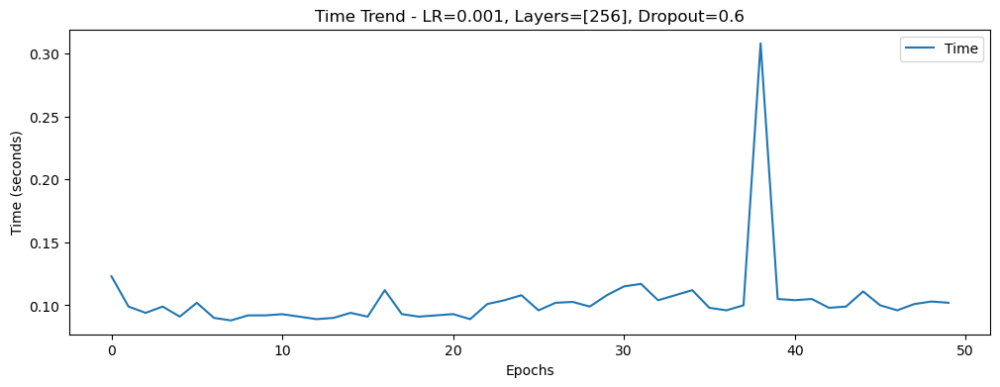

Training with lr=0.001, layers=[128, 256], dropout=0
Epoch: 0, loss: 72.25826, train_acc: 8.28%, test_acc:7.69%, time_cost:0.104
Epoch: 1, loss: 72.17784, train_acc: 8.33%, test_acc:7.69%, time_cost:0.104
Epoch: 2, loss: 72.10133, train_acc: 8.43%, test_acc:7.77%, time_cost:0.105
Epoch: 3, loss: 72.03462, train_acc: 8.49%, test_acc:7.77%, time_cost:0.105
Epoch: 4, loss: 71.97870, train_acc: 8.53%, test_acc:7.71%, time_cost:0.166
Epoch: 5, loss: 71.92728, train_acc: 8.56%, test_acc:7.63%, time_cost:0.124
Epoch: 6, loss: 71.88162, train_acc: 8.58%, test_acc:7.53%, time_cost:0.103
Epoch: 7, loss: 71.84404, train_acc: 8.58%, test_acc:7.74%, time_cost:0.105
Epoch: 8, loss: 71.80767, train_acc: 8.78%, test_acc:8.06%, time_cost:0.103
Epoch: 9, loss: 71.77757, train_acc: 9.15%, test_acc:8.43%, time_cost:0.105
Epoch: 10, loss: 71.74965, train_acc: 10.03%, test_acc:9.96%, time_cost:0.101
Epoch: 11, loss: 71.72437, train_acc: 12.12%, test_acc:13.18%, time_cost:0.104
Epoch: 12, loss: 71.70182, tra

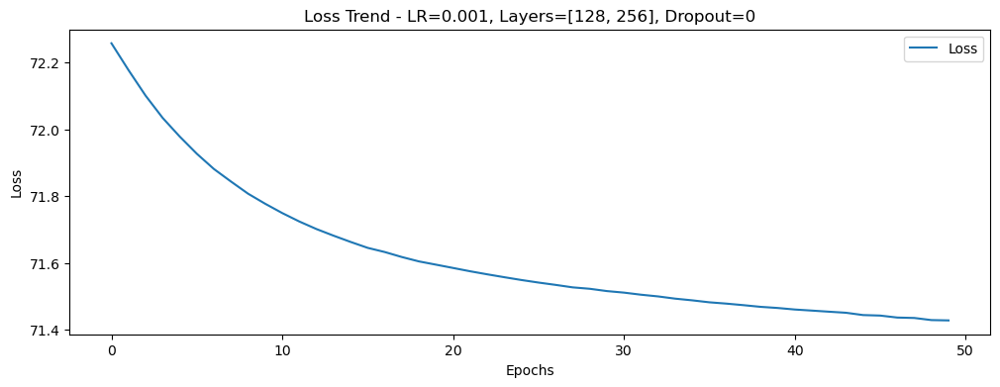

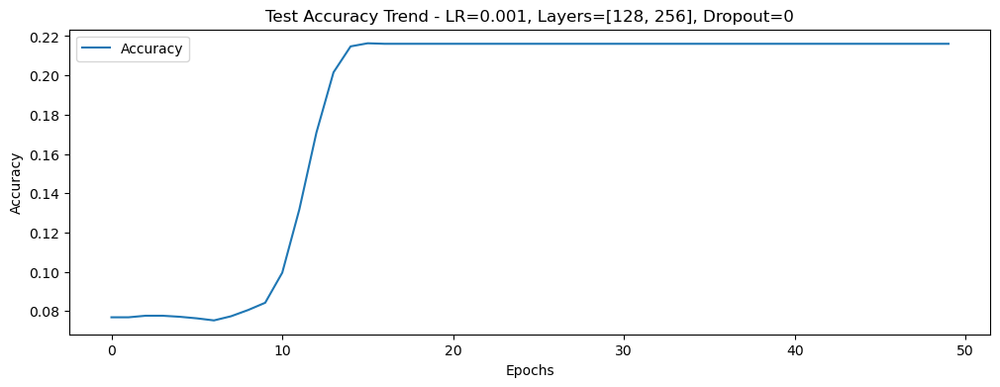

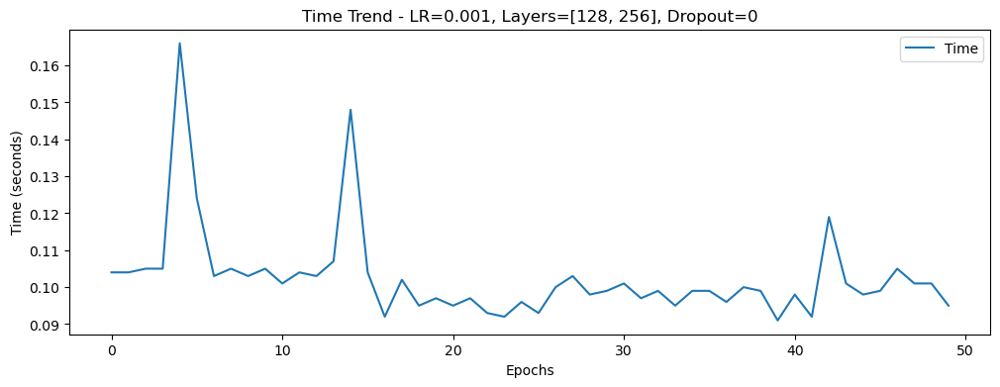

Training with lr=0.001, layers=[128, 256], dropout=0.3
Epoch: 0, loss: 71.79954, train_acc: 10.67%, test_acc:13.10%, time_cost:0.151
Epoch: 1, loss: 71.74251, train_acc: 10.80%, test_acc:13.42%, time_cost:0.107
Epoch: 2, loss: 71.70782, train_acc: 11.31%, test_acc:13.71%, time_cost:0.115
Epoch: 3, loss: 71.65427, train_acc: 12.63%, test_acc:14.34%, time_cost:0.384
Epoch: 4, loss: 71.61782, train_acc: 13.58%, test_acc:14.79%, time_cost:0.155
Epoch: 5, loss: 71.58036, train_acc: 14.13%, test_acc:15.66%, time_cost:0.144
Epoch: 6, loss: 71.56987, train_acc: 15.41%, test_acc:17.17%, time_cost:0.114
Epoch: 7, loss: 71.54340, train_acc: 16.33%, test_acc:18.86%, time_cost:0.161
Epoch: 8, loss: 71.52483, train_acc: 17.66%, test_acc:20.79%, time_cost:0.133
Epoch: 9, loss: 71.51380, train_acc: 18.87%, test_acc:22.61%, time_cost:0.146
Epoch: 10, loss: 71.49578, train_acc: 20.46%, test_acc:23.11%, time_cost:0.109
Epoch: 11, loss: 71.48140, train_acc: 21.05%, test_acc:23.27%, time_cost:0.120
Epoch: 

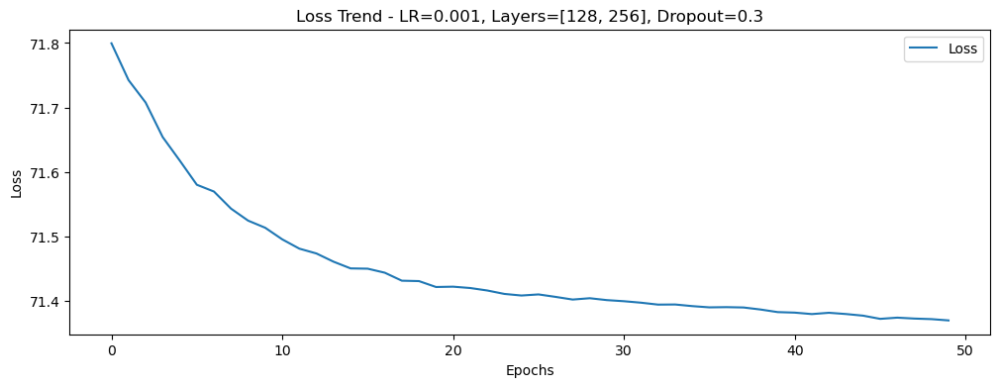

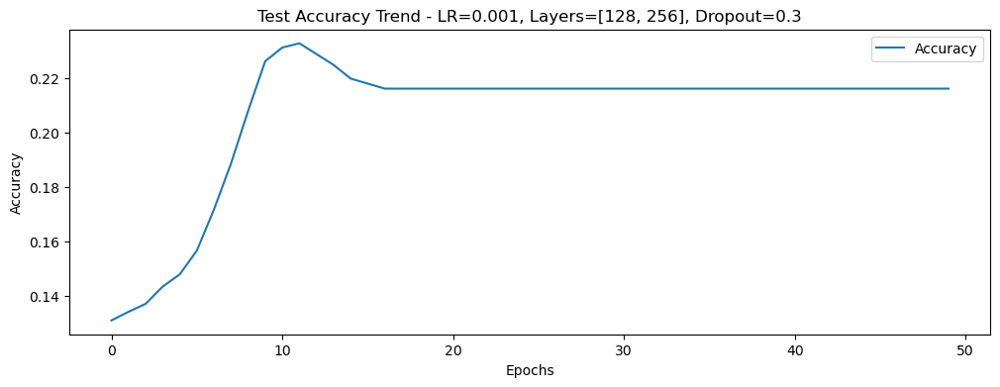

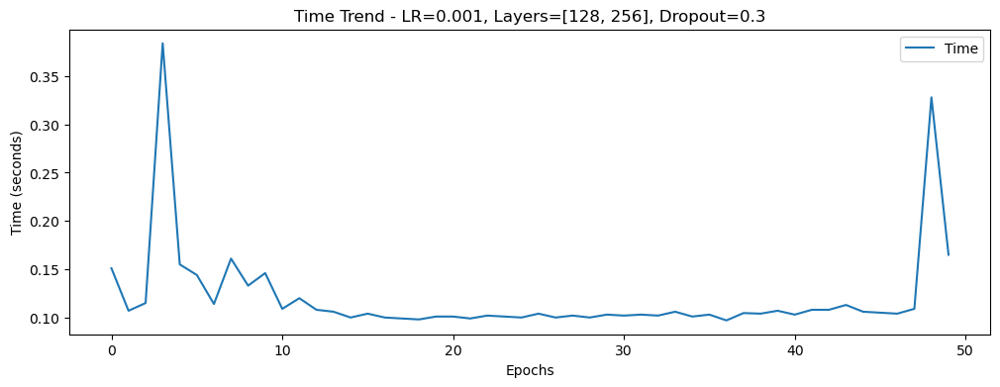

Training with lr=0.001, layers=[128, 256], dropout=0.6
Epoch: 0, loss: 71.85532, train_acc: 10.45%, test_acc:9.96%, time_cost:0.105
Epoch: 1, loss: 71.84254, train_acc: 10.61%, test_acc:10.17%, time_cost:0.151
Epoch: 2, loss: 71.74153, train_acc: 10.94%, test_acc:10.64%, time_cost:0.111
Epoch: 3, loss: 71.74041, train_acc: 11.39%, test_acc:11.12%, time_cost:0.115
Epoch: 4, loss: 71.67796, train_acc: 12.25%, test_acc:11.30%, time_cost:0.114
Epoch: 5, loss: 71.64415, train_acc: 12.85%, test_acc:11.46%, time_cost:0.110
Epoch: 6, loss: 71.60910, train_acc: 12.98%, test_acc:11.94%, time_cost:0.107
Epoch: 7, loss: 71.58418, train_acc: 13.87%, test_acc:12.18%, time_cost:0.113
Epoch: 8, loss: 71.56944, train_acc: 14.38%, test_acc:12.84%, time_cost:0.108
Epoch: 9, loss: 71.57070, train_acc: 14.13%, test_acc:12.97%, time_cost:0.109
Epoch: 10, loss: 71.54378, train_acc: 15.33%, test_acc:14.03%, time_cost:0.108
Epoch: 11, loss: 71.52509, train_acc: 16.32%, test_acc:15.21%, time_cost:0.112
Epoch: 1

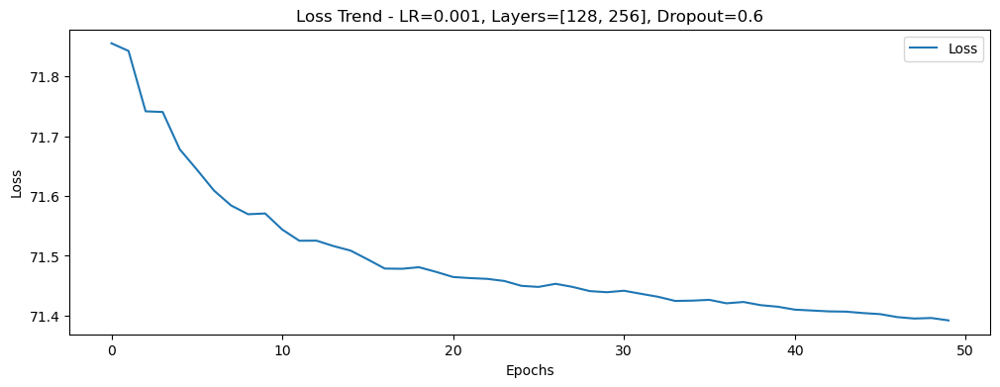

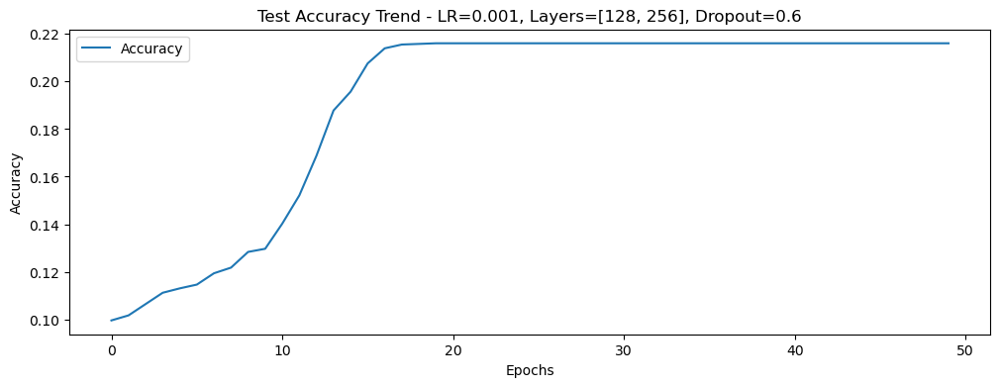

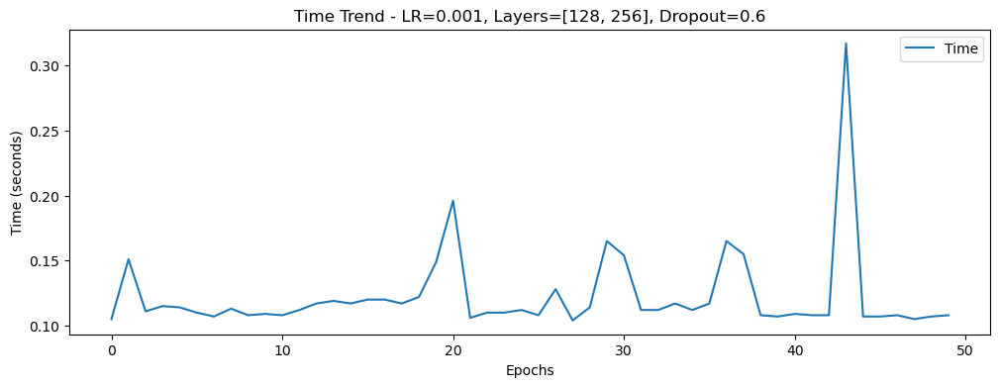

Training with lr=0.001, layers=[256, 512], dropout=0
Epoch: 0, loss: 72.03190, train_acc: 5.65%, test_acc:6.26%, time_cost:0.107
Epoch: 1, loss: 71.94157, train_acc: 7.09%, test_acc:8.08%, time_cost:0.109
Epoch: 2, loss: 71.86598, train_acc: 9.53%, test_acc:11.09%, time_cost:0.114
Epoch: 3, loss: 71.80110, train_acc: 13.04%, test_acc:14.26%, time_cost:0.115
Epoch: 4, loss: 71.74340, train_acc: 16.28%, test_acc:18.01%, time_cost:0.113
Epoch: 5, loss: 71.69279, train_acc: 19.24%, test_acc:20.58%, time_cost:0.166
Epoch: 6, loss: 71.65006, train_acc: 21.67%, test_acc:22.03%, time_cost:0.102
Epoch: 7, loss: 71.61443, train_acc: 22.76%, test_acc:22.40%, time_cost:0.099
Epoch: 8, loss: 71.58274, train_acc: 23.12%, test_acc:22.53%, time_cost:0.092
Epoch: 9, loss: 71.55471, train_acc: 23.00%, test_acc:22.21%, time_cost:0.090
Epoch: 10, loss: 71.53206, train_acc: 22.77%, test_acc:22.00%, time_cost:0.089
Epoch: 11, loss: 71.51295, train_acc: 22.61%, test_acc:21.74%, time_cost:0.098
Epoch: 12, los

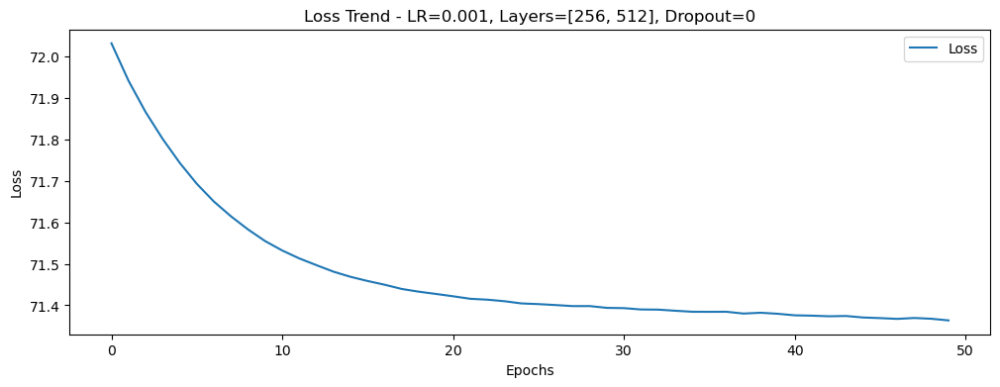

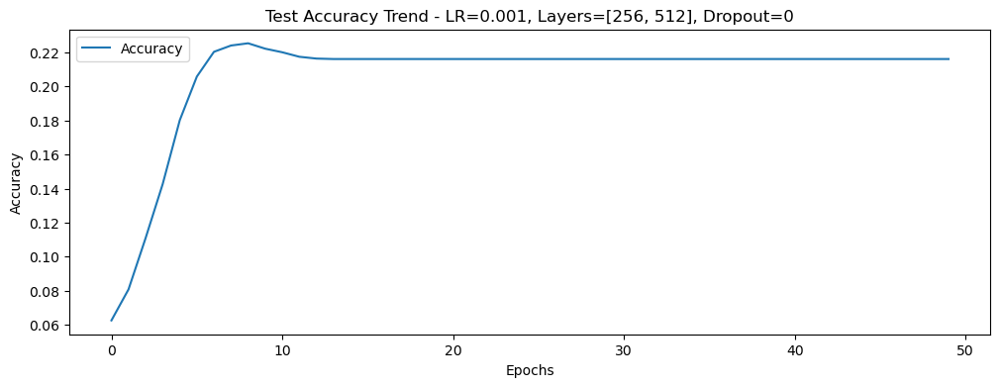

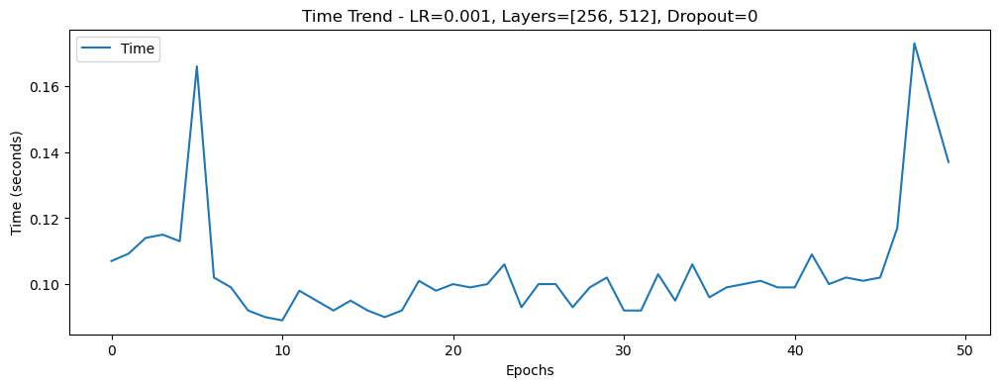

Training with lr=0.001, layers=[256, 512], dropout=0.3
Epoch: 0, loss: 71.85549, train_acc: 10.08%, test_acc:11.83%, time_cost:0.176
Epoch: 1, loss: 71.76001, train_acc: 11.70%, test_acc:13.18%, time_cost:0.149
Epoch: 2, loss: 71.71149, train_acc: 12.80%, test_acc:15.19%, time_cost:0.115
Epoch: 3, loss: 71.66080, train_acc: 14.80%, test_acc:17.27%, time_cost:0.145
Epoch: 4, loss: 71.61266, train_acc: 16.17%, test_acc:19.04%, time_cost:0.163
Epoch: 5, loss: 71.56675, train_acc: 17.90%, test_acc:20.29%, time_cost:0.109
Epoch: 6, loss: 71.53567, train_acc: 19.18%, test_acc:21.02%, time_cost:0.138
Epoch: 7, loss: 71.50840, train_acc: 20.24%, test_acc:21.53%, time_cost:0.129
Epoch: 8, loss: 71.47915, train_acc: 21.02%, test_acc:21.58%, time_cost:0.130
Epoch: 9, loss: 71.46562, train_acc: 21.77%, test_acc:21.58%, time_cost:0.133
Epoch: 10, loss: 71.44429, train_acc: 22.02%, test_acc:21.61%, time_cost:0.168
Epoch: 11, loss: 71.43596, train_acc: 22.32%, test_acc:21.61%, time_cost:0.134
Epoch: 

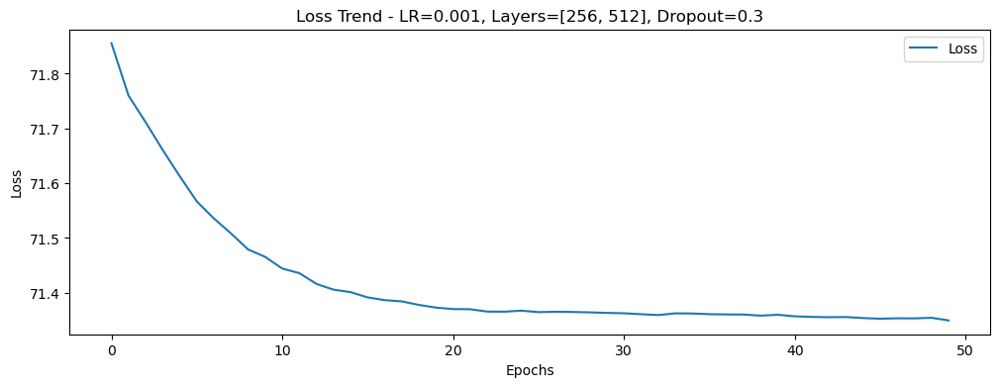

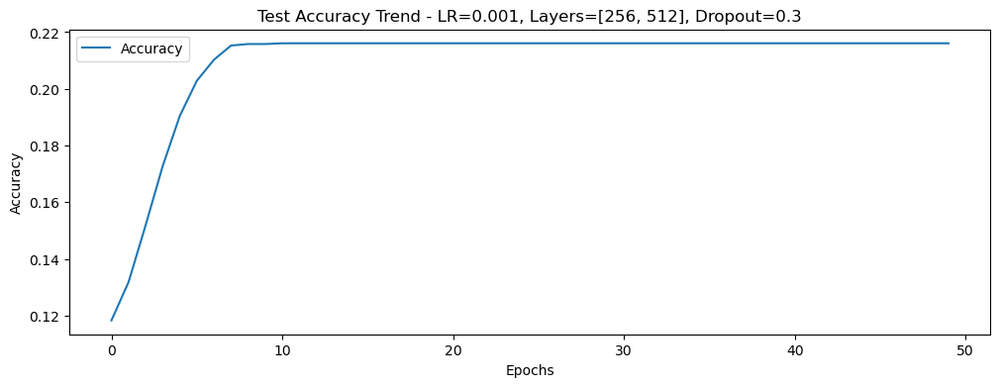

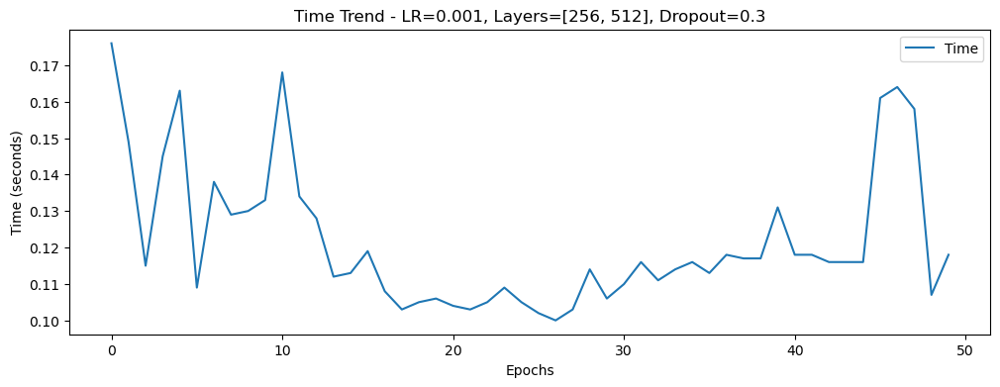

Training with lr=0.001, layers=[256, 512], dropout=0.6
Epoch: 0, loss: 71.93081, train_acc: 9.03%, test_acc:6.39%, time_cost:0.152
Epoch: 1, loss: 71.85087, train_acc: 9.26%, test_acc:6.55%, time_cost:0.139
Epoch: 2, loss: 71.78846, train_acc: 9.67%, test_acc:7.03%, time_cost:0.143
Epoch: 3, loss: 71.74096, train_acc: 10.54%, test_acc:8.08%, time_cost:0.141
Epoch: 4, loss: 71.66502, train_acc: 11.08%, test_acc:9.98%, time_cost:0.111
Epoch: 5, loss: 71.61143, train_acc: 12.86%, test_acc:13.47%, time_cost:0.320
Epoch: 6, loss: 71.58930, train_acc: 13.42%, test_acc:16.64%, time_cost:0.129
Epoch: 7, loss: 71.55425, train_acc: 14.99%, test_acc:19.62%, time_cost:0.117
Epoch: 8, loss: 71.52005, train_acc: 16.23%, test_acc:21.18%, time_cost:0.123
Epoch: 9, loss: 71.50138, train_acc: 17.73%, test_acc:21.55%, time_cost:0.133
Epoch: 10, loss: 71.49651, train_acc: 18.39%, test_acc:21.63%, time_cost:0.098
Epoch: 11, loss: 71.47356, train_acc: 19.74%, test_acc:21.61%, time_cost:0.102
Epoch: 12, loss

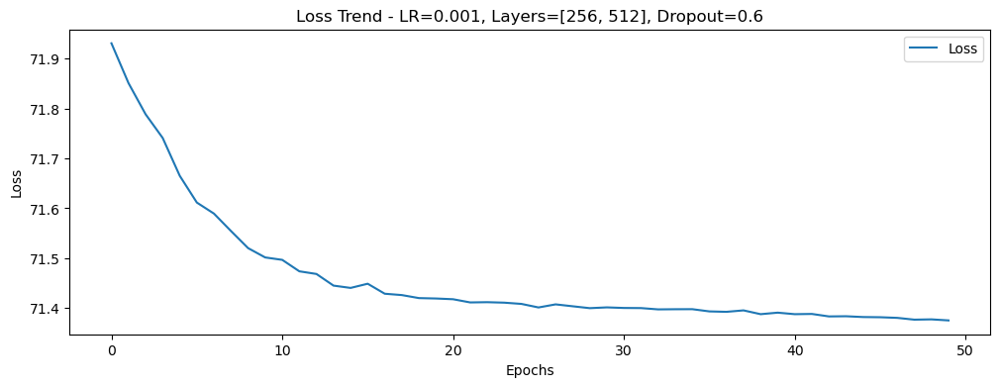

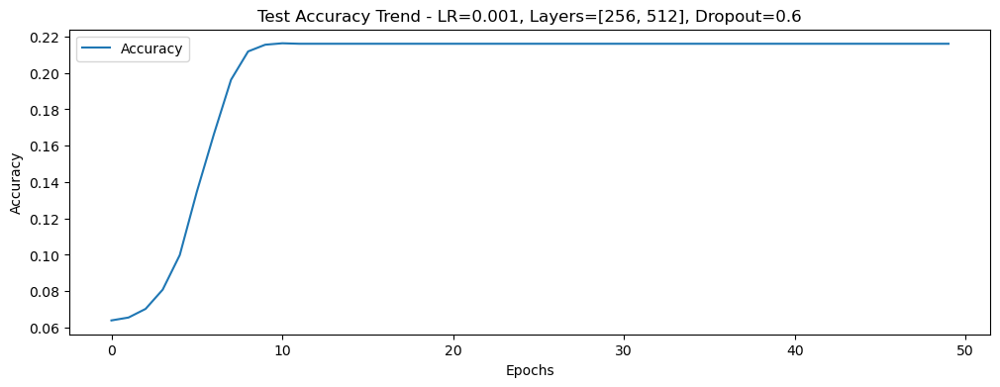

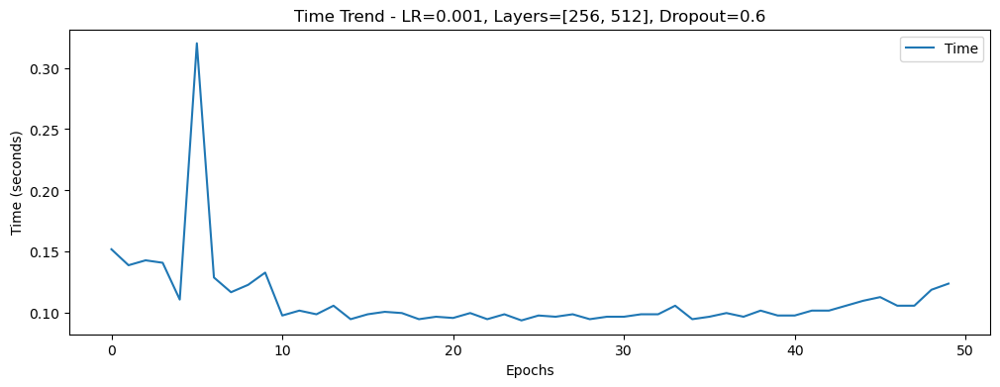

In [ ]:
import matplotlib.pyplot as plt

# Assuming param_grid is defined as suggested above
param_grid = [
    {'learning_rate': [0.1, 0.01, 0.001], 
     'layers': [[256], [128, 256], [256, 512]],
     'dropout': [0, 0.3, 0.6]}
]

# Initialize empty results list
results = []

# Loop over each dictionary in param_grid
for params in param_grid:
    for lr in params['learning_rate']:
        for layers in params['layers']:
            for dropout in params['dropout']:
                print(f"Training with lr={lr}, layers={layers}, dropout={dropout}")
                # Assume eval_mlp function returns the required lists
                model, loss_list, acc_list, test_acc_list, time_list = eval_mlp(
                    input_dim, output_dim, layers, dropout, nn.ReLU(), 50, lr, 0.95, 512)
                results.append({
                    'learning_rate': lr,
                    'layers': str(layers),
                    'dropout': dropout,
                    'accuracy': test_acc_list[-1],
                    'time': sum(time_list)
                })

                # Visualization for each parameter set
                plt.figure(figsize=(12, 4))
                plt.plot(loss_list, label='Loss')
                plt.title(f'Loss Trend - LR={lr}, Layers={str(layers)}, Dropout={dropout}')
                plt.xlabel('Epochs')
                plt.ylabel('Loss')
                plt.legend()
                plt.show()

                plt.figure(figsize=(12, 4))
                plt.plot(test_acc_list, label='Accuracy')
                plt.title(f'Test Accuracy Trend - LR={lr}, Layers={str(layers)}, Dropout={dropout}')
                plt.xlabel('Epochs')
                plt.ylabel('Accuracy')
                plt.legend()
                plt.show()

                plt.figure(figsize=(12, 4))
                plt.plot(time_list, label='Time')
                plt.title(f'Time Trend - LR={lr}, Layers={str(layers)}, Dropout={dropout}')
                plt.xlabel('Epochs')
                plt.ylabel('Time (seconds)')
                plt.legend()
                plt.show()


Evaluating: LR=0.001, Batch=256, Decay=0.9
Epoch: 0, loss: 95.60167, train_acc: 51.43%, test_acc:69.23%, time_cost:0.587
Epoch: 1, loss: 64.75797, train_acc: 72.88%, test_acc:77.10%, time_cost:0.402
Epoch: 2, loss: 54.88240, train_acc: 79.19%, test_acc:80.22%, time_cost:0.407
Epoch: 3, loss: 49.56476, train_acc: 81.51%, test_acc:81.85%, time_cost:0.397
Epoch: 4, loss: 46.48663, train_acc: 82.62%, test_acc:82.59%, time_cost:0.402
Epoch: 5, loss: 44.59983, train_acc: 83.35%, test_acc:83.52%, time_cost:0.410
Epoch: 6, loss: 43.39689, train_acc: 84.08%, test_acc:83.94%, time_cost:0.400
Epoch: 7, loss: 42.59968, train_acc: 84.12%, test_acc:84.39%, time_cost:0.392
Epoch: 8, loss: 42.10896, train_acc: 84.87%, test_acc:85.21%, time_cost:0.394
Epoch: 9, loss: 41.78419, train_acc: 85.02%, test_acc:85.26%, time_cost:0.398
Epoch: 10, loss: 41.46331, train_acc: 85.19%, test_acc:85.18%, time_cost:0.400
Epoch: 11, loss: 41.50486, train_acc: 85.49%, test_acc:85.68%, time_cost:0.415
Epoch: 12, loss: 41

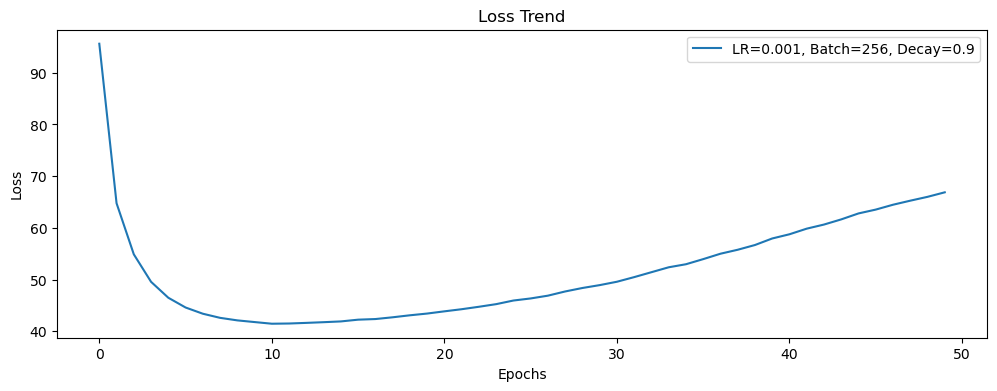

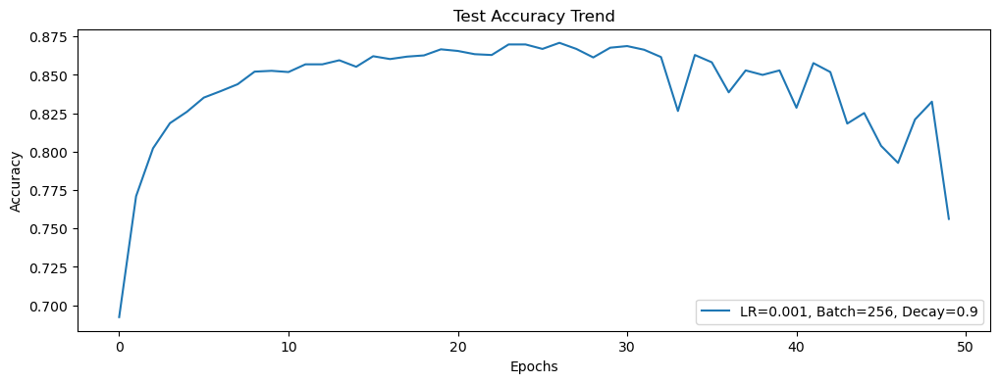

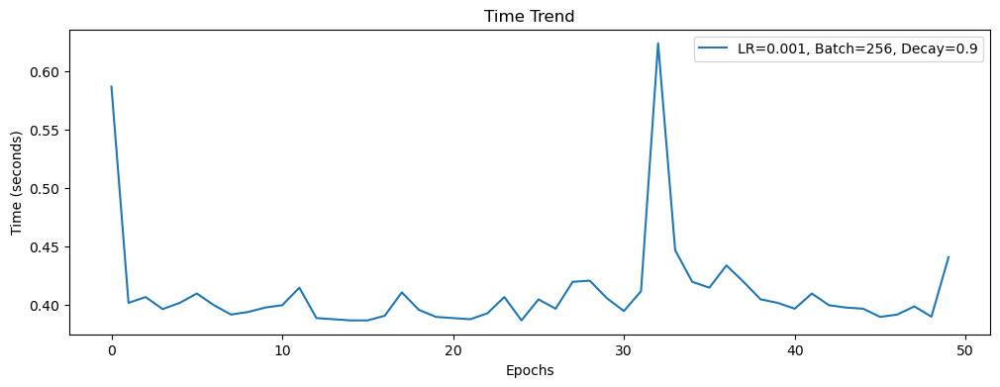

Evaluating: LR=0.001, Batch=256, Decay=0.95
Epoch: 0, loss: 99.18087, train_acc: 49.50%, test_acc:64.92%, time_cost:0.393
Epoch: 1, loss: 66.08406, train_acc: 72.23%, test_acc:73.69%, time_cost:0.398
Epoch: 2, loss: 55.77571, train_acc: 78.05%, test_acc:79.00%, time_cost:0.417
Epoch: 3, loss: 50.35939, train_acc: 80.50%, test_acc:81.22%, time_cost:0.397
Epoch: 4, loss: 47.51989, train_acc: 81.69%, test_acc:81.96%, time_cost:0.411
Epoch: 5, loss: 45.36238, train_acc: 82.68%, test_acc:82.30%, time_cost:0.391
Epoch: 6, loss: 44.26488, train_acc: 83.23%, test_acc:83.39%, time_cost:0.386
Epoch: 7, loss: 43.32436, train_acc: 83.79%, test_acc:84.02%, time_cost:0.390
Epoch: 8, loss: 42.83063, train_acc: 84.36%, test_acc:84.28%, time_cost:0.391
Epoch: 9, loss: 42.55590, train_acc: 84.50%, test_acc:84.81%, time_cost:0.394
Epoch: 10, loss: 42.59688, train_acc: 84.69%, test_acc:85.16%, time_cost:0.398
Epoch: 11, loss: 42.49096, train_acc: 85.12%, test_acc:85.18%, time_cost:0.391
Epoch: 12, loss: 4

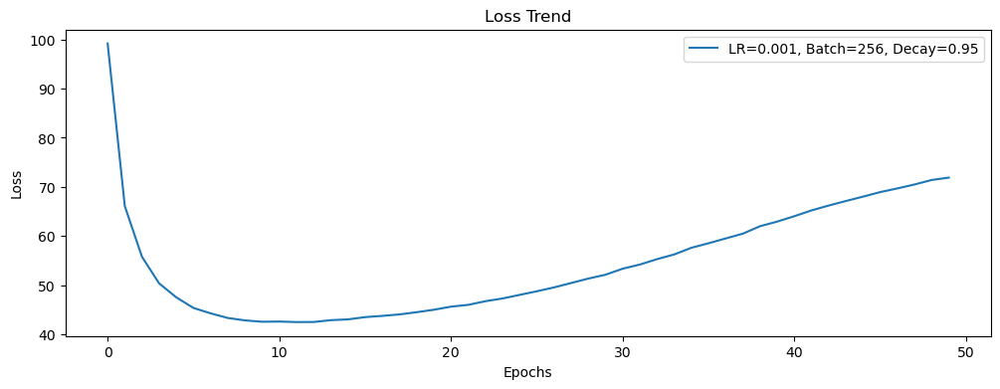

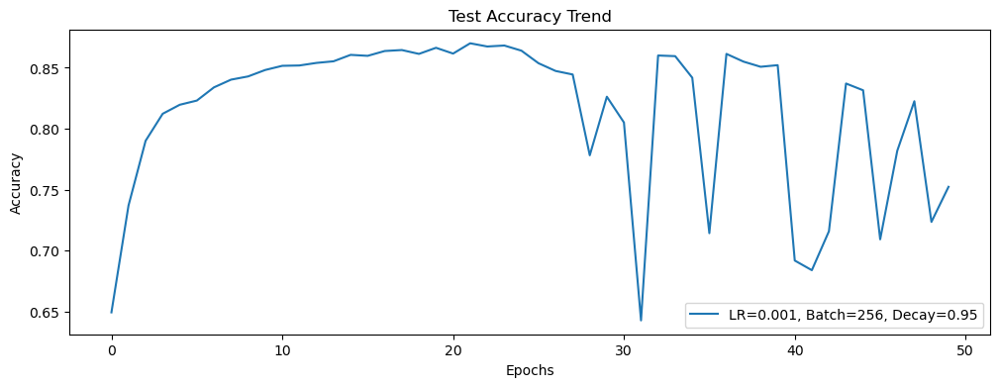

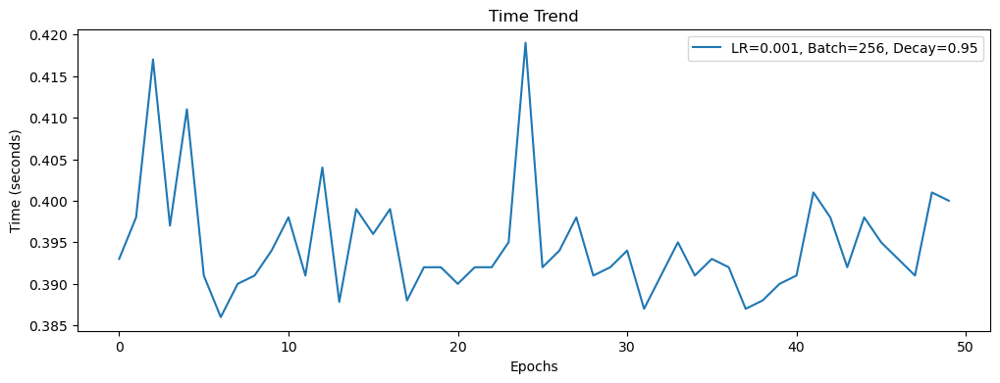

Evaluating: LR=0.001, Batch=256, Decay=0.99
Epoch: 0, loss: 95.45189, train_acc: 52.77%, test_acc:66.88%, time_cost:0.410
Epoch: 1, loss: 64.53475, train_acc: 74.11%, test_acc:76.91%, time_cost:0.396
Epoch: 2, loss: 55.00835, train_acc: 79.30%, test_acc:80.24%, time_cost:0.400
Epoch: 3, loss: 50.10129, train_acc: 81.44%, test_acc:81.70%, time_cost:0.405
Epoch: 4, loss: 47.21950, train_acc: 82.48%, test_acc:82.57%, time_cost:0.400
Epoch: 5, loss: 45.31624, train_acc: 83.22%, test_acc:83.31%, time_cost:0.392
Epoch: 6, loss: 44.11164, train_acc: 83.79%, test_acc:83.76%, time_cost:0.399
Epoch: 7, loss: 43.58262, train_acc: 84.20%, test_acc:84.63%, time_cost:0.417
Epoch: 8, loss: 43.13165, train_acc: 84.51%, test_acc:84.65%, time_cost:0.391
Epoch: 9, loss: 42.80369, train_acc: 84.81%, test_acc:84.84%, time_cost:0.605
Epoch: 10, loss: 42.84053, train_acc: 84.99%, test_acc:85.34%, time_cost:0.383
Epoch: 11, loss: 43.04938, train_acc: 85.35%, test_acc:85.39%, time_cost:0.386
Epoch: 12, loss: 4

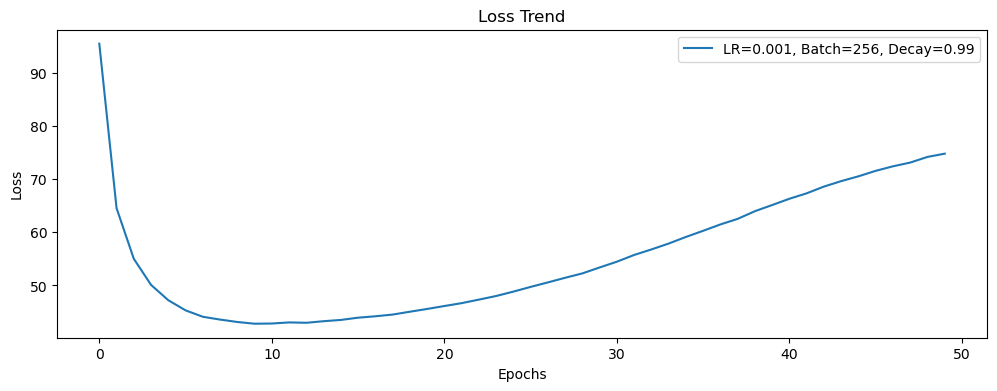

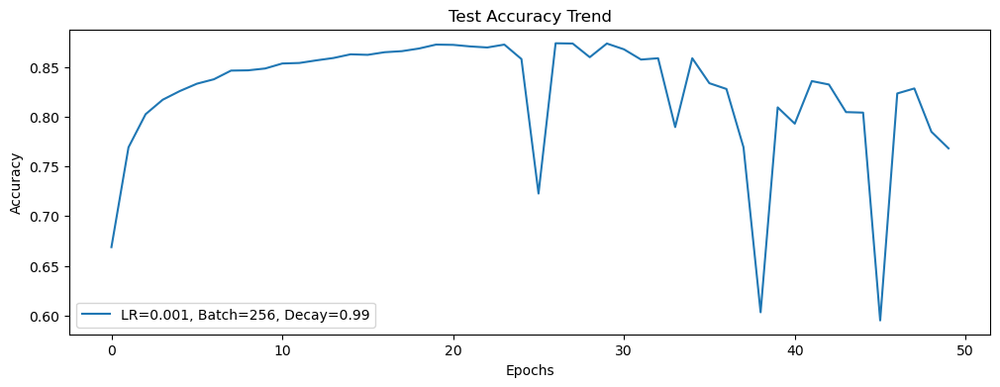

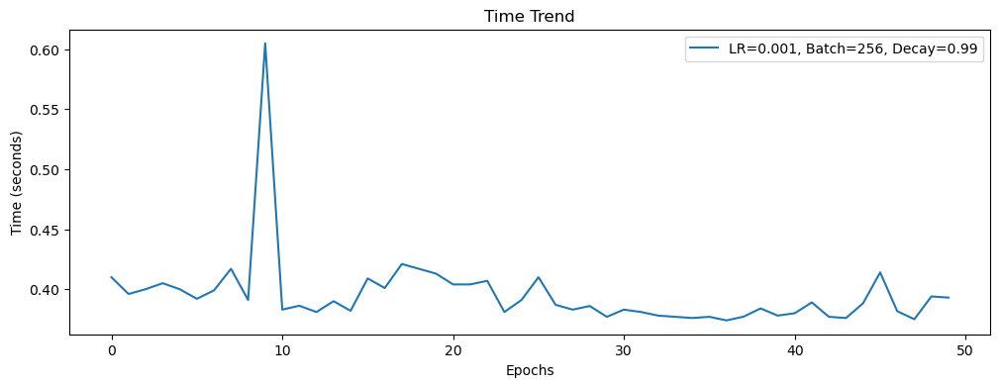

Evaluating: LR=0.001, Batch=512, Decay=0.9
Epoch: 0, loss: 54.17627, train_acc: 39.91%, test_acc:42.45%, time_cost:0.460
Epoch: 1, loss: 39.18274, train_acc: 64.20%, test_acc:71.50%, time_cost:0.435
Epoch: 2, loss: 33.37933, train_acc: 73.81%, test_acc:76.47%, time_cost:0.436
Epoch: 3, loss: 30.07944, train_acc: 77.57%, test_acc:78.00%, time_cost:0.437
Epoch: 4, loss: 27.94531, train_acc: 79.47%, test_acc:79.85%, time_cost:0.427
Epoch: 5, loss: 26.46060, train_acc: 80.43%, test_acc:80.80%, time_cost:0.430
Epoch: 6, loss: 25.31301, train_acc: 81.26%, test_acc:81.35%, time_cost:0.426
Epoch: 7, loss: 24.44735, train_acc: 81.72%, test_acc:81.88%, time_cost:0.430
Epoch: 8, loss: 23.81147, train_acc: 82.29%, test_acc:82.25%, time_cost:0.452
Epoch: 9, loss: 23.27829, train_acc: 82.62%, test_acc:82.70%, time_cost:0.443
Epoch: 10, loss: 22.84490, train_acc: 82.90%, test_acc:83.04%, time_cost:0.440
Epoch: 11, loss: 22.45347, train_acc: 83.17%, test_acc:83.04%, time_cost:0.439
Epoch: 12, loss: 22

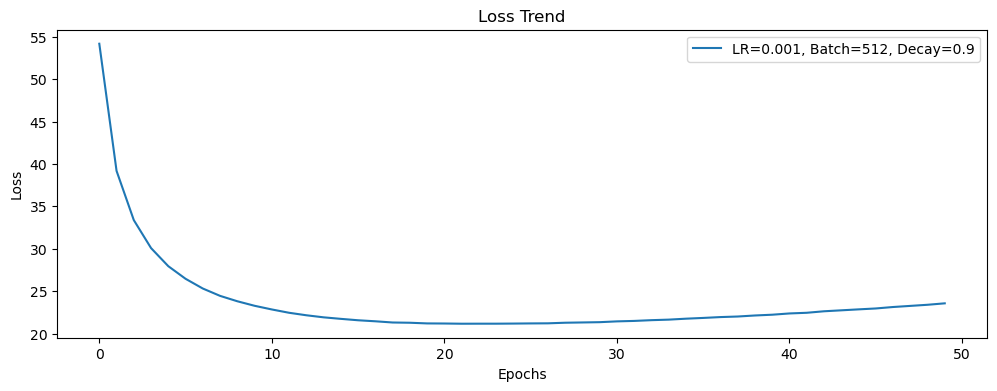

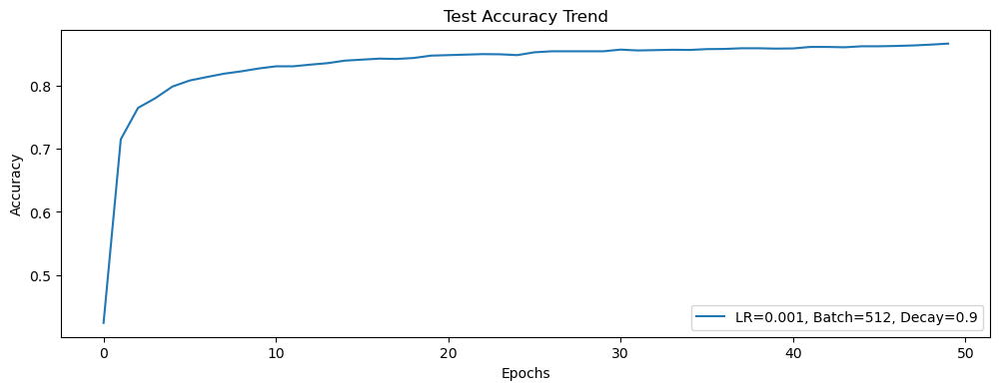

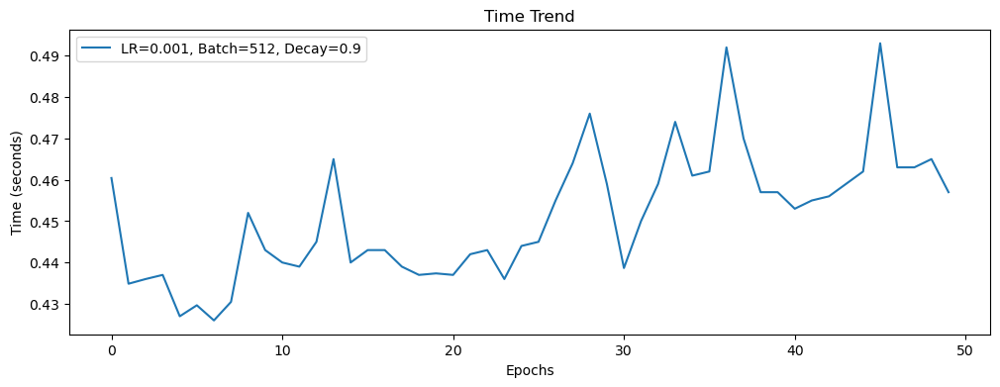

Evaluating: LR=0.001, Batch=512, Decay=0.95
Epoch: 0, loss: 54.32000, train_acc: 41.23%, test_acc:17.25%, time_cost:0.460
Epoch: 1, loss: 39.59226, train_acc: 63.70%, test_acc:69.10%, time_cost:0.463
Epoch: 2, loss: 33.82559, train_acc: 72.32%, test_acc:74.46%, time_cost:0.457
Epoch: 3, loss: 30.50184, train_acc: 76.23%, test_acc:76.86%, time_cost:0.460
Epoch: 4, loss: 28.41226, train_acc: 78.21%, test_acc:78.42%, time_cost:0.463
Epoch: 5, loss: 26.85478, train_acc: 79.51%, test_acc:80.24%, time_cost:0.459
Epoch: 6, loss: 25.76888, train_acc: 80.48%, test_acc:80.32%, time_cost:0.456
Epoch: 7, loss: 24.92604, train_acc: 81.13%, test_acc:81.51%, time_cost:0.462
Epoch: 8, loss: 24.24388, train_acc: 81.66%, test_acc:81.70%, time_cost:0.473
Epoch: 9, loss: 23.76792, train_acc: 82.04%, test_acc:82.12%, time_cost:0.457
Epoch: 10, loss: 23.32596, train_acc: 82.33%, test_acc:82.38%, time_cost:0.459
Epoch: 11, loss: 22.97902, train_acc: 82.55%, test_acc:82.83%, time_cost:0.459
Epoch: 12, loss: 2

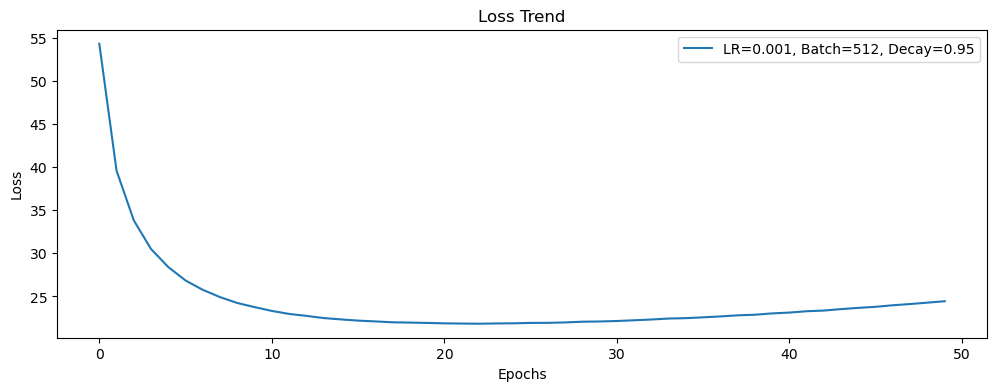

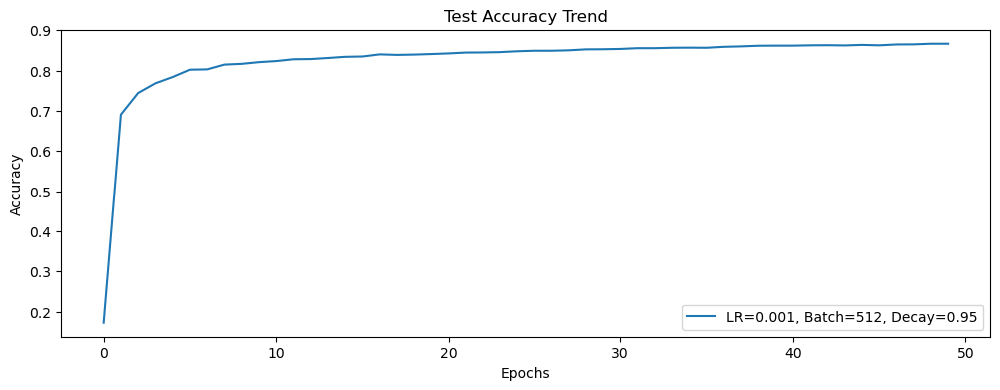

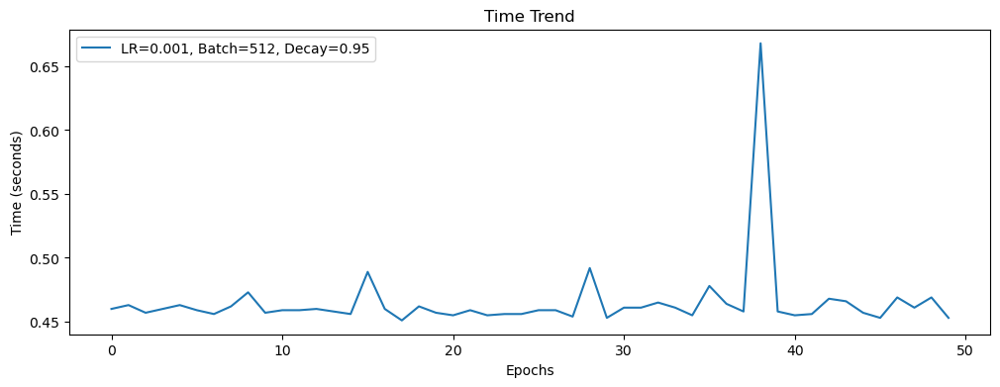

Evaluating: LR=0.001, Batch=512, Decay=0.99
Epoch: 0, loss: 55.54742, train_acc: 39.38%, test_acc:10.22%, time_cost:0.474
Epoch: 1, loss: 40.60288, train_acc: 61.47%, test_acc:67.09%, time_cost:0.463
Epoch: 2, loss: 34.57573, train_acc: 71.04%, test_acc:73.35%, time_cost:0.462
Epoch: 3, loss: 31.12397, train_acc: 75.35%, test_acc:75.30%, time_cost:0.462
Epoch: 4, loss: 28.78045, train_acc: 77.68%, test_acc:78.45%, time_cost:0.460
Epoch: 5, loss: 27.09858, train_acc: 79.43%, test_acc:79.56%, time_cost:0.457
Epoch: 6, loss: 25.88488, train_acc: 80.55%, test_acc:80.69%, time_cost:0.463
Epoch: 7, loss: 24.98448, train_acc: 81.42%, test_acc:81.19%, time_cost:0.459
Epoch: 8, loss: 24.22775, train_acc: 81.98%, test_acc:82.57%, time_cost:0.467
Epoch: 9, loss: 23.65796, train_acc: 82.58%, test_acc:82.83%, time_cost:0.460
Epoch: 10, loss: 23.13836, train_acc: 82.84%, test_acc:83.15%, time_cost:0.460
Epoch: 11, loss: 22.77431, train_acc: 83.11%, test_acc:83.57%, time_cost:0.458
Epoch: 12, loss: 2

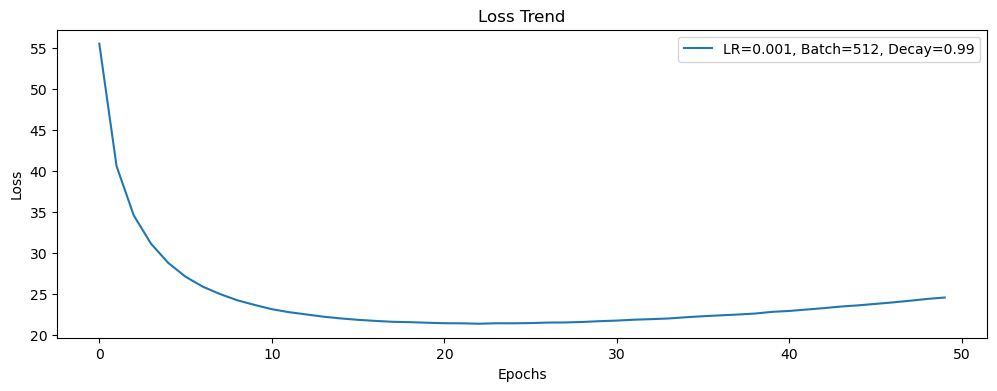

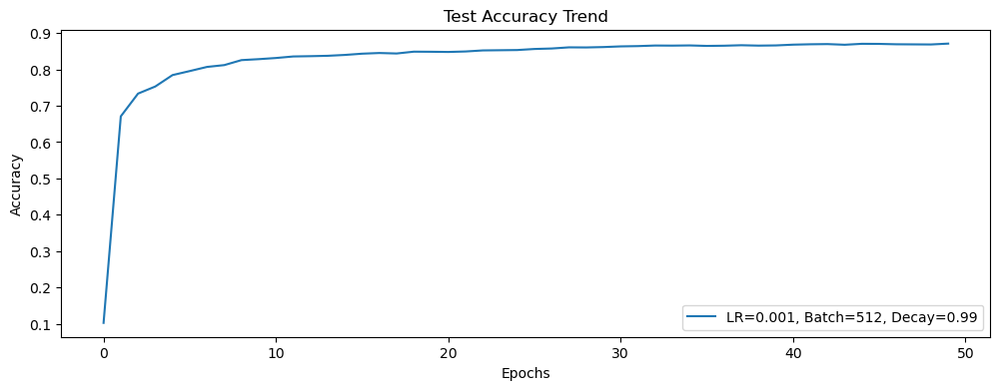

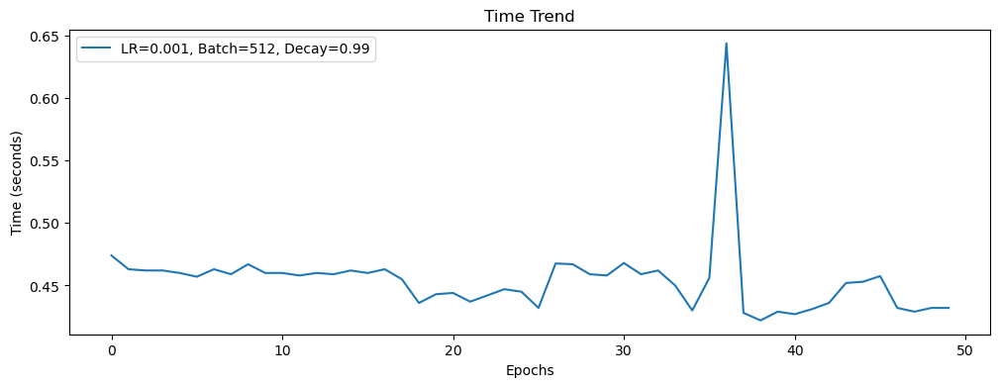

Evaluating: LR=0.001, Batch=1024, Decay=0.9
Epoch: 0, loss: 31.06590, train_acc: 29.62%, test_acc:22.21%, time_cost:0.477
Epoch: 1, loss: 24.64914, train_acc: 49.43%, test_acc:21.90%, time_cost:0.473
Epoch: 2, loss: 21.33438, train_acc: 58.68%, test_acc:54.01%, time_cost:0.480
Epoch: 3, loss: 19.24566, train_acc: 65.62%, test_acc:67.19%, time_cost:0.479
Epoch: 4, loss: 17.78629, train_acc: 69.83%, test_acc:71.58%, time_cost:0.482
Epoch: 5, loss: 16.65968, train_acc: 72.96%, test_acc:74.30%, time_cost:0.478
Epoch: 6, loss: 15.78588, train_acc: 75.20%, test_acc:75.46%, time_cost:0.486
Epoch: 7, loss: 15.07300, train_acc: 76.65%, test_acc:77.13%, time_cost:0.490
Epoch: 8, loss: 14.47596, train_acc: 77.99%, test_acc:77.95%, time_cost:0.486
Epoch: 9, loss: 13.98203, train_acc: 79.03%, test_acc:79.16%, time_cost:0.484
Epoch: 10, loss: 13.53537, train_acc: 80.02%, test_acc:79.93%, time_cost:0.521
Epoch: 11, loss: 13.15496, train_acc: 80.68%, test_acc:80.67%, time_cost:0.521
Epoch: 12, loss: 1

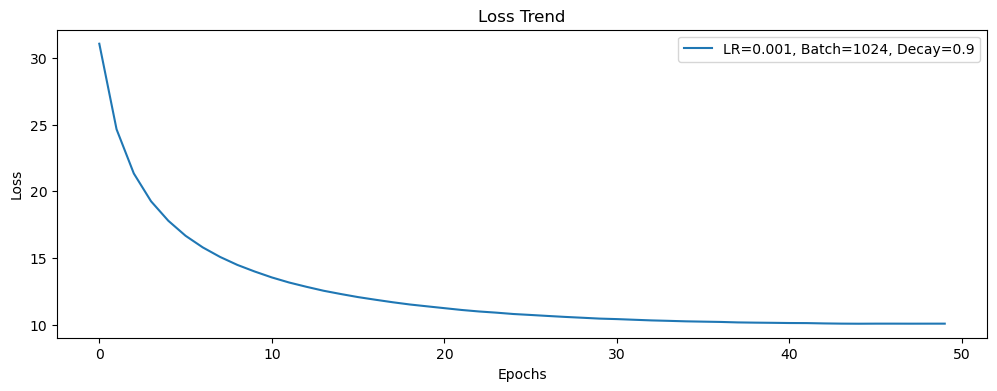

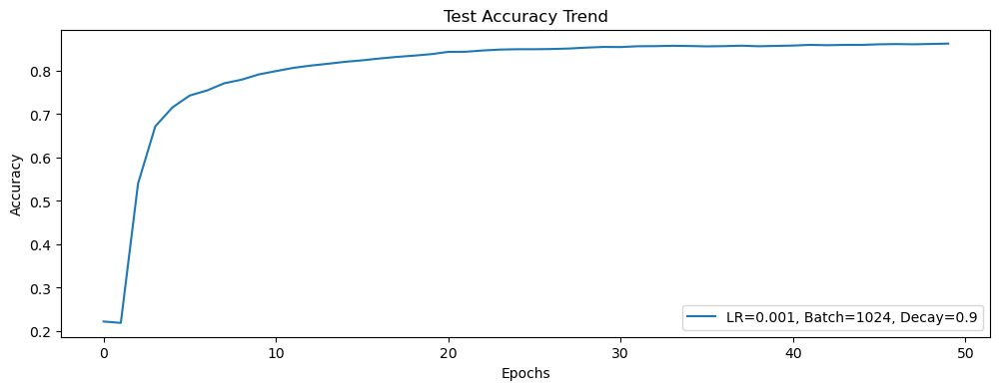

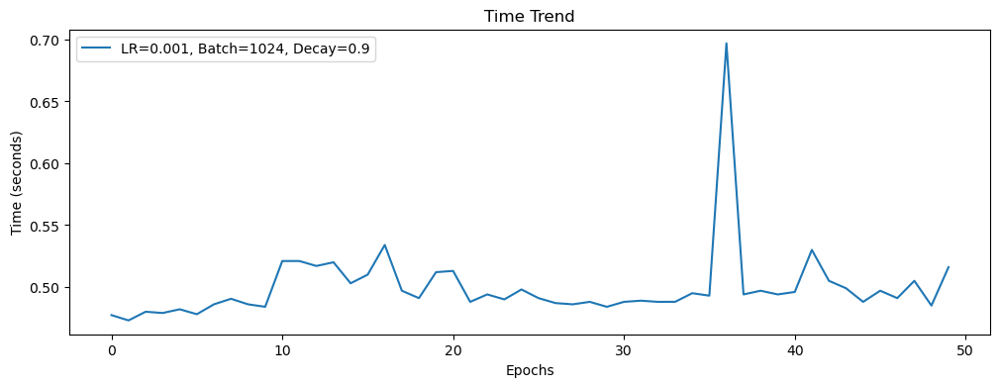

Evaluating: LR=0.001, Batch=1024, Decay=0.95
Epoch: 0, loss: 30.61820, train_acc: 28.83%, test_acc:15.06%, time_cost:0.493
Epoch: 1, loss: 23.98624, train_acc: 50.75%, test_acc:18.41%, time_cost:0.489
Epoch: 2, loss: 20.69915, train_acc: 61.40%, test_acc:63.31%, time_cost:0.483
Epoch: 3, loss: 18.64831, train_acc: 67.65%, test_acc:69.70%, time_cost:0.493
Epoch: 4, loss: 17.20673, train_acc: 71.54%, test_acc:72.98%, time_cost:0.482
Epoch: 5, loss: 16.09907, train_acc: 74.34%, test_acc:74.93%, time_cost:0.492
Epoch: 6, loss: 15.24016, train_acc: 76.21%, test_acc:77.05%, time_cost:0.504
Epoch: 7, loss: 14.56044, train_acc: 77.63%, test_acc:78.31%, time_cost:0.693
Epoch: 8, loss: 13.96754, train_acc: 78.98%, test_acc:78.63%, time_cost:0.489
Epoch: 9, loss: 13.49888, train_acc: 79.75%, test_acc:79.64%, time_cost:0.494
Epoch: 10, loss: 13.07942, train_acc: 80.58%, test_acc:80.51%, time_cost:0.487
Epoch: 11, loss: 12.73306, train_acc: 81.10%, test_acc:81.01%, time_cost:0.493
Epoch: 12, loss: 

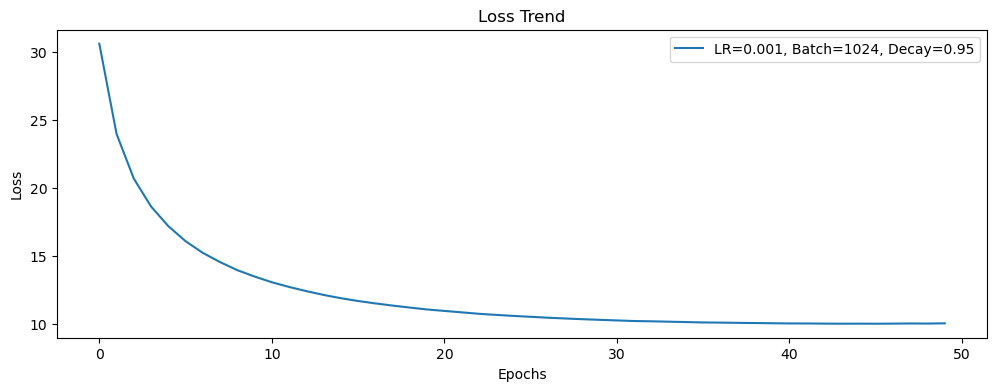

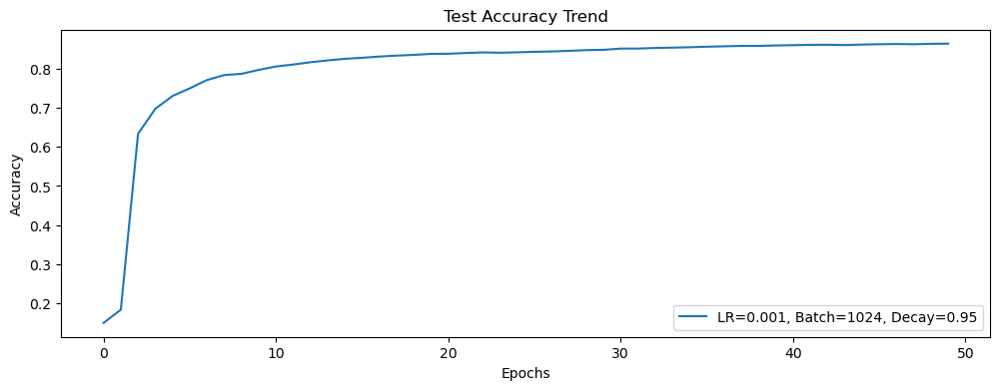

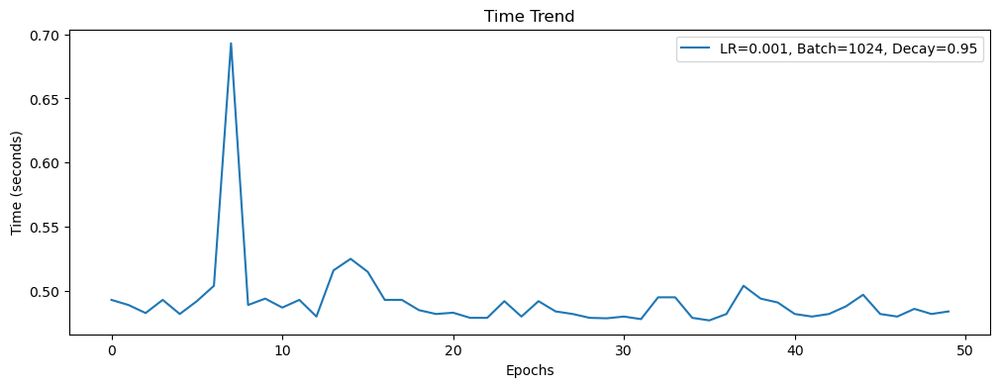

Evaluating: LR=0.001, Batch=1024, Decay=0.99
Epoch: 0, loss: 30.22848, train_acc: 34.37%, test_acc:12.04%, time_cost:0.516
Epoch: 1, loss: 24.37492, train_acc: 49.60%, test_acc:20.23%, time_cost:0.695
Epoch: 2, loss: 21.23374, train_acc: 58.11%, test_acc:62.04%, time_cost:0.479
Epoch: 3, loss: 19.16466, train_acc: 64.63%, test_acc:69.57%, time_cost:0.485
Epoch: 4, loss: 17.70876, train_acc: 69.67%, test_acc:72.19%, time_cost:0.481
Epoch: 5, loss: 16.59825, train_acc: 73.14%, test_acc:75.59%, time_cost:0.479
Epoch: 6, loss: 15.72969, train_acc: 75.62%, test_acc:76.60%, time_cost:0.480
Epoch: 7, loss: 15.04134, train_acc: 77.43%, test_acc:78.18%, time_cost:0.485
Epoch: 8, loss: 14.45989, train_acc: 78.69%, test_acc:79.03%, time_cost:0.494
Epoch: 9, loss: 13.98753, train_acc: 79.59%, test_acc:79.66%, time_cost:0.490
Epoch: 10, loss: 13.60216, train_acc: 80.32%, test_acc:80.53%, time_cost:0.494
Epoch: 11, loss: 13.24730, train_acc: 80.85%, test_acc:80.90%, time_cost:0.481
Epoch: 12, loss: 

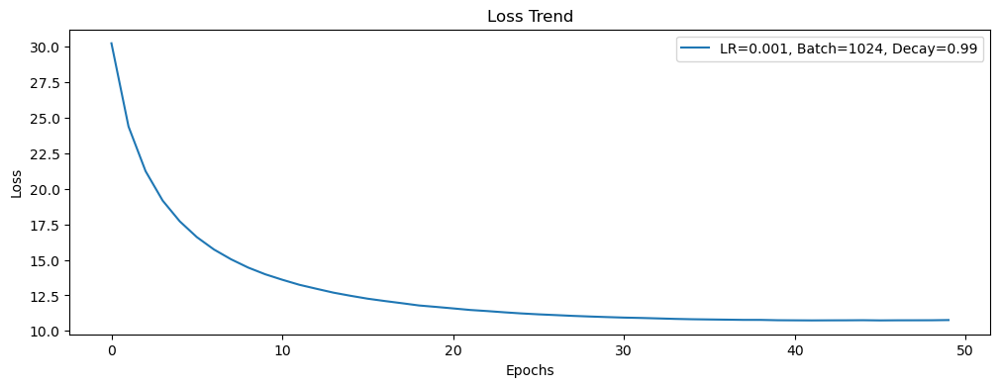

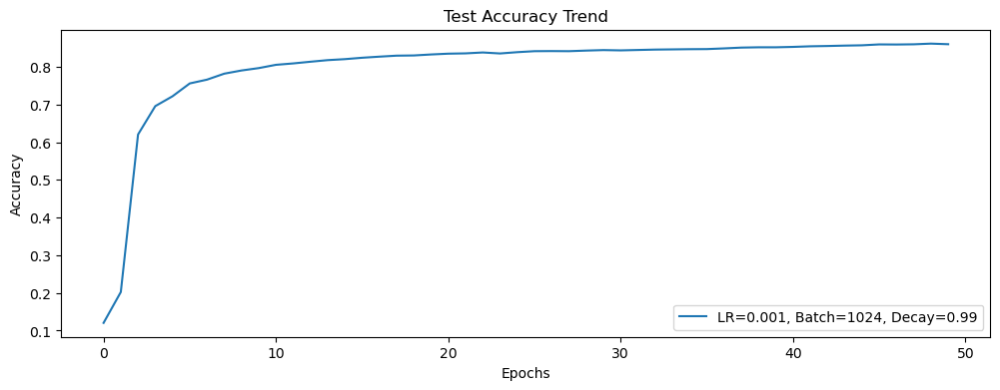

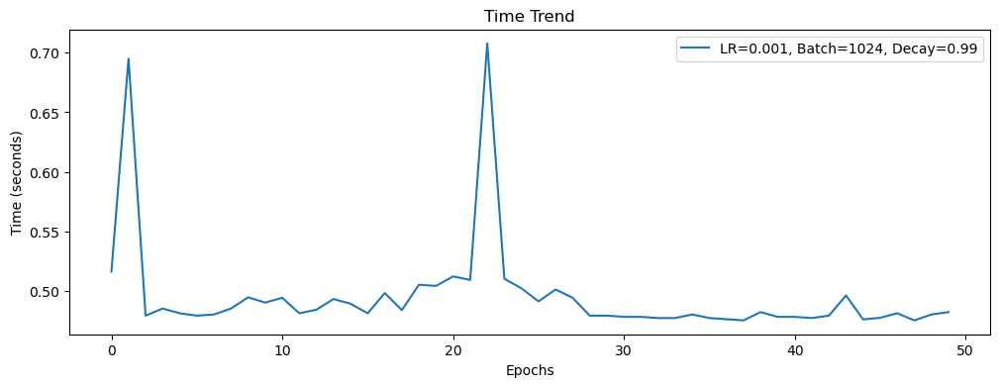

Evaluating: LR=0.01, Batch=256, Decay=0.9
Epoch: 0, loss: 80.67000, train_acc: 70.25%, test_acc:21.24%, time_cost:0.411
Epoch: 1, loss: 42.71228, train_acc: 84.54%, test_acc:63.00%, time_cost:0.379
Epoch: 2, loss: 48.11505, train_acc: 84.49%, test_acc:63.84%, time_cost:0.371
Epoch: 3, loss: 58.68327, train_acc: 82.88%, test_acc:59.77%, time_cost:0.380
Epoch: 4, loss: 68.96765, train_acc: 80.26%, test_acc:62.36%, time_cost:0.380
Epoch: 5, loss: 76.77813, train_acc: 76.79%, test_acc:60.33%, time_cost:0.381
Epoch: 6, loss: 80.51109, train_acc: 75.97%, test_acc:53.72%, time_cost:0.379
Epoch: 7, loss: 83.30657, train_acc: 73.10%, test_acc:70.18%, time_cost:0.379
Epoch: 8, loss: 84.28445, train_acc: 72.38%, test_acc:70.31%, time_cost:0.375
Epoch: 9, loss: 84.50898, train_acc: 71.67%, test_acc:76.10%, time_cost:0.382
Epoch: 10, loss: 85.03537, train_acc: 70.03%, test_acc:52.61%, time_cost:0.380
Epoch: 11, loss: 85.28750, train_acc: 69.62%, test_acc:48.28%, time_cost:0.382
Epoch: 12, loss: 85.

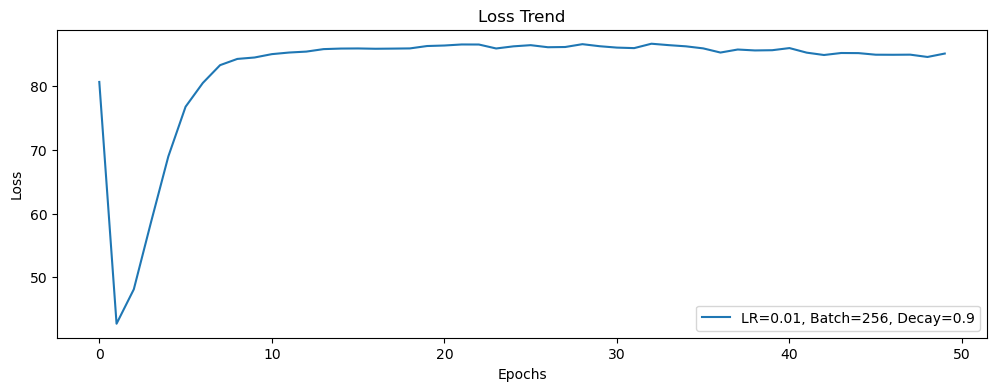

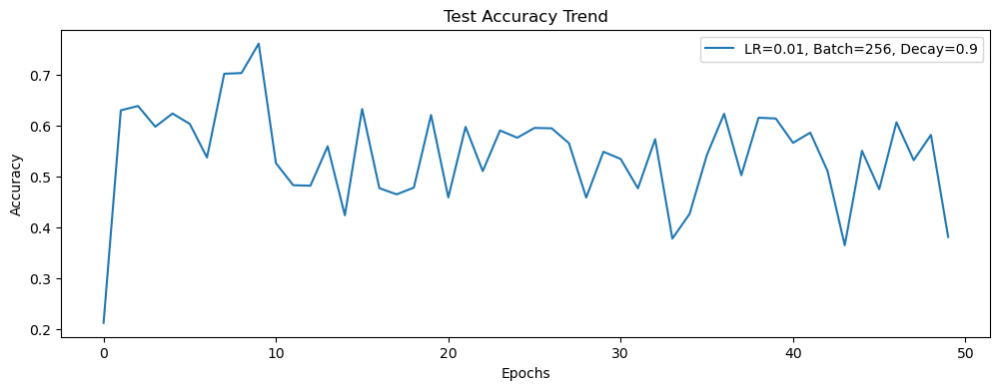

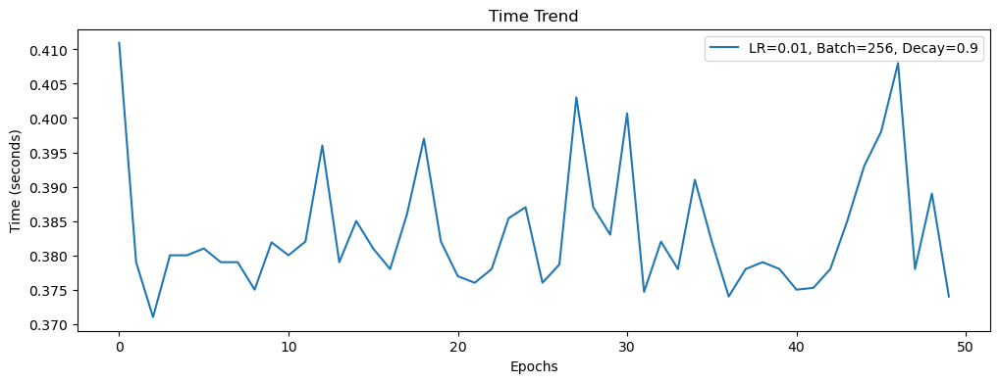

Evaluating: LR=0.01, Batch=256, Decay=0.95
Epoch: 0, loss: 75.77894, train_acc: 71.17%, test_acc:35.21%, time_cost:0.374
Epoch: 1, loss: 44.84439, train_acc: 83.34%, test_acc:55.12%, time_cost:0.377
Epoch: 2, loss: 52.70434, train_acc: 83.28%, test_acc:68.86%, time_cost:0.374
Epoch: 3, loss: 64.02232, train_acc: 81.59%, test_acc:69.04%, time_cost:0.378
Epoch: 4, loss: 74.67212, train_acc: 77.82%, test_acc:69.36%, time_cost:0.375
Epoch: 5, loss: 82.54086, train_acc: 73.66%, test_acc:63.97%, time_cost:0.393
Epoch: 6, loss: 87.12822, train_acc: 69.83%, test_acc:64.55%, time_cost:0.429
Epoch: 7, loss: 88.95451, train_acc: 66.56%, test_acc:63.79%, time_cost:0.391
Epoch: 8, loss: 90.56465, train_acc: 63.29%, test_acc:58.19%, time_cost:0.590
Epoch: 9, loss: 91.44738, train_acc: 62.49%, test_acc:62.44%, time_cost:0.385
Epoch: 10, loss: 91.55043, train_acc: 60.98%, test_acc:53.70%, time_cost:0.384
Epoch: 11, loss: 91.53228, train_acc: 58.92%, test_acc:41.71%, time_cost:0.385
Epoch: 12, loss: 91

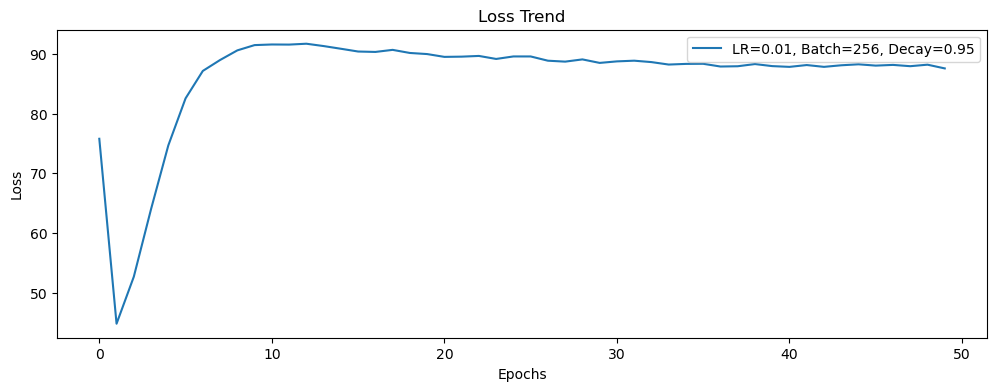

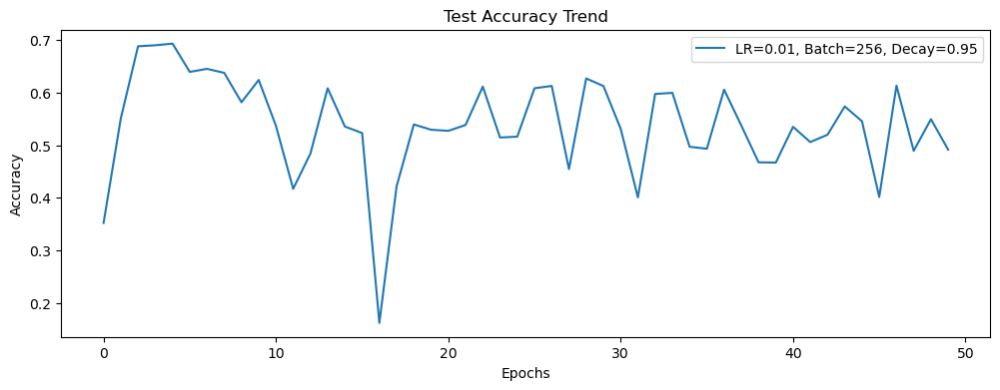

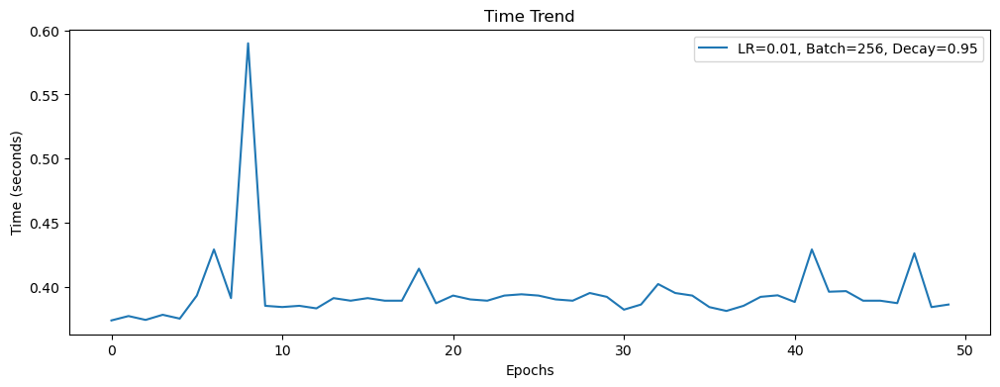

Evaluating: LR=0.01, Batch=256, Decay=0.99
Epoch: 0, loss: 76.42144, train_acc: 69.61%, test_acc:23.88%, time_cost:0.387
Epoch: 1, loss: 45.41476, train_acc: 84.65%, test_acc:41.97%, time_cost:0.389
Epoch: 2, loss: 53.83287, train_acc: 84.36%, test_acc:51.58%, time_cost:0.385
Epoch: 3, loss: 65.79200, train_acc: 81.84%, test_acc:66.32%, time_cost:0.388
Epoch: 4, loss: 77.59719, train_acc: 77.22%, test_acc:64.82%, time_cost:0.397
Epoch: 5, loss: 85.21426, train_acc: 72.47%, test_acc:65.24%, time_cost:0.382
Epoch: 6, loss: 89.02666, train_acc: 68.68%, test_acc:63.31%, time_cost:0.390
Epoch: 7, loss: 91.34472, train_acc: 65.51%, test_acc:66.38%, time_cost:0.394
Epoch: 8, loss: 92.96367, train_acc: 62.28%, test_acc:47.39%, time_cost:0.388
Epoch: 9, loss: 94.23704, train_acc: 58.88%, test_acc:45.22%, time_cost:0.404
Epoch: 10, loss: 94.64898, train_acc: 56.78%, test_acc:58.56%, time_cost:0.400
Epoch: 11, loss: 94.43629, train_acc: 56.70%, test_acc:45.30%, time_cost:0.398
Epoch: 12, loss: 94

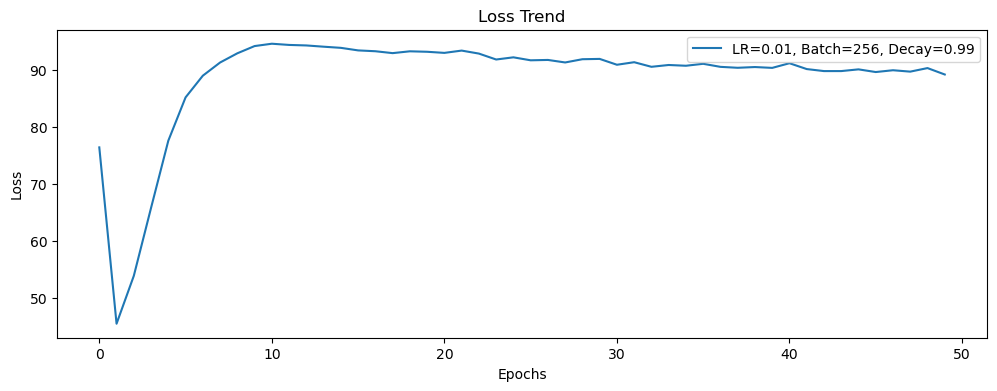

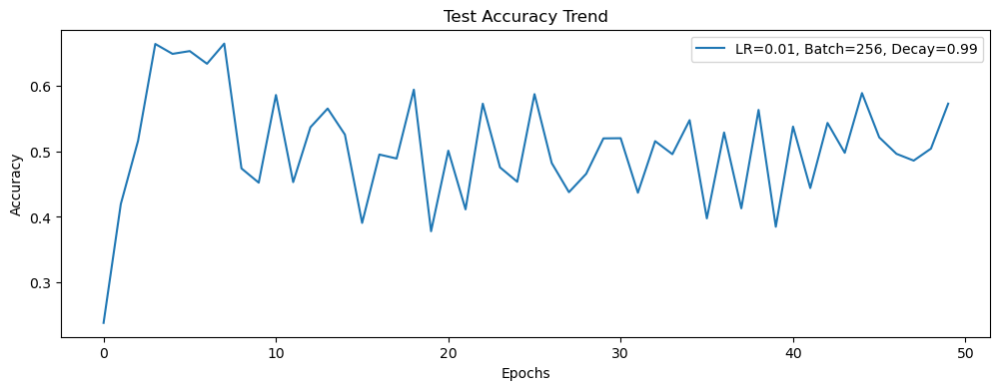

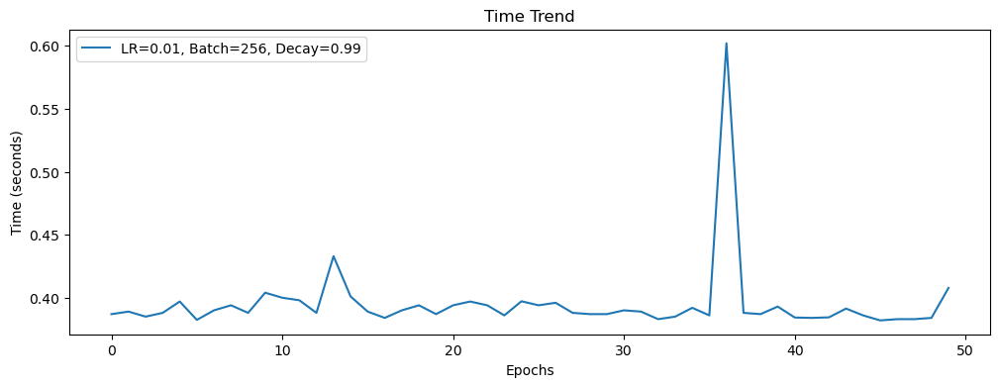

Evaluating: LR=0.01, Batch=512, Decay=0.9
Epoch: 0, loss: 54.54349, train_acc: 61.41%, test_acc:20.92%, time_cost:0.450
Epoch: 1, loss: 21.69107, train_acc: 82.18%, test_acc:33.17%, time_cost:0.437
Epoch: 2, loss: 21.22737, train_acc: 84.02%, test_acc:46.67%, time_cost:0.461
Epoch: 3, loss: 21.75375, train_acc: 84.85%, test_acc:57.21%, time_cost:0.438
Epoch: 4, loss: 23.21885, train_acc: 84.89%, test_acc:58.58%, time_cost:0.439
Epoch: 5, loss: 25.13088, train_acc: 84.99%, test_acc:65.24%, time_cost:0.452
Epoch: 6, loss: 27.99356, train_acc: 83.77%, test_acc:59.77%, time_cost:0.456
Epoch: 7, loss: 30.65067, train_acc: 82.88%, test_acc:54.09%, time_cost:0.457
Epoch: 8, loss: 33.50588, train_acc: 81.54%, test_acc:76.91%, time_cost:0.438
Epoch: 9, loss: 36.27200, train_acc: 79.51%, test_acc:61.70%, time_cost:0.470
Epoch: 10, loss: 37.74183, train_acc: 78.89%, test_acc:69.81%, time_cost:0.463
Epoch: 11, loss: 39.24506, train_acc: 76.75%, test_acc:78.66%, time_cost:0.463
Epoch: 12, loss: 40.

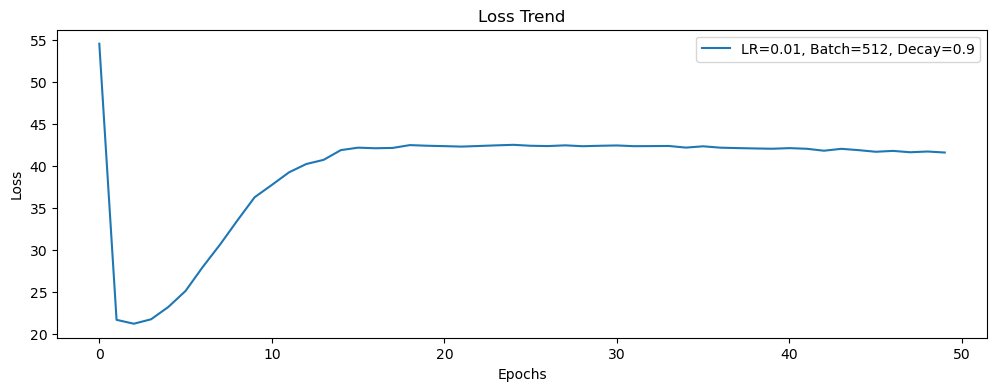

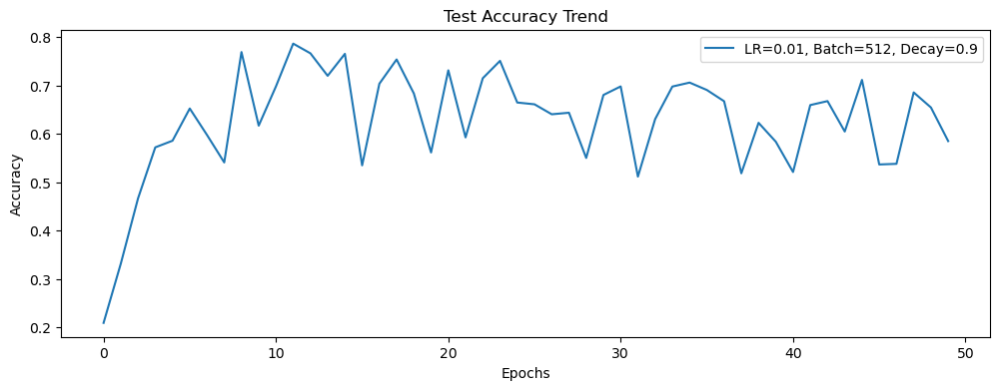

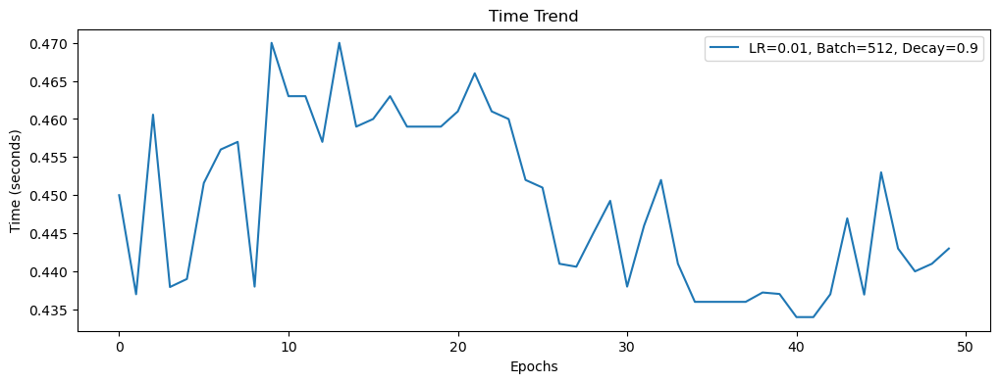

Evaluating: LR=0.01, Batch=512, Decay=0.95
Epoch: 0, loss: 68.09265, train_acc: 57.77%, test_acc:14.90%, time_cost:0.455
Epoch: 1, loss: 22.62054, train_acc: 82.06%, test_acc:35.18%, time_cost:0.461
Epoch: 2, loss: 22.37128, train_acc: 83.93%, test_acc:59.75%, time_cost:0.479
Epoch: 3, loss: 23.16263, train_acc: 84.68%, test_acc:59.19%, time_cost:0.438
Epoch: 4, loss: 24.51947, train_acc: 85.23%, test_acc:52.51%, time_cost:0.451
Epoch: 5, loss: 26.92504, train_acc: 84.86%, test_acc:70.79%, time_cost:0.465
Epoch: 6, loss: 29.98806, train_acc: 83.50%, test_acc:72.79%, time_cost:0.447
Epoch: 7, loss: 32.59056, train_acc: 82.68%, test_acc:76.55%, time_cost:0.439
Epoch: 8, loss: 35.63605, train_acc: 80.51%, test_acc:73.30%, time_cost:0.431
Epoch: 9, loss: 38.03943, train_acc: 78.36%, test_acc:57.40%, time_cost:0.431
Epoch: 10, loss: 39.53893, train_acc: 76.81%, test_acc:76.44%, time_cost:0.435
Epoch: 11, loss: 41.20754, train_acc: 74.61%, test_acc:73.56%, time_cost:0.428
Epoch: 12, loss: 41

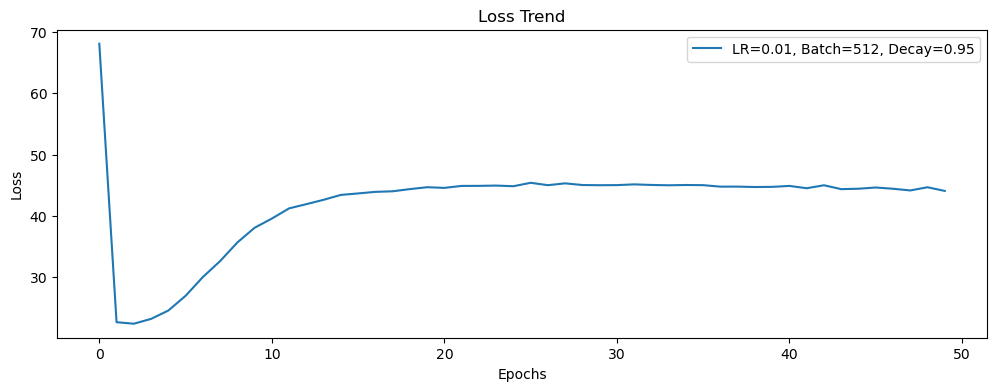

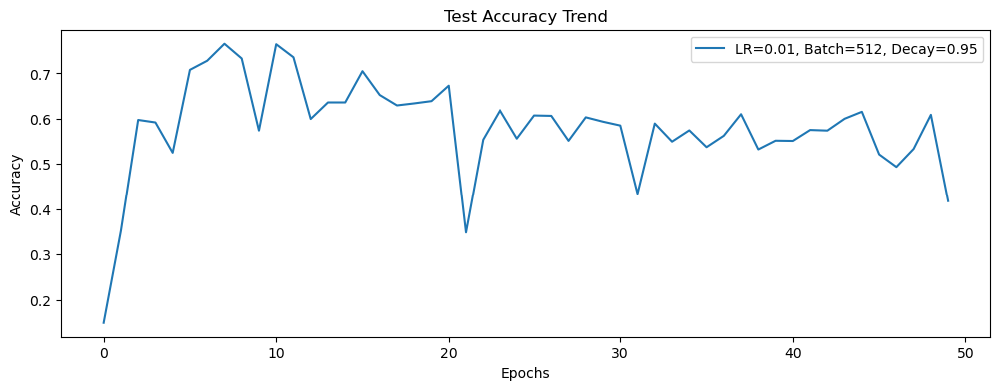

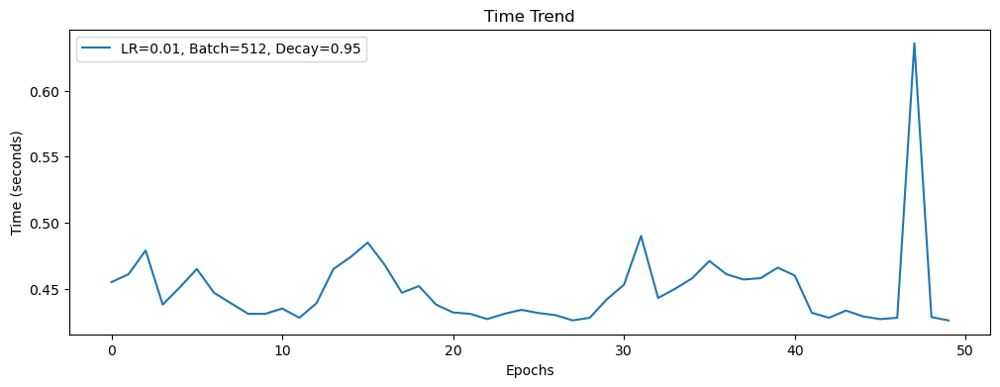

Evaluating: LR=0.01, Batch=512, Decay=0.99
Epoch: 0, loss: 62.26632, train_acc: 60.33%, test_acc:18.09%, time_cost:0.429
Epoch: 1, loss: 22.40323, train_acc: 82.14%, test_acc:26.73%, time_cost:0.426
Epoch: 2, loss: 22.20725, train_acc: 83.97%, test_acc:54.54%, time_cost:0.464
Epoch: 3, loss: 23.20220, train_acc: 84.65%, test_acc:60.96%, time_cost:0.433
Epoch: 4, loss: 25.18667, train_acc: 84.64%, test_acc:65.98%, time_cost:0.440
Epoch: 5, loss: 27.58443, train_acc: 84.22%, test_acc:56.55%, time_cost:0.427
Epoch: 6, loss: 31.28170, train_acc: 82.63%, test_acc:75.22%, time_cost:0.427
Epoch: 7, loss: 34.24214, train_acc: 81.14%, test_acc:55.94%, time_cost:0.457
Epoch: 8, loss: 37.44841, train_acc: 79.02%, test_acc:72.03%, time_cost:0.434
Epoch: 9, loss: 39.69964, train_acc: 76.98%, test_acc:68.89%, time_cost:0.457
Epoch: 10, loss: 41.30594, train_acc: 75.06%, test_acc:63.66%, time_cost:0.441
Epoch: 11, loss: 42.95068, train_acc: 73.11%, test_acc:47.81%, time_cost:0.455
Epoch: 12, loss: 43

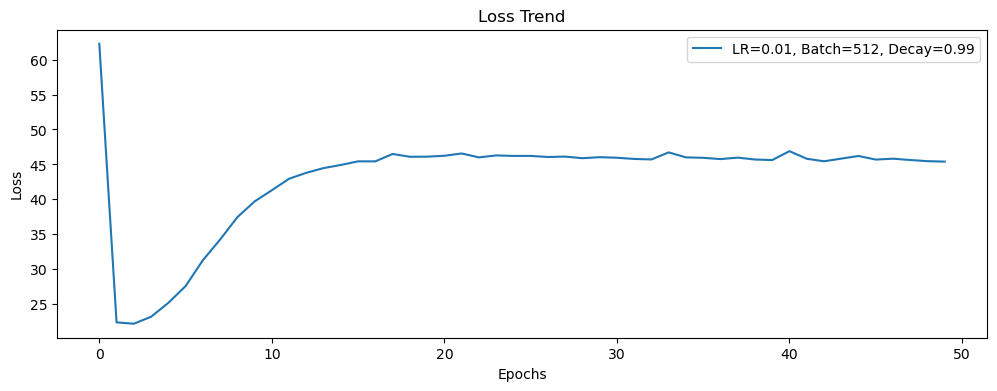

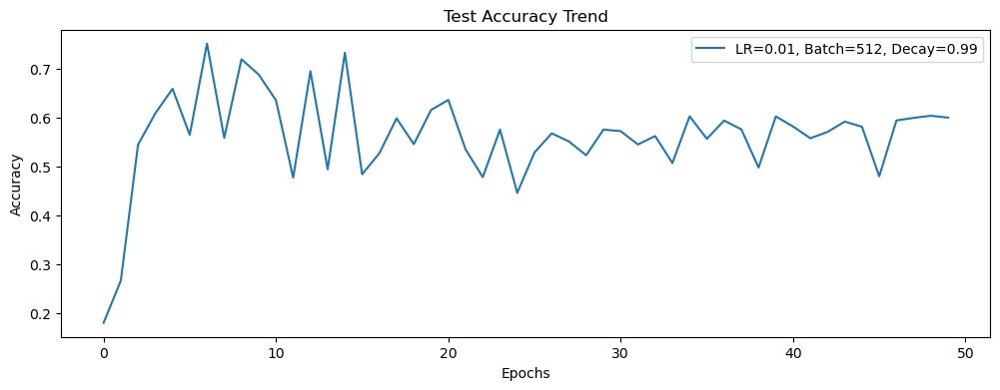

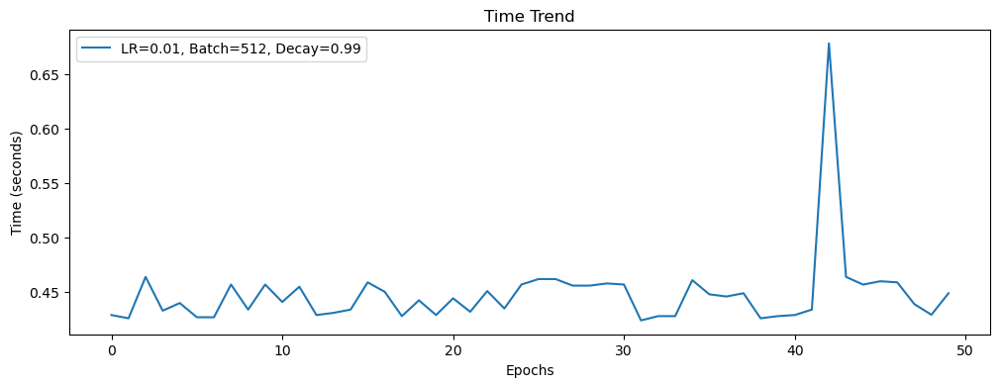

Evaluating: LR=0.01, Batch=1024, Decay=0.9
Epoch: 0, loss: 38.73407, train_acc: 42.21%, test_acc:13.00%, time_cost:0.493
Epoch: 1, loss: 13.30733, train_acc: 76.33%, test_acc:13.15%, time_cost:0.478
Epoch: 2, loss: 11.30368, train_acc: 82.12%, test_acc:16.51%, time_cost:0.478
Epoch: 3, loss: 10.76681, train_acc: 83.30%, test_acc:21.34%, time_cost:0.475
Epoch: 4, loss: 10.59280, train_acc: 84.29%, test_acc:29.29%, time_cost:0.478
Epoch: 5, loss: 10.61746, train_acc: 84.68%, test_acc:35.53%, time_cost:0.478
Epoch: 6, loss: 10.90120, train_acc: 84.78%, test_acc:39.20%, time_cost:0.481
Epoch: 7, loss: 11.28358, train_acc: 84.82%, test_acc:49.95%, time_cost:0.482
Epoch: 8, loss: 11.71119, train_acc: 84.75%, test_acc:52.38%, time_cost:0.482
Epoch: 9, loss: 12.31072, train_acc: 84.59%, test_acc:52.30%, time_cost:0.511
Epoch: 10, loss: 12.94352, train_acc: 84.36%, test_acc:49.21%, time_cost:0.492
Epoch: 11, loss: 13.39517, train_acc: 84.32%, test_acc:50.24%, time_cost:0.487
Epoch: 12, loss: 14

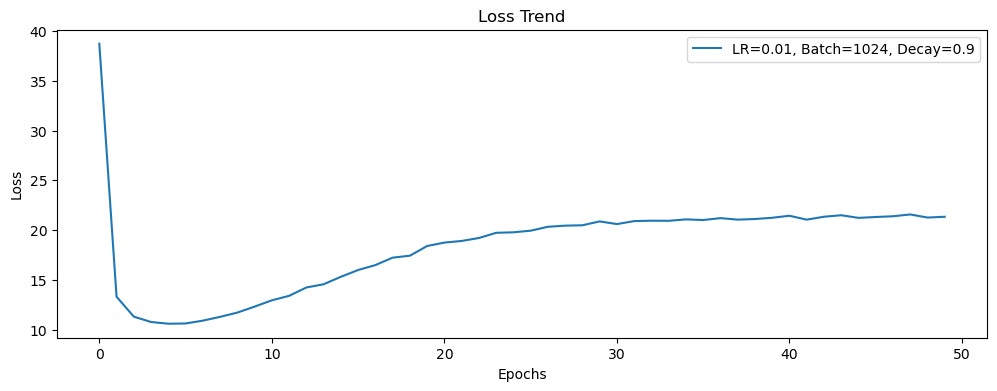

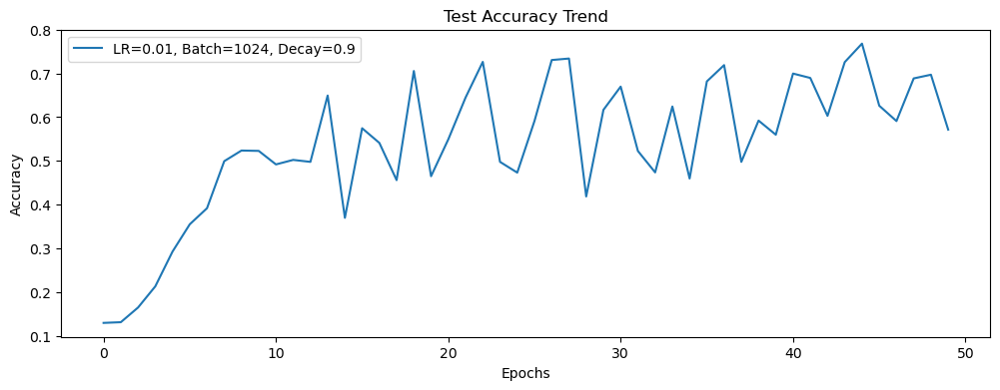

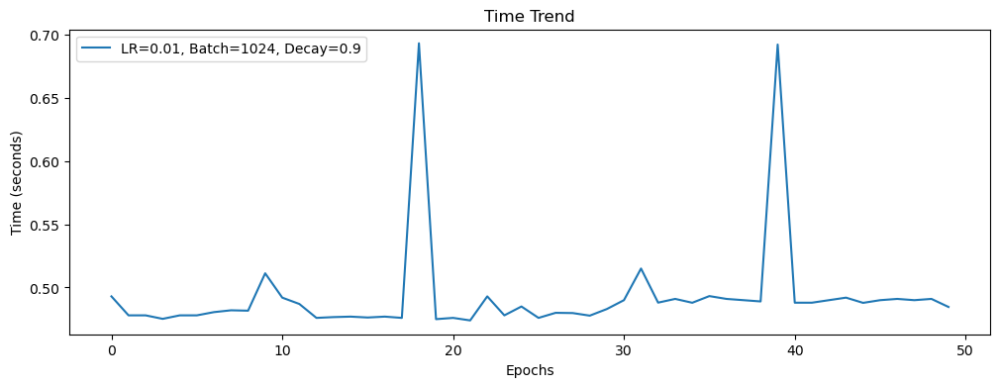

Evaluating: LR=0.01, Batch=1024, Decay=0.95
Epoch: 0, loss: 43.10648, train_acc: 45.99%, test_acc:10.51%, time_cost:0.500
Epoch: 1, loss: 12.38868, train_acc: 78.63%, test_acc:11.30%, time_cost:0.487
Epoch: 2, loss: 11.21025, train_acc: 81.81%, test_acc:18.46%, time_cost:0.491
Epoch: 3, loss: 10.84139, train_acc: 83.05%, test_acc:30.77%, time_cost:0.489
Epoch: 4, loss: 10.77437, train_acc: 83.83%, test_acc:48.02%, time_cost:0.493
Epoch: 5, loss: 10.87779, train_acc: 84.18%, test_acc:53.01%, time_cost:0.496
Epoch: 6, loss: 11.14771, train_acc: 84.14%, test_acc:62.92%, time_cost:0.491
Epoch: 7, loss: 11.48496, train_acc: 84.28%, test_acc:63.02%, time_cost:0.508
Epoch: 8, loss: 12.00365, train_acc: 83.89%, test_acc:65.58%, time_cost:0.561
Epoch: 9, loss: 12.50151, train_acc: 83.79%, test_acc:63.44%, time_cost:0.510
Epoch: 10, loss: 13.06953, train_acc: 83.73%, test_acc:62.10%, time_cost:0.505
Epoch: 11, loss: 13.79025, train_acc: 83.23%, test_acc:63.63%, time_cost:0.702
Epoch: 12, loss: 1

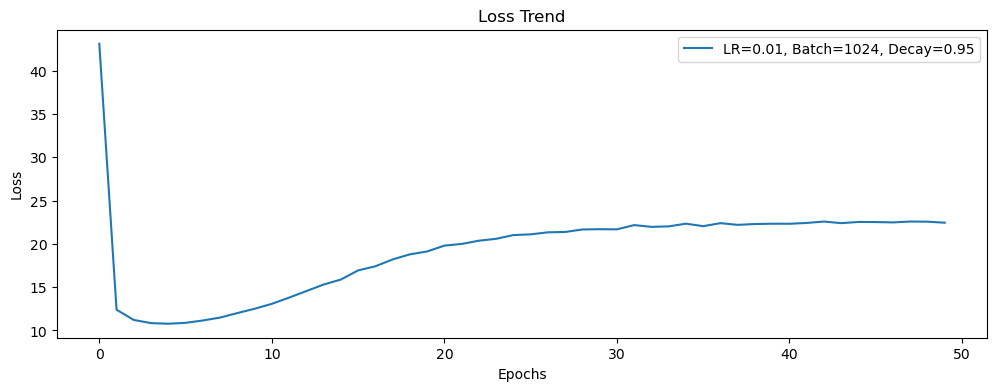

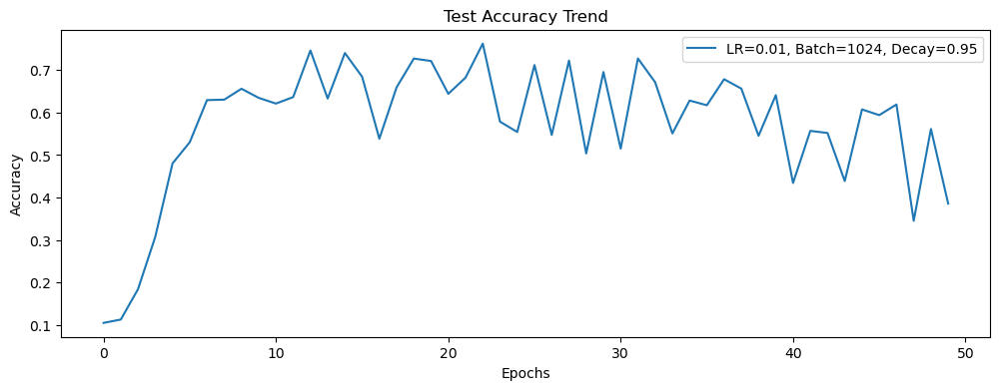

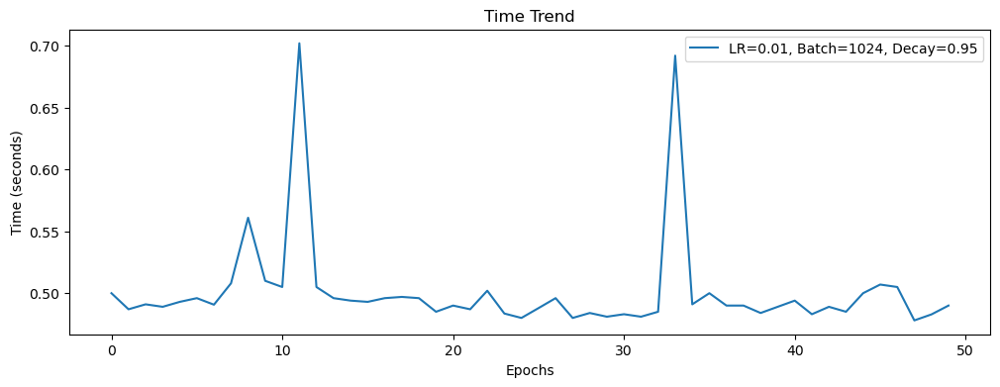

Evaluating: LR=0.01, Batch=1024, Decay=0.99
Epoch: 0, loss: 48.02807, train_acc: 44.67%, test_acc:11.36%, time_cost:0.480
Epoch: 1, loss: 13.16913, train_acc: 78.40%, test_acc:10.33%, time_cost:0.477
Epoch: 2, loss: 11.63601, train_acc: 82.35%, test_acc:14.76%, time_cost:0.484
Epoch: 3, loss: 11.11545, train_acc: 83.89%, test_acc:21.05%, time_cost:0.489
Epoch: 4, loss: 10.92305, train_acc: 84.71%, test_acc:28.29%, time_cost:0.700
Epoch: 5, loss: 10.91762, train_acc: 85.40%, test_acc:33.78%, time_cost:0.480
Epoch: 6, loss: 11.09587, train_acc: 85.59%, test_acc:39.01%, time_cost:0.479
Epoch: 7, loss: 11.47616, train_acc: 85.42%, test_acc:41.05%, time_cost:0.479
Epoch: 8, loss: 12.04517, train_acc: 85.06%, test_acc:43.50%, time_cost:0.482
Epoch: 9, loss: 12.61500, train_acc: 85.05%, test_acc:44.06%, time_cost:0.486
Epoch: 10, loss: 13.47623, train_acc: 84.39%, test_acc:53.99%, time_cost:0.488
Epoch: 11, loss: 14.15806, train_acc: 84.22%, test_acc:42.76%, time_cost:0.493
Epoch: 12, loss: 1

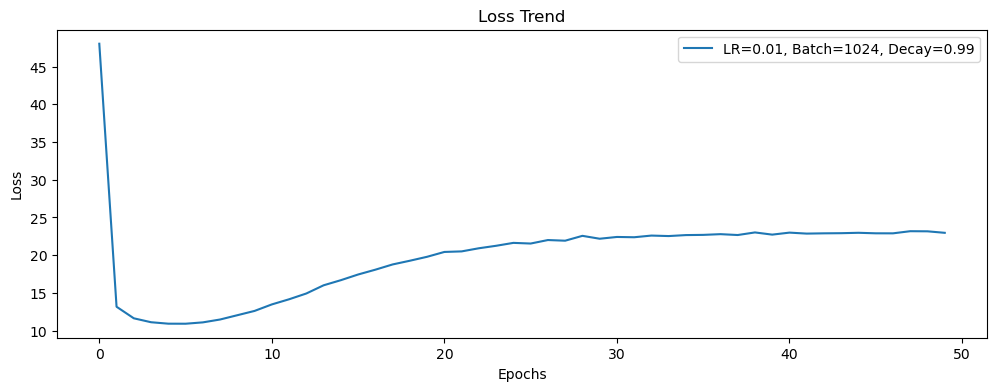

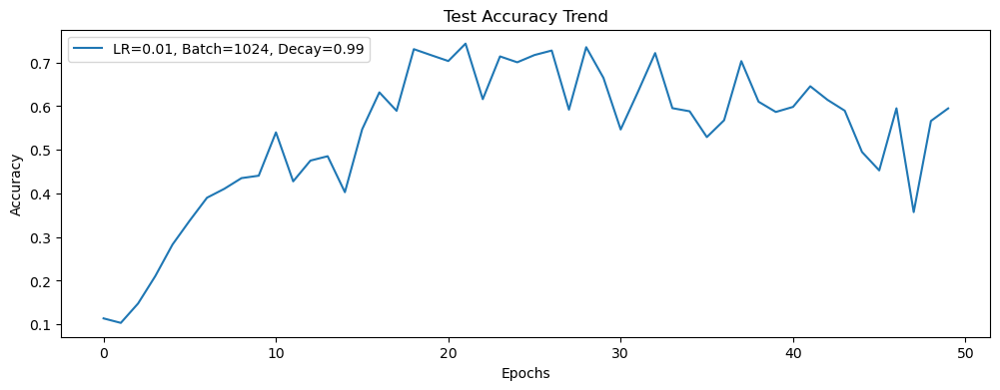

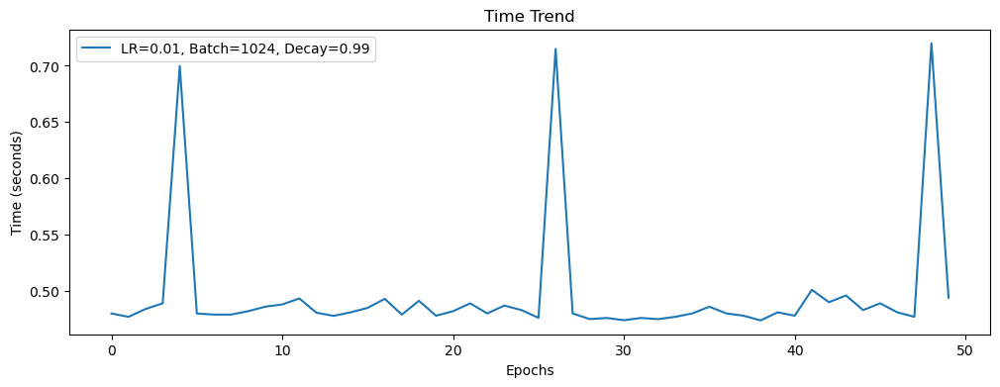

Evaluating: LR=0.1, Batch=256, Decay=0.9
Epoch: 0, loss: 217.25199, train_acc: 39.40%, test_acc:8.29%, time_cost:0.380
Epoch: 1, loss: 121.20425, train_acc: 35.13%, test_acc:37.00%, time_cost:0.377
Epoch: 2, loss: 135.94130, train_acc: 25.09%, test_acc:21.61%, time_cost:0.380
Epoch: 3, loss: 137.64071, train_acc: 22.34%, test_acc:21.61%, time_cost:0.375
Epoch: 4, loss: 135.20699, train_acc: 22.89%, test_acc:19.86%, time_cost:0.395
Epoch: 5, loss: 135.91017, train_acc: 26.02%, test_acc:32.14%, time_cost:0.427
Epoch: 6, loss: 133.59299, train_acc: 30.51%, test_acc:21.61%, time_cost:0.380
Epoch: 7, loss: 134.31054, train_acc: 30.88%, test_acc:21.61%, time_cost:0.391
Epoch: 8, loss: 128.27473, train_acc: 31.10%, test_acc:21.61%, time_cost:0.384
Epoch: 9, loss: 131.34581, train_acc: 31.67%, test_acc:21.61%, time_cost:0.377
Epoch: 10, loss: 137.89441, train_acc: 24.75%, test_acc:21.61%, time_cost:0.374
Epoch: 11, loss: 141.66643, train_acc: 22.34%, test_acc:21.61%, time_cost:0.372
Epoch: 12,

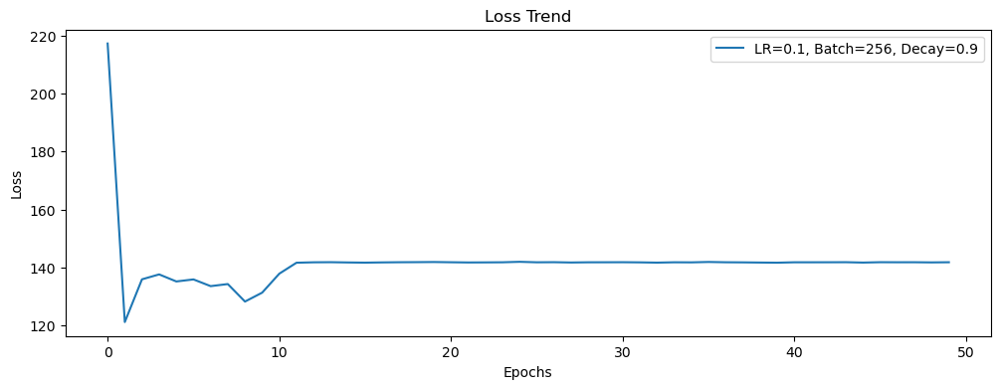

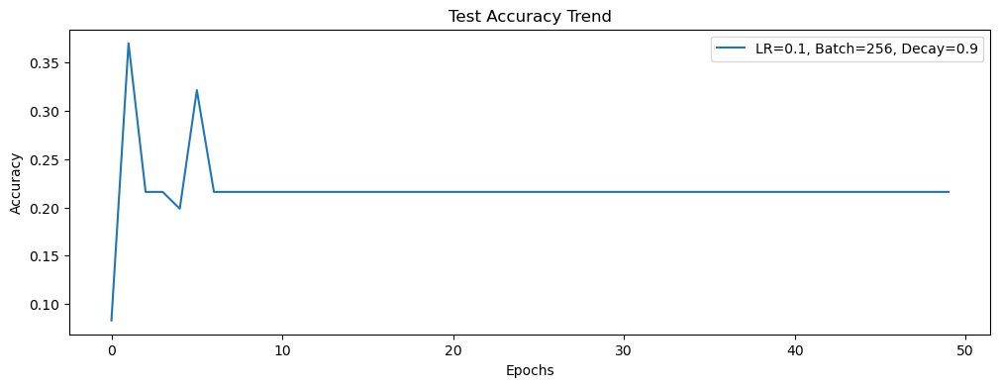

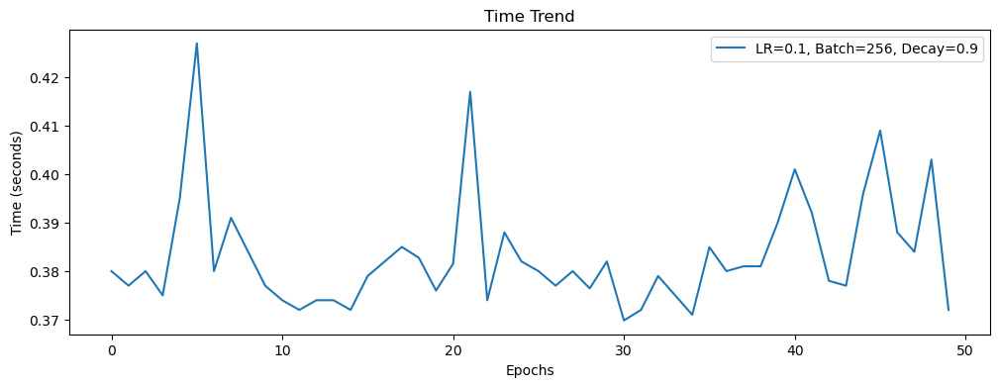

Evaluating: LR=0.1, Batch=256, Decay=0.95
Epoch: 0, loss: 197.82972, train_acc: 36.92%, test_acc:21.61%, time_cost:0.399
Epoch: 1, loss: 132.72105, train_acc: 27.94%, test_acc:21.61%, time_cost:0.388
Epoch: 2, loss: 142.06304, train_acc: 22.34%, test_acc:21.61%, time_cost:0.404
Epoch: 3, loss: 142.21735, train_acc: 22.34%, test_acc:21.61%, time_cost:0.395
Epoch: 4, loss: 142.21192, train_acc: 22.34%, test_acc:21.61%, time_cost:0.408
Epoch: 5, loss: 142.28492, train_acc: 22.34%, test_acc:21.61%, time_cost:0.386
Epoch: 6, loss: 142.28239, train_acc: 22.34%, test_acc:21.61%, time_cost:0.386
Epoch: 7, loss: 142.25059, train_acc: 22.34%, test_acc:21.61%, time_cost:0.385
Epoch: 8, loss: 142.28883, train_acc: 22.34%, test_acc:21.61%, time_cost:0.376
Epoch: 9, loss: 142.20214, train_acc: 22.34%, test_acc:21.61%, time_cost:0.380
Epoch: 10, loss: 142.31708, train_acc: 22.34%, test_acc:21.61%, time_cost:0.379
Epoch: 11, loss: 142.32976, train_acc: 22.34%, test_acc:21.61%, time_cost:0.385
Epoch: 1

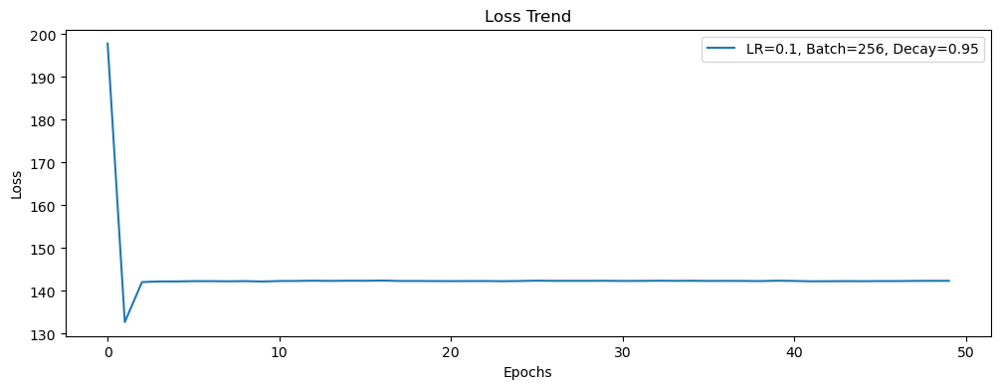

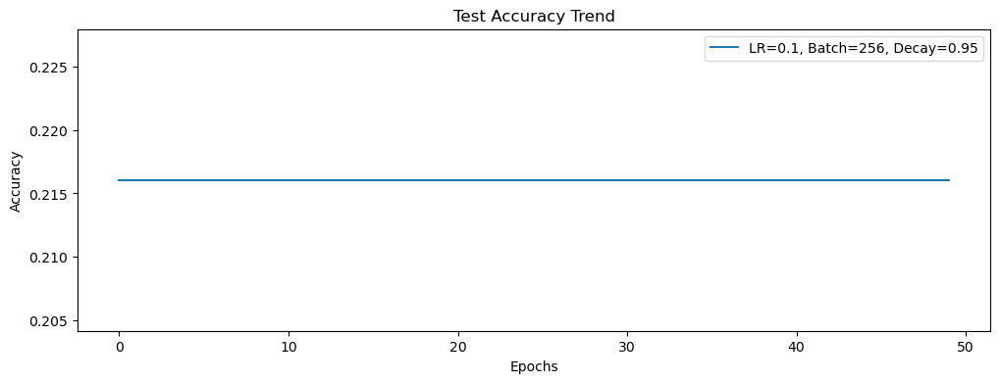

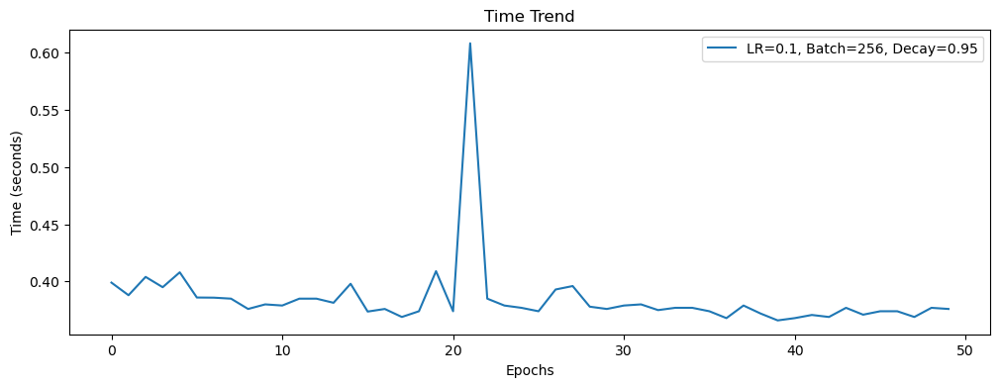

Evaluating: LR=0.1, Batch=256, Decay=0.99
Epoch: 0, loss: 228.32946, train_acc: 38.26%, test_acc:21.61%, time_cost:0.401
Epoch: 1, loss: 124.50866, train_acc: 33.65%, test_acc:21.61%, time_cost:0.385
Epoch: 2, loss: 138.67678, train_acc: 24.48%, test_acc:21.61%, time_cost:0.378
Epoch: 3, loss: 142.26113, train_acc: 22.34%, test_acc:21.61%, time_cost:0.376
Epoch: 4, loss: 142.48661, train_acc: 22.34%, test_acc:21.61%, time_cost:0.376
Epoch: 5, loss: 142.49390, train_acc: 22.34%, test_acc:21.61%, time_cost:0.411
Epoch: 6, loss: 142.50385, train_acc: 22.34%, test_acc:21.61%, time_cost:0.382
Epoch: 7, loss: 142.54846, train_acc: 22.34%, test_acc:21.61%, time_cost:0.376
Epoch: 8, loss: 142.53370, train_acc: 22.34%, test_acc:21.61%, time_cost:0.374
Epoch: 9, loss: 142.59891, train_acc: 22.34%, test_acc:21.61%, time_cost:0.370
Epoch: 10, loss: 142.57368, train_acc: 22.34%, test_acc:21.61%, time_cost:0.377
Epoch: 11, loss: 142.60113, train_acc: 22.34%, test_acc:21.61%, time_cost:0.378
Epoch: 1

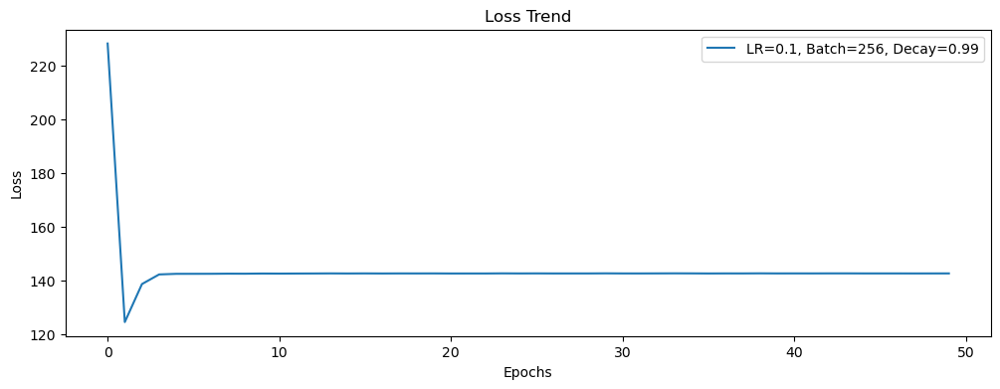

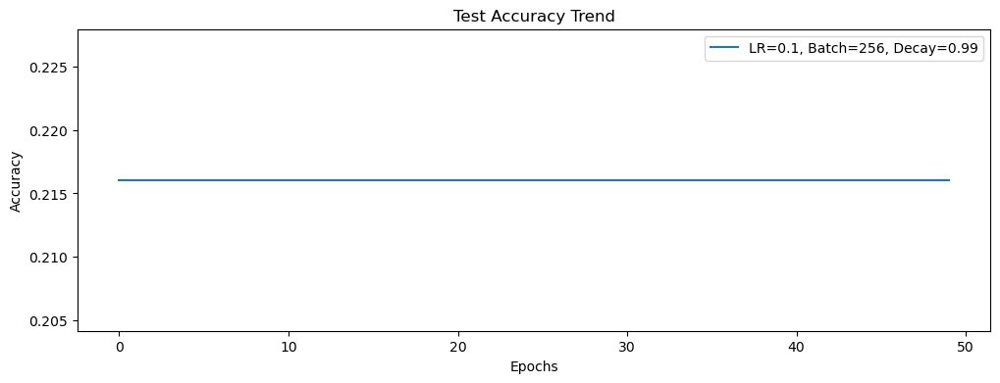

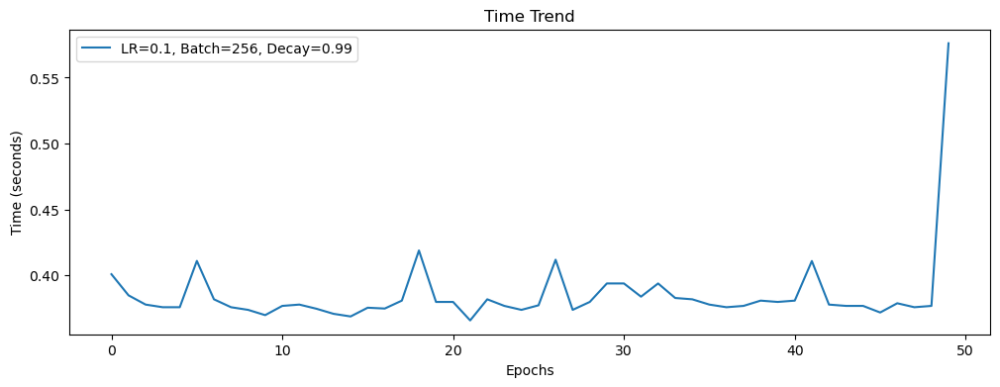

Evaluating: LR=0.1, Batch=512, Decay=0.9
Epoch: 0, loss: 166.58280, train_acc: 42.89%, test_acc:21.61%, time_cost:0.448
Epoch: 1, loss: 58.77171, train_acc: 41.46%, test_acc:21.61%, time_cost:0.425
Epoch: 2, loss: 59.07645, train_acc: 36.82%, test_acc:21.61%, time_cost:0.429
Epoch: 3, loss: 59.96657, train_acc: 35.76%, test_acc:21.61%, time_cost:0.425
Epoch: 4, loss: 66.85376, train_acc: 26.14%, test_acc:21.61%, time_cost:0.429
Epoch: 5, loss: 70.37555, train_acc: 22.34%, test_acc:21.61%, time_cost:0.431
Epoch: 6, loss: 70.58402, train_acc: 22.34%, test_acc:21.61%, time_cost:0.434
Epoch: 7, loss: 70.35907, train_acc: 22.34%, test_acc:21.61%, time_cost:0.453
Epoch: 8, loss: 70.18959, train_acc: 22.34%, test_acc:21.61%, time_cost:0.439
Epoch: 9, loss: 70.01327, train_acc: 22.34%, test_acc:21.61%, time_cost:0.428
Epoch: 10, loss: 69.96659, train_acc: 22.34%, test_acc:21.61%, time_cost:0.436
Epoch: 11, loss: 69.87827, train_acc: 22.34%, test_acc:21.61%, time_cost:0.441
Epoch: 12, loss: 69.

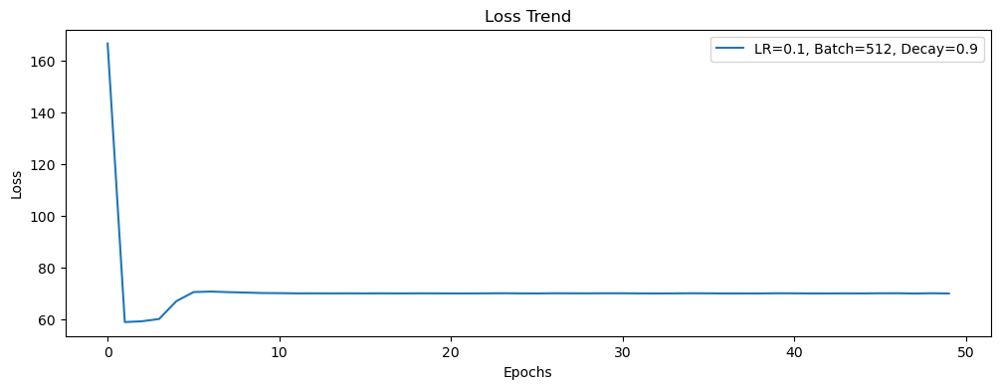

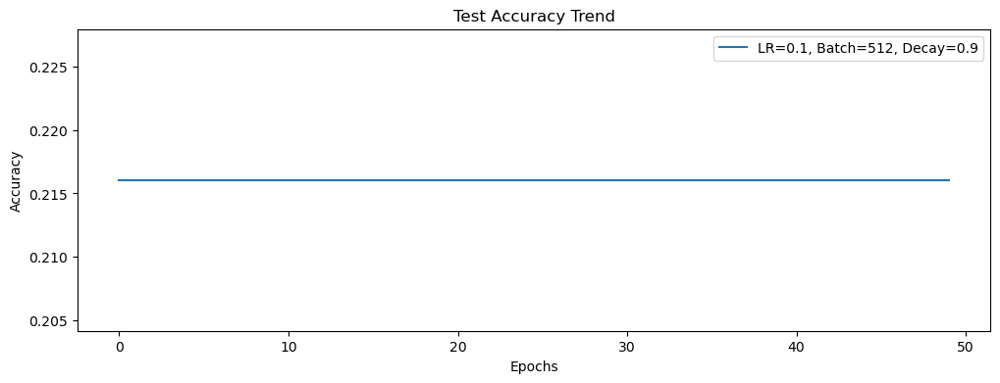

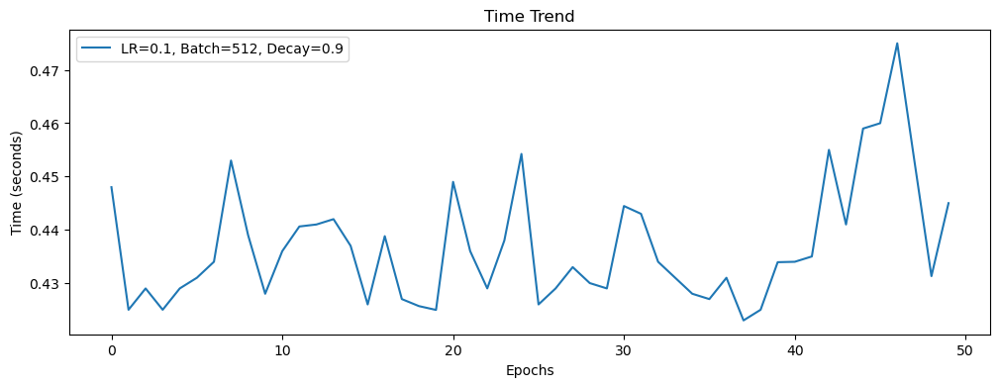

Evaluating: LR=0.1, Batch=512, Decay=0.95
Epoch: 0, loss: 153.43498, train_acc: 40.23%, test_acc:21.61%, time_cost:0.450
Epoch: 1, loss: 60.98685, train_acc: 37.81%, test_acc:21.61%, time_cost:0.433
Epoch: 2, loss: 65.09982, train_acc: 29.61%, test_acc:21.61%, time_cost:0.436
Epoch: 3, loss: 71.21331, train_acc: 22.34%, test_acc:21.61%, time_cost:0.441
Epoch: 4, loss: 71.17524, train_acc: 22.34%, test_acc:21.61%, time_cost:0.468
Epoch: 5, loss: 71.16919, train_acc: 22.34%, test_acc:21.61%, time_cost:0.469
Epoch: 6, loss: 71.16177, train_acc: 22.34%, test_acc:21.61%, time_cost:0.451
Epoch: 7, loss: 71.16918, train_acc: 22.34%, test_acc:21.61%, time_cost:0.429
Epoch: 8, loss: 71.16624, train_acc: 22.34%, test_acc:21.61%, time_cost:0.429
Epoch: 9, loss: 71.16806, train_acc: 22.34%, test_acc:21.61%, time_cost:0.636
Epoch: 10, loss: 71.15844, train_acc: 22.34%, test_acc:21.61%, time_cost:0.436
Epoch: 11, loss: 71.17268, train_acc: 22.34%, test_acc:21.61%, time_cost:0.432
Epoch: 12, loss: 71

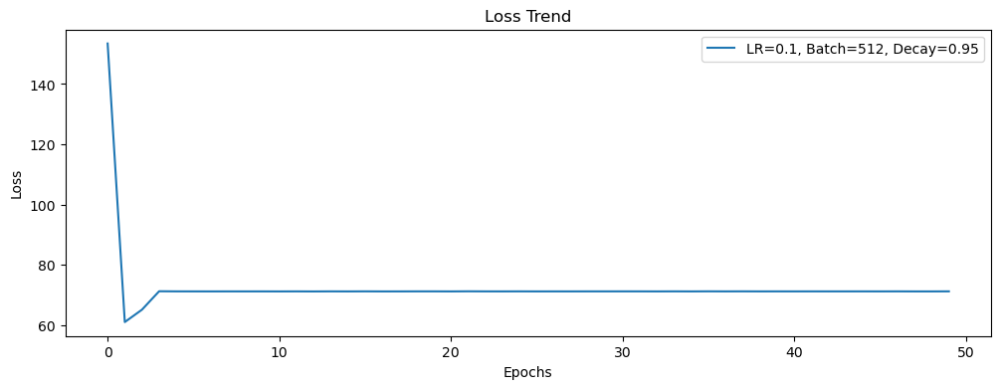

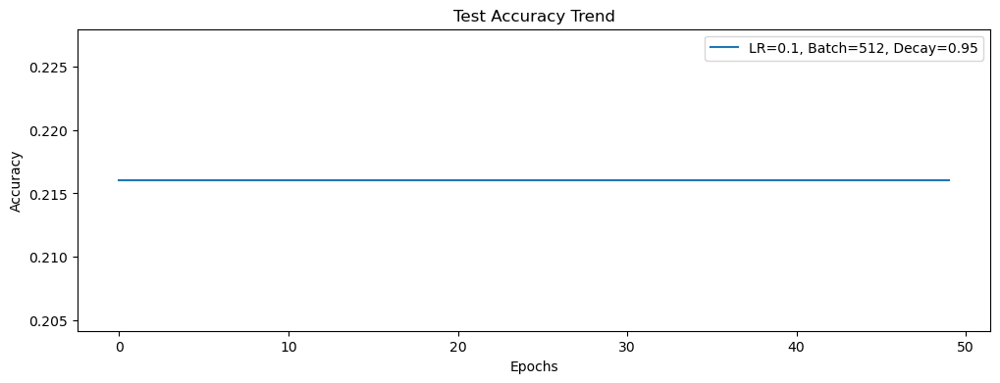

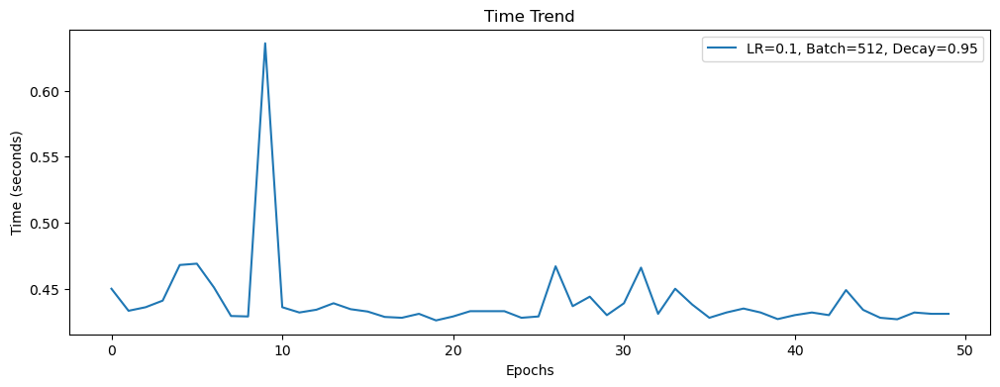

Evaluating: LR=0.1, Batch=512, Decay=0.99
Epoch: 0, loss: 137.57979, train_acc: 40.91%, test_acc:21.61%, time_cost:0.446
Epoch: 1, loss: 60.59963, train_acc: 37.60%, test_acc:21.61%, time_cost:0.440
Epoch: 2, loss: 61.20168, train_acc: 35.48%, test_acc:21.61%, time_cost:0.427
Epoch: 3, loss: 61.56548, train_acc: 34.18%, test_acc:30.88%, time_cost:0.429
Epoch: 4, loss: 61.67485, train_acc: 34.28%, test_acc:21.61%, time_cost:0.647
Epoch: 5, loss: 71.07541, train_acc: 22.34%, test_acc:21.61%, time_cost:0.429
Epoch: 6, loss: 71.14125, train_acc: 22.34%, test_acc:21.61%, time_cost:0.442
Epoch: 7, loss: 71.14955, train_acc: 22.34%, test_acc:21.61%, time_cost:0.430
Epoch: 8, loss: 71.18944, train_acc: 22.34%, test_acc:21.61%, time_cost:0.434
Epoch: 9, loss: 71.23482, train_acc: 22.34%, test_acc:21.61%, time_cost:0.428
Epoch: 10, loss: 71.23349, train_acc: 22.34%, test_acc:21.61%, time_cost:0.432
Epoch: 11, loss: 71.24932, train_acc: 22.34%, test_acc:21.61%, time_cost:0.436
Epoch: 12, loss: 71

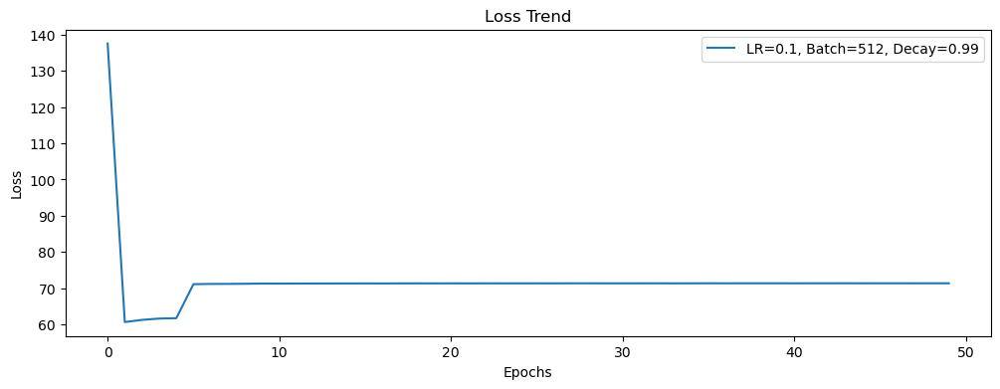

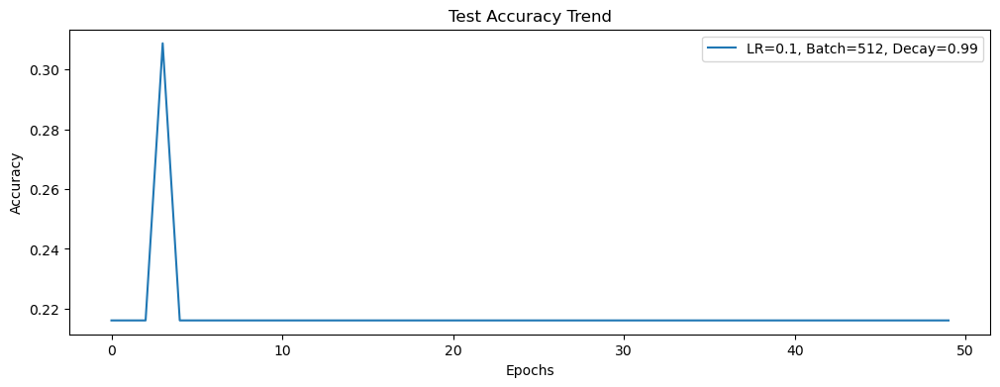

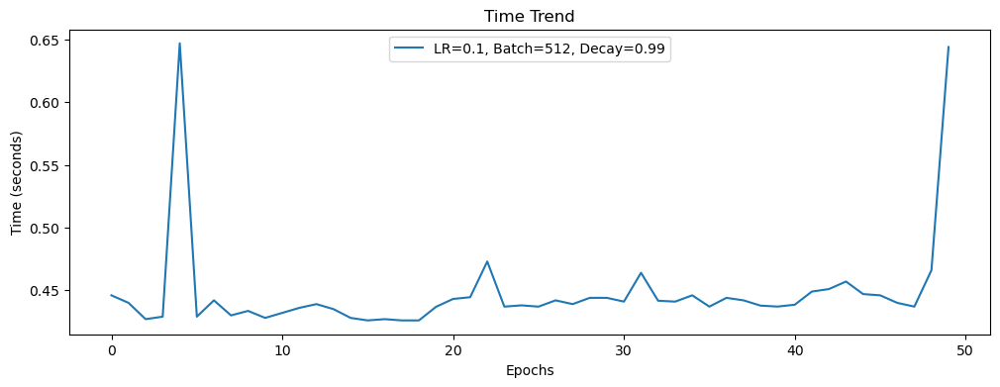

Evaluating: LR=0.1, Batch=1024, Decay=0.9
Epoch: 0, loss: 138.99455, train_acc: 28.35%, test_acc:21.61%, time_cost:0.532
Epoch: 1, loss: 28.62651, train_acc: 47.65%, test_acc:21.61%, time_cost:0.488
Epoch: 2, loss: 29.86009, train_acc: 41.22%, test_acc:21.61%, time_cost:0.487
Epoch: 3, loss: 29.67344, train_acc: 38.96%, test_acc:21.61%, time_cost:0.491
Epoch: 4, loss: 29.74160, train_acc: 35.50%, test_acc:24.51%, time_cost:0.488
Epoch: 5, loss: 30.25459, train_acc: 35.68%, test_acc:21.61%, time_cost:0.490
Epoch: 6, loss: 31.13547, train_acc: 32.57%, test_acc:21.61%, time_cost:0.490
Epoch: 7, loss: 32.01151, train_acc: 31.73%, test_acc:34.26%, time_cost:0.478
Epoch: 8, loss: 31.94672, train_acc: 31.33%, test_acc:21.61%, time_cost:0.479
Epoch: 9, loss: 33.28007, train_acc: 25.23%, test_acc:21.61%, time_cost:0.485
Epoch: 10, loss: 33.23619, train_acc: 23.86%, test_acc:21.61%, time_cost:0.490
Epoch: 11, loss: 32.83511, train_acc: 24.84%, test_acc:21.61%, time_cost:0.481
Epoch: 12, loss: 32

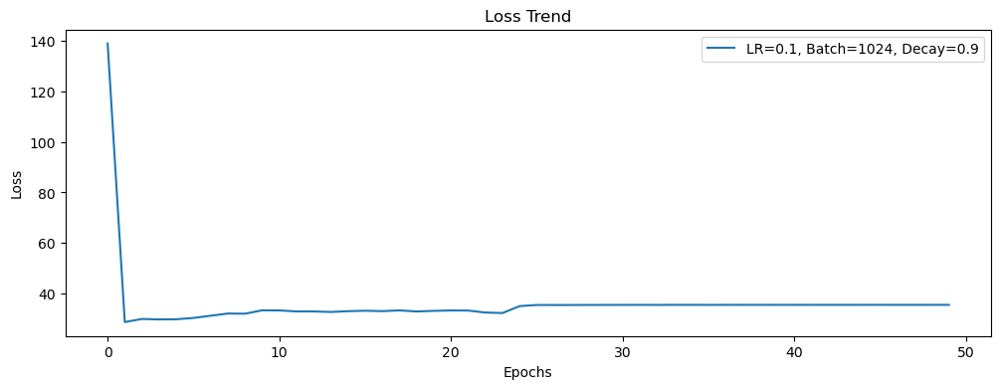

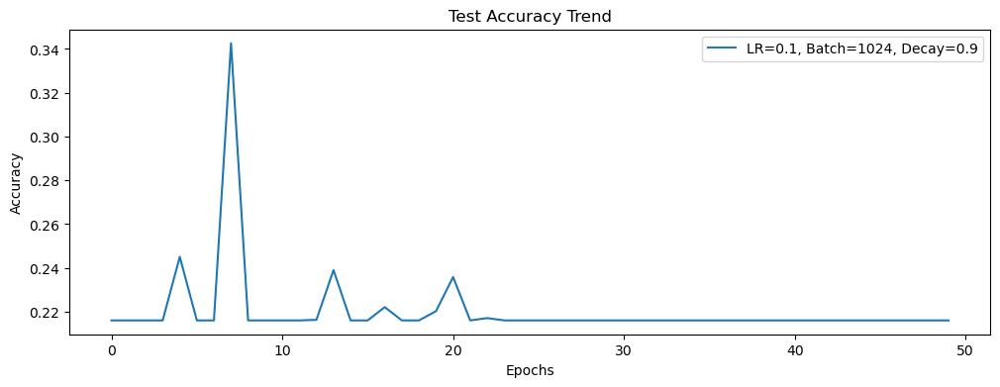

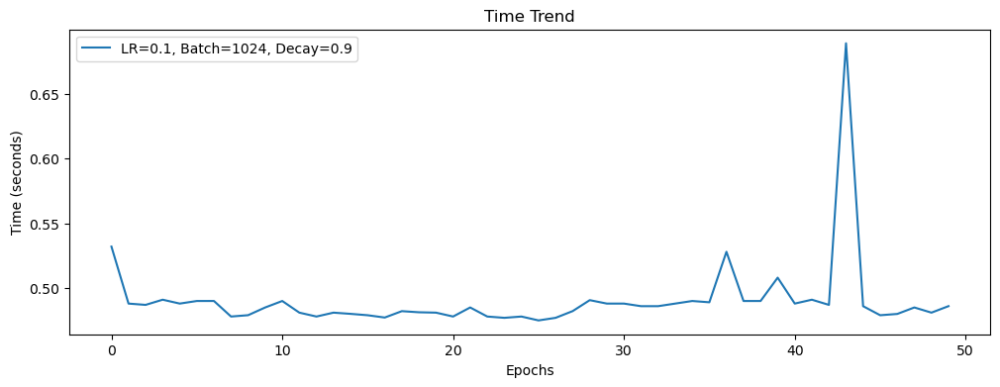

Evaluating: LR=0.1, Batch=1024, Decay=0.95
Epoch: 0, loss: 140.42563, train_acc: 30.51%, test_acc:21.61%, time_cost:0.489
Epoch: 1, loss: 28.69404, train_acc: 45.72%, test_acc:21.61%, time_cost:0.480
Epoch: 2, loss: 29.73864, train_acc: 42.29%, test_acc:21.61%, time_cost:0.481
Epoch: 3, loss: 31.36158, train_acc: 35.89%, test_acc:21.61%, time_cost:0.479
Epoch: 4, loss: 31.19143, train_acc: 34.29%, test_acc:21.61%, time_cost:0.480
Epoch: 5, loss: 35.56382, train_acc: 22.34%, test_acc:21.61%, time_cost:0.480
Epoch: 6, loss: 35.54387, train_acc: 22.34%, test_acc:21.61%, time_cost:0.478
Epoch: 7, loss: 35.54141, train_acc: 22.34%, test_acc:21.61%, time_cost:0.498
Epoch: 8, loss: 35.54341, train_acc: 22.34%, test_acc:21.61%, time_cost:0.476
Epoch: 9, loss: 35.54223, train_acc: 22.34%, test_acc:21.61%, time_cost:0.477
Epoch: 10, loss: 35.54905, train_acc: 22.34%, test_acc:21.61%, time_cost:0.477
Epoch: 11, loss: 35.54559, train_acc: 22.34%, test_acc:21.61%, time_cost:0.479
Epoch: 12, loss: 3

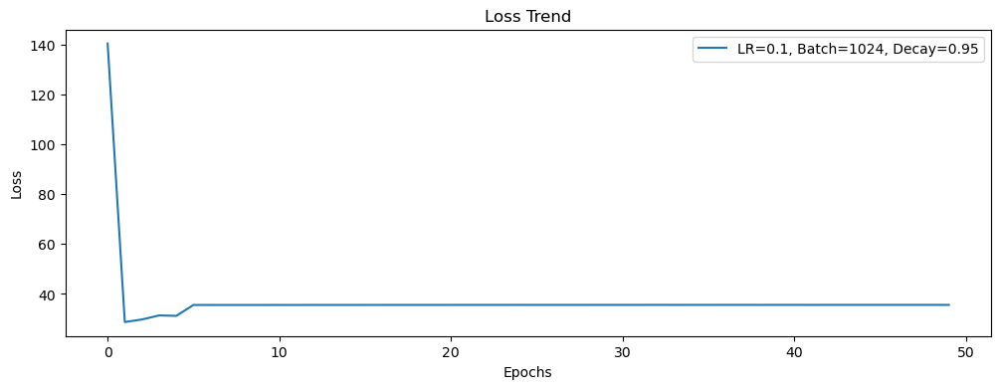

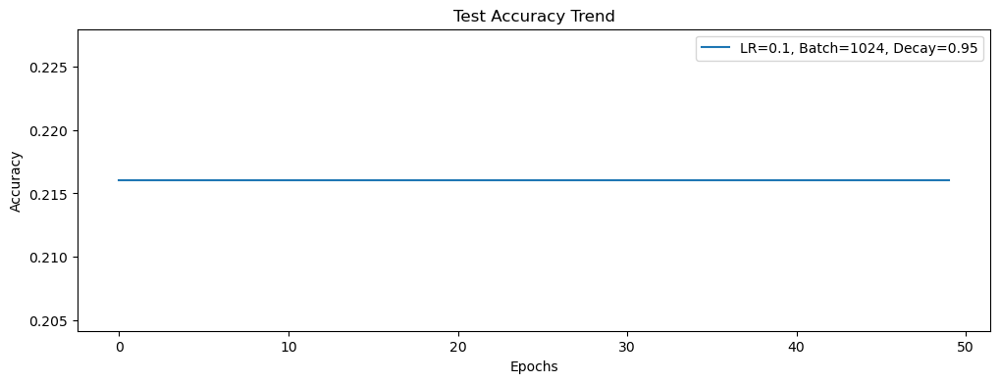

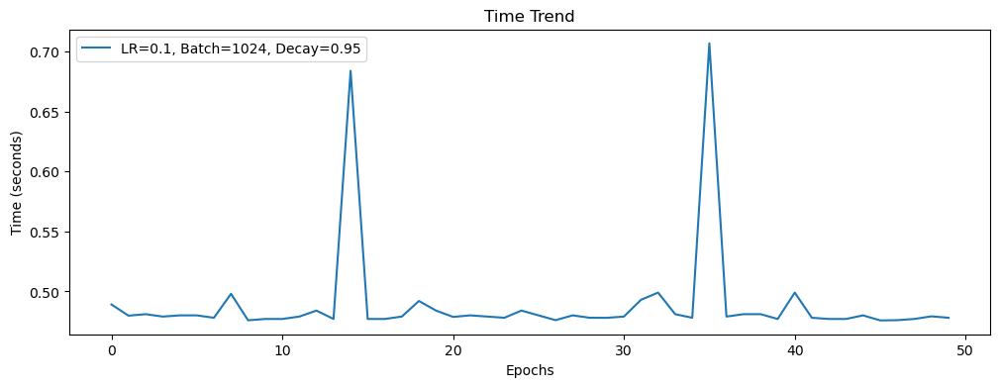

Evaluating: LR=0.1, Batch=1024, Decay=0.99
Epoch: 0, loss: 137.80298, train_acc: 32.17%, test_acc:21.61%, time_cost:0.540
Epoch: 1, loss: 28.67199, train_acc: 45.84%, test_acc:21.61%, time_cost:0.508
Epoch: 2, loss: 30.34661, train_acc: 39.31%, test_acc:21.61%, time_cost:0.502
Epoch: 3, loss: 30.47940, train_acc: 34.76%, test_acc:21.61%, time_cost:0.483
Epoch: 4, loss: 30.40949, train_acc: 34.43%, test_acc:21.61%, time_cost:0.485
Epoch: 5, loss: 30.64713, train_acc: 35.01%, test_acc:31.33%, time_cost:0.481
Epoch: 6, loss: 30.62520, train_acc: 34.39%, test_acc:21.61%, time_cost:0.482
Epoch: 7, loss: 31.49213, train_acc: 31.53%, test_acc:21.61%, time_cost:0.715
Epoch: 8, loss: 30.79902, train_acc: 33.50%, test_acc:30.88%, time_cost:0.485
Epoch: 9, loss: 33.80472, train_acc: 25.22%, test_acc:21.61%, time_cost:0.483
Epoch: 10, loss: 35.50092, train_acc: 22.34%, test_acc:21.61%, time_cost:0.481
Epoch: 11, loss: 35.58732, train_acc: 22.34%, test_acc:21.61%, time_cost:0.480
Epoch: 12, loss: 3

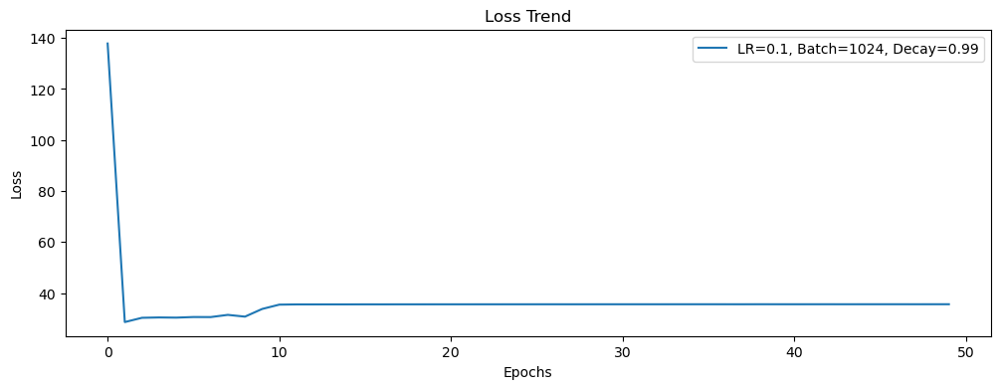

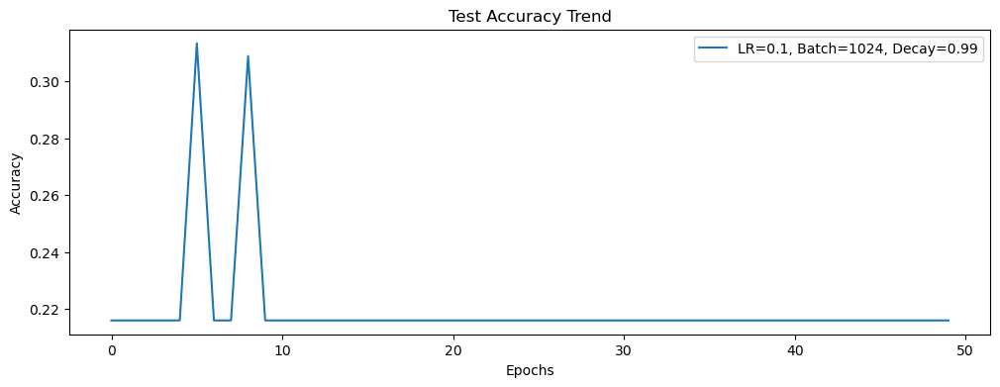

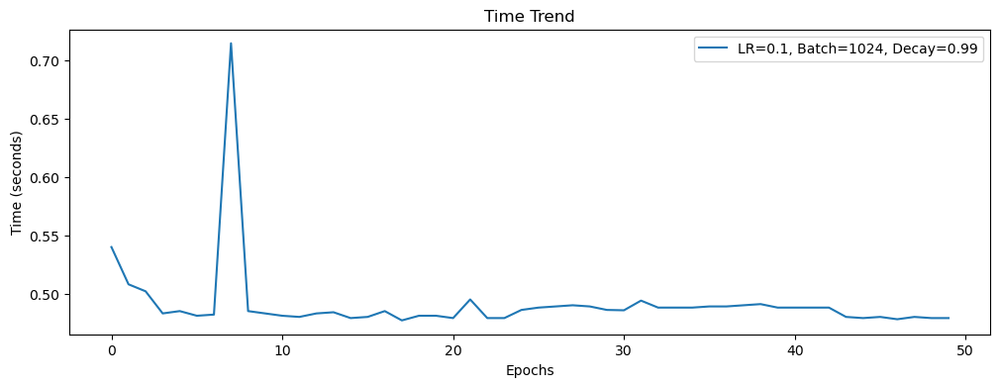

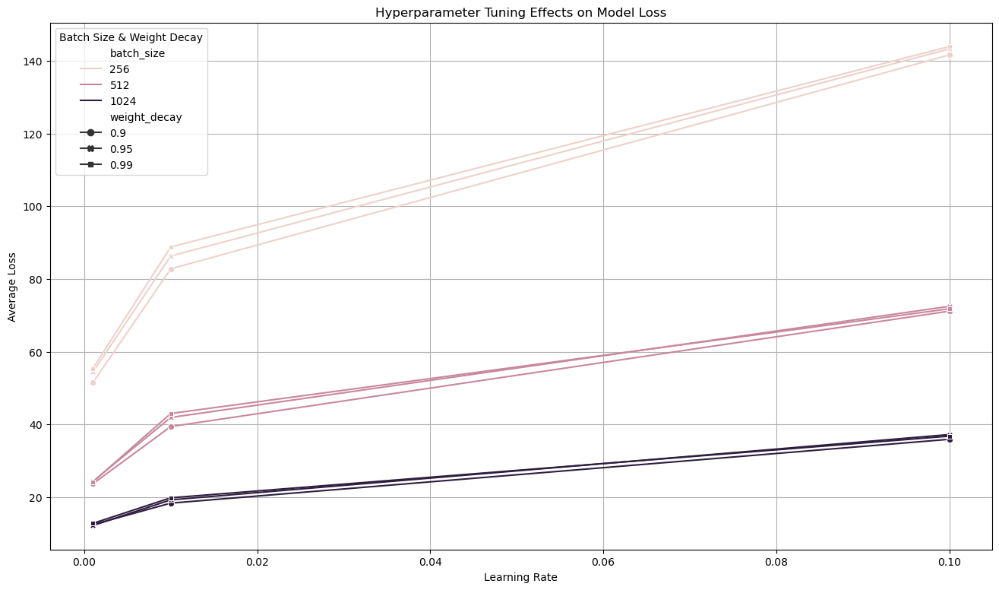

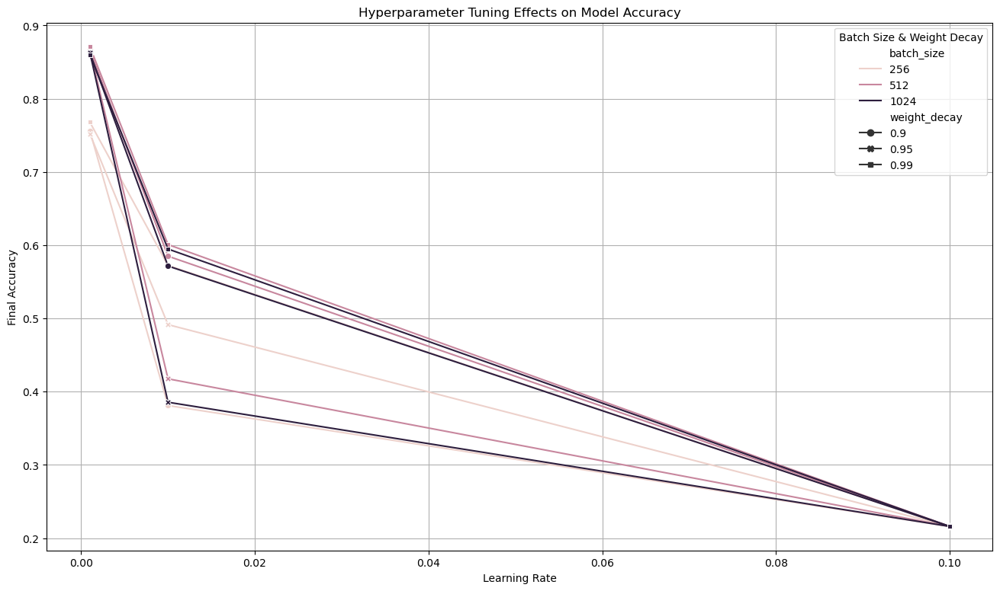

In [ ]:
results = []
for lr in param_grid['learning_rate']:
    for batch in param_grid['batch_size']:
        for decay in param_grid['weight_decay']:
            print(f"Evaluating: LR={lr}, Batch={batch}, Decay={decay}")
            model, loss_list, acc_list, test_acc_list, time_list = eval_cnn(in_channel, n_class, True, epochs, lr, decay, batch)
            results.append({
                'learning_rate': lr,
                'batch_size': batch,
                'weight_decay': decay,
                'final_accuracy': test_acc_list[-1],
                'average_loss': np.mean(loss_list),
                'total_time': sum(time_list),
                'loss_list': loss_list,
                'acc_list': acc_list,
                'time_list': time_list
            })

            # Visualize loss_list
            plt.figure(figsize=(12, 4))
            plt.plot(loss_list)
            plt.title('Loss Trend')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend(labels=[f'LR={lr}, Batch={batch}, Decay={decay}'])  # Update legend label
            plt.show()

            # Visualize test_acc_list
            plt.figure(figsize=(12, 4))
            plt.plot(test_acc_list)
            plt.title('Test Accuracy Trend')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend(labels=[f'LR={lr}, Batch={batch}, Decay={decay}'])  # Update legend label
            plt.show()

            # Visualize time_list
            plt.figure(figsize=(12, 4))
            plt.plot(time_list)
            plt.title('Time Trend')
            plt.xlabel('Epochs')
            plt.ylabel('Time (seconds)')
            plt.legend(labels=[f'LR={lr}, Batch={batch}, Decay={decay}'])  # Update legend label
            plt.show()

# save results as dataframe
results_df = pd.DataFrame(results)

# plot hyperparameter tuning effects on model
plt.figure(figsize=(16, 9))
sns.lineplot(data=results_df, x='learning_rate', y='average_loss', hue='batch_size', style='weight_decay', markers=True, dashes=False)
plt.title('Hyperparameter Tuning Effects on Model Loss')
plt.xlabel('Learning Rate')
plt.ylabel('Average Loss')
plt.legend(title='Batch Size & Weight Decay')
plt.grid(True)

plt.figure(figsize=(16, 9))
sns.lineplot(data=results_df, x='learning_rate', y='final_accuracy', hue='batch_size', style='weight_decay', markers=True, dashes=False)
plt.title('Hyperparameter Tuning Effects on Model Accuracy')
plt.xlabel('Learning Rate')
plt.ylabel('Final Accuracy')
plt.legend(title='Batch Size & Weight Decay')
plt.grid(True)

plt.show()